In [1]:
import os
os.chdir('..')

# IMPORTS

In [2]:
import matplotlib
from matplotlib import rcParams, cycler

# matplotlib.use('Agg')
CUDA_VISIBLE_DEVICES = ""
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np
import random
import json
import copy
import torch
import sklearn
from itertools import cycle
from torch import nn
import os
from src.utils.pool_metrics import get_PCC, get_qc_euclidean, get_batches_euclidean, get_euclidean
from scipy.spatial.distance import cdist, pdist

from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.model_selection import StratifiedGroupKFold, StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
from umap import UMAP

from src.utils.pool_metrics import log_pool_metrics
from src.dl.models.pytorch.aedann import ReverseLayerF
from src.dl.models.pytorch.aedann import Encoder2, Decoder2, Classifier, Classifier2, Classifier3, DispAct, MeanAct
from src.dl.models.pytorch.utils.loggings import TensorboardLoggingAE, log_input_ordination, \
    log_confusion_matrix, log_plots
from src.dl.models.pytorch.utils.dataset import get_loaders
from src.utils.utils import scale_data, get_unique_labels, scale_data_per_batch
from src.dl.models.pytorch.utils.utils import get_optimizer, to_categorical, get_empty_dicts, get_empty_traces, \
    log_traces, get_best_loss_from_tb, get_best_acc_from_tb, get_best_values, add_to_logger
from src.dl.models.pytorch.utils.plotting import confidence_ellipse
from src.dl.models.pytorch.utils.stochastic import GaussianSample
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA


import warnings
from datetime import datetime
from sklearn.preprocessing import OneHotEncoder
from tabulate import tabulate

warnings.filterwarnings("ignore")

random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

strategy = 'CU_DEM-AD'
csv_name = 'amide_data.csv'
bad_batches = ''
remove_zeros = 0
log_stuff = True
best_correction = False
n_meta = 0
train_models = False

In [3]:
from skopt.space import Real, Integer, Categorical
from sklearn.ensemble import RandomForestClassifier
rfc_space = [
    # Integer(100, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 100, 'uniform', name="max_features"),
    Integer(2, 10, 'uniform', name="min_samples_split"),
    Integer(1, 10, 'uniform', name="min_samples_leaf"),
    Integer(1, 1000, 'uniform', name="n_estimators"),
    Categorical(['gini', 'entropy'], name="criterion"),
    Categorical([True, False], name="oob_score"),
    Categorical(['balanced'], name="class_weight"),
]
linsvc_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Real(1e-4, 1, 'log-uniform', name='tol'),
    Integer(1, 1000, 'uniform', name='max_iter'),
    Categorical(['l2'], name='penalty'),
    Real(1e-3, 10000, 'uniform', name='C'),
    Categorical(['balanced'], name='class_weight'),

]
logreg_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 20000, 'uniform', name='max_iter'),
    Real(1e-3, 20000, 'uniform', name='C'),
    Categorical(['saga'], name='solver'),
    Categorical(['l1', 'l2'], name='penalty'),
    Categorical([True, False], name='fit_intercept'),
    Categorical(['balanced'], name='class_weight'),
]


In [4]:
def log_shap(run, ae, best_lists, cols, n_meta):
    # explain all the predictions in the test set
    # explainer = shap.KernelExplainer(svc_linear.predict_proba, X_train[:100])
    if n_meta > 0:
        X_test = torch.Tensor(pd.concat((best_lists['inputs']['test'], best_lists['meta']['test']), 1).values).to('cuda')
        X_test_df = pd.DataFrame(pd.concat((best_lists['inputs']['test'], best_lists['meta']['test']), 1).values, columns=list(cols) + ['age', 'sex'])
    else:
        X_test = torch.Tensor(best_lists['inputs']['test'].values).to('cuda')
        X_test_df = best_lists['inputs']['test']

    explainer = shap.DeepExplainer(ae, X_test)
    # No need to scaler the data, the inputs data are already scaled
    # X_test = scale_data(X_test)
    shap_values = explainer.shap_values(X_test)
    # shap.force_plot(explainer.expected_value[0], shap_values[0], X_test[:20])
    shap.summary_plot(shap_values, X_test_df, show=False)
    f = plt.gcf()
    run[f'shap/test_values'].upload(f)

    if n_meta > 0:
        X_valid = torch.Tensor(pd.concat((best_lists['inputs']['valid'], best_lists['meta']['valid']), 1).values).to('cuda')
        X_valid_df = pd.DataFrame(pd.concat((best_lists['inputs']['valid'], best_lists['meta']['valid']), 1).values, columns=list(cols) + ['age', 'sex'])
    else:
        X_valid = torch.Tensor(best_lists['inputs']['valid'].values).to('cuda')
        X_valid_df = best_lists['inputs']['valid']
    explainer = shap.DeepExplainer(ae, X_valid)
    # No need to scaler the data, the inputs data are already scaled
    # X_test = scale_data(X_test)
    shap_values = explainer.shap_values(X_valid)
    # shap.force_plot(explainer.expected_value[0], shap_values[0], X_test[:20])
    shap.summary_plot(shap_values, X_valid_df, show=False)
    f = plt.gcf()
    run[f'shap/valid_values'].upload(f)



In [5]:
class SHAPAutoEncoder2(nn.Module):
    def __init__(self, in_shape, n_batches, nb_classes, n_emb, n_meta, mapper, variational, layer1, layer2, dropout, zinb=False,
                 conditional=False, add_noise=False, tied_weights=0, use_gnn=False, device='cuda'):
        super(SHAPAutoEncoder2, self).__init__()
        self.n_emb = n_emb
        self.add_noise = add_noise
        self.n_meta = n_meta
        self.device = device
        self.use_gnn = use_gnn
        self.use_mapper = mapper
        self.n_batches = n_batches
        self.zinb = zinb
        self.tied_weights = tied_weights
        self.flow_type = 'vanilla'
        # self.gnn1 = GCNConv(in_shape, in_shape)
        self.enc = Encoder2(in_shape + n_meta, layer1, layer2, dropout)
        if conditional:
            self.dec = Decoder2(in_shape + n_meta, n_batches, layer2, layer1, dropout)
        else:
            self.dec = Decoder2(in_shape + n_meta, 0, layer2, layer1, dropout)
        self.mapper = Classifier(n_batches + 1, layer2)

        if variational:
            self.gaussian_sampling = GaussianSample(layer2, layer2, device)
        else:
            self.gaussian_sampling = None
        self.dann_discriminator = Classifier2(layer2, 64, n_batches)
        self.classifier = Classifier(layer2 + n_emb, nb_classes)
        self._dec_mean = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), nn.Sigmoid())
        self._dec_disp = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), DispAct())
        self._dec_pi = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), nn.Sigmoid())
        self.random_init(nn.init.xavier_uniform_)

    def forward(self, x, batches=None, sampling=False, beta=1.0):
        if self.n_emb > 0:
            meta_values = x[:, -2:]
        if self.n_meta > 0:
            x = x[:, :-2]
        # rec = {}
        if self.add_noise:
            x = x * (Variable(x.data.new(x.size()).normal_(0, 0.1)) > -.1).type_as(x)
        # if self.use_gnn:
        #     x = self.gnn1(x)
        try:
            enc = self.enc(x).squeeze()
        except:
            pass
        if self.gaussian_sampling is not None:
            if sampling:
                enc, mu, log_var = self.gaussian_sampling(enc, train=True, beta=beta)
                # Kullback-Leibler Divergence
                # kl = self._kld(enc, (mu, log_var))
                mean_sq = mu * mu
                std = log_var.exp().sqrt()
                stddev_sq = std * std
                # kl = 0.5 * torch.mean(mean_sq + stddev_sq - torch.log(stddev_sq) - 1)
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
            else:
                enc, _, _ = self.gaussian_sampling(enc, train=False)
                kl = torch.Tensor([0])
        else:
            kl = torch.Tensor([0])
        if self.use_mapper:
            bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            # needs the batch
            enc_be = enc + self.mapper(bs).squeeze()
        else:
            enc_be = enc
        if not self.tied_weights:
            try:
                bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            except:
                bs = to_categorical(batches.long(), self.n_batches + 1).to(self.device).float()

            rec = {"mean": self.dec(enc_be, bs)}
        elif not self.zinb:
            rec = [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]
            rec += [F.relu(F.linear(rec[0], self.enc.linear1[0].weight.t()))]
            rec = {"mean": rec}  # TODO rec does not need to be a dict no more
        elif self.zinb:
            rec = {"mean": [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]}

        if self.n_emb > 0:
            out = self.classifier(torch.cat((enc, meta_values), 1))
        else:
            out = self.classifier(enc)

        return out

    def random_init(self, init_func=nn.init.kaiming_uniform_):
        for m in self.modules():
            if isinstance(m, nn.Linear) or isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init_func(m.weight.data)
                if m.bias is not None:
                    m.bias.data.zero_()
            if isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.BatchNorm1d):
                nn.init.constant_(m.weight, 0.975)
                nn.init.constant_(m.bias, 0.125)

    def predict_proba(self, x):
        return self.classifier(x).detach().cpu().numpy()

    def predict(self, x):
        return self.classifier(x).argmax(1).detach().cpu().numpy()

    def _kld(self, z, q_param, h_last=None, p_param=None):
        if len(z.shape) == 1:
            z = z.view(1, -1)
        if (self.flow_type == "nf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type == "iaf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type in ['hf', 'ccliniaf']) and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        elif self.flow_type in ["o-sylvester", "h-sylvester", "t-sylvester"] and self.n_flows > 0:
            mu, log_var, r1, r2, q_ortho, b = q_param
            f_z = self.flow(z, r1, r2, q_ortho, b)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        # vanilla
        else:
            (mu, log_var) = q_param
            qz = log_normal_diag(z, mu, log_var)
        if p_param is None:
            pz = log_normal_standard(z)
        else:
            (mu, log_var) = p_param
            pz = log_gaussian(z, mu, log_var)

        kl = -(pz - qz)

        return kl

    # based on https://github.com/DHUDBlab/scDSC/blob/master/layers.py
    def zinb_loss(self, x, mean, disp, pi, scale_factor=1.0, ridge_lambda=0.0):
        eps = 1e-10
        # scale_factor = scale_factor[:, None]
        mean = mean * scale_factor

        t1 = torch.lgamma(disp + eps) + torch.lgamma(x + 1.0) - torch.lgamma(x + disp + eps)
        t2 = (disp + x) * torch.log(1.0 + (mean / (disp + eps))) + (
                    x * (torch.log(disp + eps) - torch.log(mean + eps)))
        nb_final = t1 + t2

        nb_case = nb_final - torch.log(1.0 - pi + eps)
        zero_nb = torch.pow(disp / (disp + mean + eps), disp)
        zero_case = -torch.log(pi + ((1.0 - pi) * zero_nb) + eps)
        result = torch.where(torch.le(x, 1e-8), zero_case, nb_case)

        if ridge_lambda > 0:
            ridge = ridge_lambda * torch.square(pi)
            result += ridge
        result = torch.mean(result)
        return result



In [6]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
def pyGPCA(data, group, name, metrics):
    gPCA = importr('gPCA')

    newdata = robjects.r.matrix(robjects.FloatVector(np.array(data['inputs'][group]).reshape(-1)), nrow=data['inputs'][group].shape[0])
    new_batches = robjects.r.matrix(robjects.IntVector(data['batches'][group]), nrow=data['inputs'][group].shape[0])

    results = gPCA.gPCA_batchdetect(newdata, new_batches)
    # print(results)
    # with localconverter(robjects.default_converter + pandas2ri.converter):
    #     results = np.array(robjects.conversion.rpy2py(results))
    # print(results)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = { key : np.array(robjects.conversion.rpy2py(results.rx2(key))) for key in results.names }
        # metrics['raw']['delta'] = metrics['raw']['delta']))

    if 'pool' in name:
        delta_name = 'delta_pool'
        name = name.split('_')[1]
    else:
        delta_name = 'delta'
    if name not in metrics:
        metrics[name] = {}
        # print(results)
    metrics[name][delta_name] = results['delta'][0]
    # metrics[name]['delta.pval'] = results[1]
    return metrics, results

In [7]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
minmax_scaler = MinMaxScaler()
standard_scaler = StandardScaler()
robust_scaler = RobustScaler()
standard_minmax_scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
robust_minmax_scaler = Pipeline([('robust', RobustScaler()), ('minmax', MinMaxScaler())])


In [8]:
def log_ORD(ordin, data, uniques, epoch, transductive=False):
    transductive = True

    model = ordin['model']
    model.fit(data['inputs']['all'])
    pcs_all = model.transform(data['inputs']['all'])

    # fig, ax = plt.subplots()
    # fig = plt.figure(figsize=(12, 12))
    pcs_all_df = pd.DataFrame(data=pcs_all, columns=['PC 1', 'PC 2'])
    for name, subnum in list(zip(uniques.keys(), [321, 322, 323, 324, 325, 326])):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111)
        try:
            ev = model.explained_variance_ratio_
            pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
            pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
        except:
            pc1 = 'Component_1'
            pc2 = 'Component_2'

        ax.set_xlabel(pc1, fontsize=15)
        ax.set_ylabel(pc2, fontsize=15)
        ax.set_title(f"2 component {ordin['name']}", fontsize=20)

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['all']}
        data1_list = {name: [] for name in ['all']}
        data2_list = {name: [] for name in ['all']}
        new_labels = {name: [] for name in ['all']}
        new_cats = {name: [] for name in ['all']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels in zip(['all'],
                                       [pcs_all_df],
                                       [data[name]['all']]):
            for t, target in enumerate(uniques[name]):
                # final_labels = list(train_labels)
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            ax.legend(custom_lines, uniques[name].tolist())

        plt.show()
        plt.close()


In [9]:
def log_ORD(ordin, data, uniques, epoch, transductive=True):
    model = ordin['model']
    for f in ['inputs', 'batches', 'labels']:
        # for g in ['train', 'valid', 'test']:
        data[f]['train'] = np.concatenate((data[f]['train'], data[f][f'valid_pool']))
        data[f]['valid'] = np.concatenate((data[f]['valid'], data[f][f'test_pool']))
        data[f]['test'] = np.concatenate((data[f]['test'], data[f][f'train_pool']))
    if transductive:
        model.fit(np.concatenate((data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'])))
        pcs_train = model.transform(data['inputs']['train'])
        if "transductive" not in ordin['name']:
            ordin['name'] += "_transductive"
    else:
        pcs_train = model.fit_transform(data['inputs']['train'])
    if data['inputs']['valid'] is not None:
        pcs_valid = model.transform(data['inputs']['valid'])
    else:
        pcs_valid = np.array([])
    if data['inputs']['test'] is not None:
        pcs_test = model.transform(data['inputs']['test'])
    else:
        pcs_test = np.array([])
        test_labels = np.array([])
    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    for name in list(uniques.keys()):
        print(name)
        fig = plt.figure(figsize=(12, 12))
        ax = fig.add_subplot(111)
        ax.set_xlabel(pc1, fontsize=15)
        ax.set_ylabel(pc2, fontsize=15)
        ax.set_title(f"2 component {ordin['name']} {name}", fontsize=20)

        # plt.show()

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['train', 'valid', 'test']}
        data1_list = {name: [] for name in ['train', 'valid', 'test']}
        data2_list = {name: [] for name in ['train', 'valid', 'test']}
        new_labels = {name: [] for name in ['train', 'valid', 'test']}
        new_cats = {name: [] for name in ['train', 'valid', 'test']}
        new_pools = {name: [] for name in ['train', 'valid', 'test']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels, plabels in zip(['train', 'valid', 'test'],
                                       [pcs_train_df, pcs_valid_df, pcs_test_df],
                                       [data[name]['train'], data[name]['valid'], data[name]['test']],
                                       [data['labels']['train'], data[name]['valid'], data['labels']['test']],
                                      ):
            new_pools[df_name] = [1 if plabel == 'pool' else 0 for plabel in plabels]
            for t, target in enumerate(uniques[name]):
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            ax.legend(custom_lines, uniques[name].tolist())
            # print(data1)

            
        plt.show()
        plt.close()



In [10]:
    
def log_LDA(ordin, data, uniques, epoch, metrics, model_name):
    for name in list(uniques.keys()):
        skf = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=False, random_state=None)
        train_nums = np.arange(0, len(data['labels']['all']))
        scores = []
        # Remove samples from unwanted batches
        for i, (train_inds, valid_inds) in enumerate(skf.split(train_nums, data['labels']['all'], data['batches']['all'])):

            if len(uniques[name]) > 2:
                n_comp = 2
            else:
                n_comp = 1
            model = ordin(n_components=n_comp)
            
            pcs_train = model.fit_transform(data['inputs']['all'].iloc[train_inds], data[name]['all'].iloc[train_inds])
            pcs_valid = model.transform(data['inputs']['all'].iloc[valid_inds])
            scores += [model.score(data['inputs']['all'].iloc[valid_inds], data[name]['all'].iloc[valid_inds])]
            print(i)
            if i == 0:
                fig = plt.figure(figsize=(12, 12))
                ax = fig.add_subplot(111)
                # pcs_train = model.transform(np.concatenate((data['inputs']['train'], data['inputs']['train_pool']), 0))
                # pcs_valid = model.transform(np.concatenate((data['inputs']['valid'], data['inputs']['valid_pool']), 0))
                # pcs_test = model.transform(np.concatenate((data['inputs']['test'], data['inputs']['test_pool']), 0))

                if n_comp > 1:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1', 'LD2'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1', 'LD2'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1', 'LD2'])
                else:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1'])

                try:
                    ev = model.explained_variance_ratio_
                    pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
                    pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
                except:
                    pc1 = 'Component_1'
                    pc2 = 'Component_2'

                ax.set_xlabel(pc1, fontsize=15)
                ax.set_ylabel(pc2, fontsize=15)
                ax.set_title(f"2 component LDA", fontsize=20)

                num_targets = len(uniques[name])
                cmap = plt.cm.tab20

                cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
                colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
                colors_list = {name: [] for name in ['train_data', 'valid_data']}
                data1_list = {name: [] for name in ['train_data', 'valid_data']}
                data2_list = {name: [] for name in ['train_data', 'valid_data']}
                new_labels = {name: [] for name in ['train_data', 'valid_data']}
                new_cats = {name: [] for name in ['train_data', 'valid_data']}

                ellipses = []
                unique_cats_train = np.array([])

                for df_name, df, labels in zip(['train_data', 'valid_data'],
                                               [pcs_train_df, pcs_valid_df],
                                               [data[name]['all'][train_inds], data[name]['all'][valid_inds]]):
                    for t, target in enumerate(uniques[name]):
                        indices_to_keep = [True if x == target else False for x in
                                           list(labels)]  # 0 is the name of the column with target values
                        data1 = list(df.loc[indices_to_keep, 'LD1'])
                        new_labels[df_name] += [target for _ in range(len(data1))]
                        new_cats[df_name] += [target for _ in range(len(data1))]

                        data1_list[df_name] += [data1]
                        colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                        if n_comp > 1:
                            data2 = list(df.loc[indices_to_keep, 'LD2'])
                            data2_list[df_name] += [data2]
                        # if len(indices_to_keep) > 1 and df_name == 'all_data' or target not in unique_cats_train:
                        unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                        if n_comp > 1:
                            try:
                                confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                         edgecolor=cols[t],
                                                                         train_set=True)
                                ellipses += [confidence_ellipses[1]]
                            except:
                                pass

                for df_name, marker in zip(list(data1_list.keys()), ['o', '*']):
                    data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
                    colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
                    if n_comp > 1:
                        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
                        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        data2 = data_colors_vector[:, 1]
                        col = data_colors_vector[:, 2:]
                        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
                    else:
                        data_colors_vector = np.concatenate((data1_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        col = data_colors_vector[:, 1:]
                        ax.scatter(data1, np.random.random(len(data1)), s=50, alpha=1.0, c=col, label=new_labels[df_name],
                                   marker=marker)

                    custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
                    ax.legend(custom_lines, uniques[name].tolist())

                plt.show()
                plt.close()
                plt.close()
        metrics[model_name]['valid'][f'LDA_score_{name}'] = np.mean(scores)

    return metrics


In [11]:
def log_CCA(ordin, data, unique_cats, epoch):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)

    model = ordin['model']

    try:
        train_cats = OneHotEncoder().fit_transform(np.stack([np.argwhere(unique_cats == x) for x in train_labels]).reshape(-1, 1)).toarray()
    except:
        pass
    # test_cats = [np.argwhere(unique_cats == x) for x in test_labels]
    # inference_cats = [np.argwhere(unique_cats == x) for x in inference_labels]

    pcs_train, _ = model.fit_transform(data['inputs']['train'], data['cats']['train'])
    pcs_test = model.transform(data['inputs']['valid'])
    pcs_inference = model.transform(data['inputs']['test'])

    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    pcs_inference_df = pd.DataFrame(data=pcs_inference, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    ax.set_xlabel(pc1, fontsize=15)
    ax.set_ylabel(pc2, fontsize=15)
    ax.set_title(f"2 component {ordin['name']}", fontsize=20)

    num_targets = len(unique_cats)
    cmap = plt.cm.tab20

    cols = cmap(np.linspace(0, 1, len(unique_cats) + 1))
    colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
    colors_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data1_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data2_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_labels = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_cats = {name: [] for name in ['train_data', 'valid_data', 'test_data']}

    ellipses = []
    unique_cats_train = np.array([])
    for df_name, df, labels in zip(['train_data', 'valid_data', 'test_data'],
                                   [pcs_train_df, pcs_test_df, pcs_inference_df],
                                   [data['labels']['train'], data['labels']['valid'], data['labels']['test']]):
        for t, target in enumerate(unique_cats):
            # final_labels = list(train_labels)
            indices_to_keep = [True if x == target else False for x in
                               list(labels)]  # 0 is the name of the column with target values
            data1 = list(df.loc[indices_to_keep, 'PC 1'])
            new_labels[df_name] += [target for _ in range(len(data1))]
            new_cats[df_name] += [target for _ in range(len(data1))]

            data2 = list(df.loc[indices_to_keep, 'PC 2'])
            data1_list[df_name] += [data1]
            data2_list[df_name] += [data2]
            colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
            if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                try:
                    confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                             edgecolor=cols[t],
                                                             train_set=True)
                    ellipses += [confidence_ellipses[1]]
                except:
                    pass

    for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
        data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
        colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
        data2 = data_colors_vector[:, 1]
        col = data_colors_vector[:, 2:]
        data1 = data_colors_vector[:, 0]

        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
        custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(unique_cats) + 1)]
        ax.legend(custom_lines, unique_cats.tolist())

    fig.savefig(f'{ordin["name"]}.png')
    plt.close()



In [12]:
class BaseData(torch.utils.data.Dataset):
    ''' Base Data Class '''
    def __init__(self, X_df, Y_df, qc, pre_transfer=None):
        '''
        X_df: samples x peakes, dataframe;
        Y_df：samples x 4, the colnames are injection.order, batch, group and
        class, group is the representation for CRC(1) and CE(0), class is the
        representation for Subject(1) and QCs(0), -1 represeents None.
        '''
        super(BaseData, self).__init__()
        self.x_df, self.y_df = X_df, Y_df
        self.pre_transfer = pre_transfer
        if self.pre_transfer is not None:
            self.x_df, self.y_df = self.pre_transfer(self.x_df, self.y_df)
        self.labels_data = None
        self.batches_data = None
        self.n_labels = None
        self.n_batches = None
        self.qc = qc

    def make_inds(self, labels_inds, batches_inds):
        self.labels_data = {label: self.x_df.iloc[labels_inds[label]].to_numpy() for label in labels_inds.keys()}
        self.batches_data = {batch: self.x_df.iloc[batches_inds[batch]].to_numpy() for batch in batches_inds.keys()}
        self.n_labels = {label: len(self.labels_data[label]) for label in labels_inds.keys()}
        self.n_batches = {batch: len(self.batches_data[batch]) for batch in batches_inds.keys()}

    def __len__(self):
        return len(self.x_df)

    def __getitem__(self, indx):
        sample_x, sample_y = self.x_df.values[indx], self.y_df.values[indx]
        if self.labels_data is not None:
            same_batch_sample = self.batches_data[sample_y[1]][np.random.randint(0, self.n_batches[sample_y[1]])]
            not_batch = None
            while not_batch == sample_y[1] or not_batch is None:
                not_batch = list(self.n_batches.keys())[np.random.randint(0, len(self.n_batches))]
            not_same_batch_sample = self.batches_data[not_batch][np.random.randint(0, self.n_batches[not_batch])]
        else:
            same_batch_sample, not_same_batch_sample = [], []
        if self.qc:
            same_label_sample = self.labels_data[sample_y[2]][np.random.randint(0, self.n_labels[sample_y[2]])]
        else:
            same_label_sample = sample_x

        return sample_x, sample_y, same_batch_sample, not_same_batch_sample, same_label_sample

    def transform(self, trans):
        ''' transform X and Y '''
        self.x_df, self.x_df = trans(self.x_df, self.x_df)
        return self

    @property
    def num_features(self):
        ''' the number of peaks '''
        return self.x_df.shape[1]

    @property
    def num_batch_labels(self):
        ''' the number of batches '''
        return len(self.y_df['batch'].unique())

    @property
    def batch_labels(self):
        ''' the number of batches '''
        return self.y_df['batch'].unique()


class ConcatData(BaseData):
    ''' concatenate two BaseData objects '''
    def __init__(self, *datas):
        x_dfs = pd.concat([d.x_df for d in datas], axis=0)
        y_dfs = pd.concat([d.y_df for d in datas], axis=0)
        super(ConcatData, self).__init__(x_dfs, y_dfs, None)




In [13]:
from sklearn.feature_selection import VarianceThreshold
def get_data(
    y_file, pre_transfer=None, sub_qc_split=True, use_log=True,
    use_batch=None, use_samples_size=None, random_seed=None,
):
    '''
    Read metabolic data file and get dataframes
    metabolic data (x_file) example:
        name,mz,rt,QC1,A1,A2,A3,QC2,A4\n
        M64T32,64,32,1000,2000,3000,4000,5000,6000\n
        M65T33,65,33,10000,20000,30000,40000,50000,60000\n
        ...
    sample information data (y_file) example:
        sample.name,injection.order,batch,group,class\n
        QC1,1,1,QC,QC\n
        A1,2,1,0,Subject\n
        A2,3,1,1,Subject\n
        A3,4,1,1,Subject\n
        QC2,5,2,QC,QC\n
        A4,6,2,0,Subject\n
        A5,7,2,1,Subject\n
        A6,8,2,1,Subject\n
        ...
    '''
    # read y_file
    all_df = pd.read_csv(y_file, index_col=0)
    all_df = all_df.dropna()
    # read x_file

    # remove peaks that has most zero values in all samples
    meta_df, y_df = all_df.iloc[:, 3:], all_df.iloc[:, :3]
    mask1 = (meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask1]
    # remove peaks that has most zero values in QCs
    qc_mask = y_df['group'] == 'QC'
    qc_meta_df = meta_df.loc[qc_mask, :]
    mask2 = (qc_meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask2]

    # for each peak, impute the zero values with the half of minimum values
    def impute_zero(peak):
        zero_mask = peak == 0
        if zero_mask.any():
            new_x = peak.copy()
            impute_value = peak.loc[~zero_mask].min()
            new_x[zero_mask] = impute_value / 2
            return new_x
        return peak

    meta_df = meta_df.apply(impute_zero, axis=0)

    # extract the useful information from y_file
    y_df = y_df.loc[:, ['Injection_order', 'batch', 'group']]
    # batch labels are transform to beginning from zero
    y_df.loc[:, 'batch'] -= 1
    # digitize group
    y_df['group'].replace('QC', '-1', inplace=True)
    y_df['group'] = y_df['group'].astype('int')
    # digitize class
    # y_df['class'].replace({'Subject': 1, 'QC': 0}, inplace=True)
    # inverse injection.order
    # y_df['injection.order'] = y_df['injection.order'].max(
    # ) - y_df['injection.order']

    if use_batch is not None:
        bool_ind = (y_df.loc[:, "batch"] < use_batch).values
        meta_df, y_df = meta_df.loc[bool_ind, :], y_df.loc[bool_ind, :]
    if use_samples_size is not None:
        meta_df, _, y_df, _ = train_test_split(
            meta_df, y_df, train_size=use_samples_size,
            stratify=y_df.loc[:, "batch"].values,
            random_state=random_seed
        )
    if use_log:
        meta_df = meta_df.applymap(np.log1p)
    if sub_qc_split:
        qc_index = y_df['group'] == -1
        return BaseData(meta_df[~qc_index], y_df[~qc_index], False), \
            BaseData(meta_df[qc_index], y_df[qc_index], True)
    return BaseData(meta_df, y_df, None, False)




In [14]:
def get_euclidean(data, fun, group, metric):
    # indx = [i for i, x in enumerate(labels[group]) if 'pool' not in x and x in unique_labels]
    metric[group]['euclidean'] = np.median(fun(data[group]))

    return metric

def log_pool_metrics(data, batches, metrics, form):
    metric = {}
    data = data.copy()
    for group in list(['all']):
        if 'pool' not in group:
            try:
                data[group] = data[group].to_numpy()
                data[f'{group}_pool'] = data[f'{group}_pool'].to_numpy()
            except:
                pass

            metric[group] = {}
            metric[f'{group}_pool'] = {}
            batch_train_samples = [[i for i, batch in enumerate(batches[group].tolist()) if batch == b] for b in
                                   np.unique(batches[group])]
            batch_pool_samples = [[i for i, batch in enumerate(batches[f"{group}_pool"].tolist()) if batch == b] for b in
                                  np.unique(batches[f"{group}_pool"])]

            batches_sample_indices = {
                group: batch_train_samples,
                f'{group}_pool': batch_pool_samples,
            }
            # Average Pearson's Correlation Coefficients
            try:
                metric = get_PCC(data, batches, group, metric)
            except:
                pass

            # QC euclidean distance
            try:
                metric = get_qc_euclidean(data[f'{group}_pool'], group, metric)
            except:
               pass

            # Batch avg distance
            try:
                metric = get_batches_euclidean(data, batches_sample_indices, cdist, group, metric)
            except:
                pass

            # avg distance
            metric = get_euclidean(data, pdist, group, metric)

        for group in metric:
            if 'pool' not in group:
                metric[group]['[qc_dist/tot_eucl]'] = metric[group]['qc_dist'] / metric[group]['euclidean']
                # metric[group]['[b_euclidean/tot_eucl]'] = metric[group]['b_euclidean'] / metric[group]['euclidean']

        # metrics[f'pool_metrics_{form}'] = metric
    if form not in metrics:
        metrics[form] = {}
    for m in metric:
        metrics[form][m] = metric[m]

    return metrics


In [15]:
def batch_entropy(proba):
    prob_list = []
    for prob in proba:
        loc = 0
        for p in prob:
            loc -= p * np.log(p + 1e-8)
        prob_list += [loc]
    return np.mean(prob_list)

In [16]:
from scipy.stats import entropy
def get_metrics(data, metrics, form):
    # sets are grouped togheter for a single metric
    knns = {repres: KNeighborsClassifier(n_neighbors=10) for repres in ['domains', 'labels']}
    # values = {group: {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
    #           for group in ['train', 'valid', 'test', 'all', 'all_pool', 'train_pool', 'valid_pool', 'test_pool']}

    if form not in metrics:
        metrics[form] = {}
    for group in ['all']:
        # metrics[group] = {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
        # print(group)
        if group not in metrics[form]:
            metrics[form][group] = {}

        if group == 'all':
            knns['domains'].fit(data['inputs'][group], data['batches'][group])
            knns['labels'].fit(data['inputs'][group], data['cats'][group])
        if 'pool' not in group or 'all_pool' == group:
            for metric, funct in zip(['lisi', 'silhouette', 'kbet'], [rLISI, silhouette_score, rKBET]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['inputs'][group], data['batches'][group])
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['inputs'][group], data['cats'][group])

            domain_preds = knns['domains'].predict(data['inputs'][group])
            metrics[form][group]['shannon'] = {'labels': None, 'domains': None}
            # print(knns['domains'].predict_proba(data['inputs'][group]))
            metrics[form][group]['shannon']['domains'] = batch_entropy(knns['domains'].predict_proba(data['inputs'][group]))
            if 'pool' not in group:
                labels_preds = knns['labels'].predict(data['inputs'][group])
                metrics[form][group]['shannon']['labels'] = batch_entropy(knns['labels'].predict_proba(data['inputs'][group]))

            for metric, funct in zip(
                    ['adjusted_rand_score', 'adjusted_mutual_info_score'],
                    [adjusted_rand_score, adjusted_mutual_info_score]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['batches'][group], domain_preds)
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['batches'][group], labels_preds)

    return metrics


In [17]:
from sklearn.neighbors import KNeighborsClassifier
def batch_f1_score(batch_score, class_score):
    return 2 * (1 - batch_score) * (class_score) / (1 - batch_score + class_score)

def log_metrics(data, unique_labels, batches, metrics, form, device='cuda'):
    unique_batches = set(batches['all'])
    if len(unique_labels) > 2:
        bout = 0
    else:
        bout = 1
    if form not in metrics:
        metrics[form] = {}
    metrics = get_metrics(data, metrics, form)
    for repres in ['inputs']:
        for metric in ['silhouette', 'kbet', 'lisi']:
            for group in ['all']:

                if metric == 'lisi':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'][0] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'][0] / len(unique_labels),
                        )
                    except:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )

                elif metric == 'silhouette':
                    metrics[form][group][metric]['F1'] = batch_f1_score(
                        batch_score=(metrics[form][group][metric]['domains'] + 1) / 2,
                        class_score=(metrics[form][group][metric]['labels'] + 1) / 2,
                    )
                elif metric == 'kbet':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )
                    except:
                        pass

    for repres in ['inputs']:
        for metric in ['adjusted_rand_score', 'adjusted_mutual_info_score']:
            for group in ['all']:  # , 'set'
                try:
                    metrics[form][group][metric]['F1'] = batch_f1_score(
                        batch_score=metrics[form][group][metric]['domains'],
                        class_score=metrics[form][group][metric]['labels'],
                    )
                except:
                    metrics[form][group][metric]['F1'] = -1

    return metrics




In [18]:
def use_pycombat(berm, data):
    df = pd.concat((
        data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(), 
        data['inputs']['train_pool'].copy(),  data['inputs']['valid_pool'].copy(), data['inputs']['test_pool'].copy(), 
    ))
    all_batches = np.concatenate((
        data['batches']['train'], data['batches']['valid'], data['batches']['test'],
        data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'],
        
    ))
    # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
    tmp = berm(df.T, all_batches).T
    tmp = np.nan_to_num(tmp, 0)
    previous_len = 0
    for g in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool']:
        # print(g, previous_len, data['inputs'][g].shape[0])
        data['inputs'][g] = pd.DataFrame(
            tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
            index=data['inputs'][g].index)
        previous_len += data['inputs'][g].shape[0]
        # print(g, previous_len, data['inputs'][g].shape[0])
    data['inputs']['all'] = pd.concat((
        data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
        # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
    ), 0)
    data['inputs']['all_pool'] = pd.concat((
        data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'],
    ), 0)

    return data

def remove_batch_effect(berm, data):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(), 
            data['inputs']['train_pool'].copy(),  data['inputs']['valid_pool'].copy(), data['inputs']['test_pool'].copy(), 
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test'],
            data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'],

        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + \
                        data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool']:
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        data['inputs']['all'] = pd.concat((
            data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
            # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
        ), 0)
        data['inputs']['all_pool'] = pd.concat((
            data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'],
        ), 0)

    return data

def remove_batch_effect_with_classes(berm, data, classes):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(), data['inputs']['valid'].copy(), data['inputs']['test'].copy()
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test']
        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches, classes)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in list(data['inputs'].keys()):
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        try:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index, columns=df.columns)
        except:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index)

    return data



In [19]:
def save_confusion_matrix(fig, name, acc, mcc, group):
    # sns_plot = sns.heatmap(df, annot=True, square=True, cmap="YlGnBu",
    #                        annot_kws={"size": 35 / np.sqrt(len(df))})
    # fig = sns_plot.get_figure()
    dirs = '/'.join(name.split('/')[:-1])
    name = name.split('/')[-1]
    plt.title(f'Confusion Matrix (acc={np.round(np.mean(acc), 2)} +- {np.round(np.std(acc), 2)}, mcc={np.round(np.mean(mcc), 2)} +- {np.round(np.std(mcc), 2)})')
    os.makedirs(f'{dirs}/', exist_ok=True)
    stuck = True
    while stuck:
        try:
            fig.savefig(f"{dirs}/cm_{name}_{group}.png")
            stuck = False
        except:
            print('stuck...')
    plt.close()



In [20]:
from skopt import gp_minimize
from src.ml.train.sklearn_train_nocv import count_labels, get_confusion_matrix, save_roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef as MCC
from sklearn.multiclass import OneVsRestClassifier
# from sklearn import metrics
from sklearn.metrics import roc_auc_score
from src.utils.utils import plot_confusion_matrix

class Train:
    def __init__(self, name, model, data, hparams_names, log_path, args, logger, ovr, model_name='RF', binary=True, mlops='None'):
        self.best_roc_score = -1
        self.ovr = ovr
        self.binary = binary
        self.args = args
        self.log_path = log_path
        self.model = model
        self.model_name = model_name
        self.data = data
        self.logger = logger
        self.hparams_names = hparams_names
        # self.train_indices, self.test_indices, _ = split_train_test(self.labels)
        # self.n_splits = args.n_splits
        # self.n_repeats = args.n_repeats
        # self.jackknife = args.jackknife
        self.best_scores_train = -1
        self.best_scores_valid = -1
        self.best_mccs_train = -1
        self.best_mccs_valid = -1
        self.scores_train = None
        self.scores_valid = None
        self.mccs_train = None
        self.mccs_valid = None
        self.y_preds = np.array([])
        self.y_valids = np.array([])
        self.iter = 0
        self.model = model
        self.name = name
        self.mlops = mlops
        self.best_params_dict = {}

    def train(self, h_params, groupkfold=1):
        self.iter += 1
        features_cutoff = None
        param_grid = {}
        for name, param in zip(self.hparams_names, h_params):
            if name == 'features_cutoff':
                features_cutoff = param
            elif name == 'threshold':
                threshold = param
            else:
                param_grid[name] = param
        scores_valid = []
        scores_train = []
        scores_test = []
        y_preds_train = []
        y_preds_valid = []
        y_preds_test = []

        train_classes = []
        valid_classes = []
        test_classes = []
        
        mccs_train = []
        mccs_valid = []
        mccs_test = []
        all_data = data['inputs']['all']
        all_meta = data['meta']['all']
        all_labels = data['labels']['all']
        # all_names = data['names']['all']
        all_batches = data['batches']['all']
        all_cats = data['cats']['all']
        print(f'Iteration: {self.iter}')
        for h in range(3):
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(all_labels))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, all_labels, all_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(all_labels))
                train_inds, valid_inds = skf.split(train_nums, all_labels).__next__()
            train_data, valid_data = all_data.iloc[train_inds], all_data.iloc[valid_inds]
            train_meta, valid_meta = all_meta.iloc[train_inds], all_meta.iloc[valid_inds]
            train_labels, valid_labels = all_labels[train_inds], all_labels[valid_inds]
            # train_names, valid_names = all_names[train_inds], all_names[valid_inds]
            train_batches, valid_batches = all_batches[train_inds], all_batches[valid_inds]
            train_cats, valid_cats = all_cats[train_inds], all_cats[valid_inds]

            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(train_labels))
                # Remove samples from unwanted batches
                train_inds, test_inds = skf.split(train_nums, train_labels, train_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(train_labels))
                train_inds, test_inds = skf.split(train_nums, train_labels).__next__()
            train_data, test_data = train_data.iloc[train_inds], train_data.iloc[test_inds]
            train_meta, test_meta = train_meta.iloc[train_inds], train_meta.iloc[test_inds]
            train_labels, test_labels = train_labels[train_inds], train_labels[test_inds]
            # train_names, test_names = train_names[train_inds], train_names[test_inds]
            train_batches, test_batches = train_batches[train_inds], train_batches[test_inds]
            train_cats, test_cats = train_cats[train_inds], train_cats[test_inds]

            unique_labels = []
            for l in train_labels:
                if l not in unique_labels:
                    unique_labels += [l]

            unique_labels = np.array(unique_labels)
            train_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in train_labels])]
            valid_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in valid_labels])]
            test_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in test_labels])]


            m = self.model()
            m.set_params(**param_grid)
            if self.ovr:
                m = OneVsRestClassifier(m)
            # try:
            m.fit(train_data, train_classes[-1])
            # except:
            #     return 1

            scores_valid += [m.score(valid_data, valid_classes[-1])]
            scores_train += [m.score(train_data, train_classes[-1])]
            scores_test += [m.score(test_data, test_classes[-1])]
            # scores_train = score_train
            # scores_valid = score_valid

            y_preds_train += [m.predict(train_data)]
            y_preds_valid += [m.predict(valid_data)]
            y_preds_test += [m.predict(test_data)]

            mccs_train += [MCC(train_classes[-1], y_preds_train[-1])]
            mccs_valid += [MCC(valid_classes[-1], y_preds_valid[-1])]
            mccs_test += [MCC(test_classes[-1], y_preds_test[-1])]
            if self.best_scores_valid is None:
                self.best_scores_valid = 0
        print(self.best_scores_valid)
        print('valid_score:', np.mean(scores_valid), 'h_params:', param_grid)
        if np.mean(scores_valid) > np.mean(self.best_scores_valid):
            self.best_scores_train = scores_train
            self.best_scores_valid = scores_valid
            self.best_scores_test = scores_test
            self.best_mccs_train = mccs_train
            self.best_mccs_valid = mccs_valid
            self.best_mccs_test = mccs_test
            fig = get_confusion_matrix(np.concatenate(train_classes), np.concatenate(y_preds_train), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_train", 
                                  acc=scores_train, mcc=mccs_train, group='train')
            fig = get_confusion_matrix(np.concatenate(valid_classes), np.concatenate(y_preds_valid), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_valid", 
                                  acc=scores_valid, mcc=mccs_valid, group='valid')
            fig = get_confusion_matrix(np.concatenate(test_classes), np.concatenate(y_preds_test), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_test", 
                                  acc=scores_test, mcc=mccs_test, group='test')
            try:
                self.best_roc_train = save_roc_curve(m, train_data, train_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_train", binary=0,
                                                     acc=score_train)
            except:
                pass
            try:
                self.best_roc_valid = save_roc_curve(m, valid_data, valid_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_valid", binary=0,
                                                     acc=score_valid)
            except:
                pass
            try:
                self.best_roc_test = save_roc_curve(m, test_data, test_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_test", binary=0,
                                                     acc=score_test)
            except:
                pass
            self.save_best_model_hparams(self.hparams_names, param_grid)

        return 1 - np.mean(scores_valid)

    def save_best_model_hparams(self, hparams_names, params):
        param_grid = {}
        for name, param in zip(hparams_names, params):
            param_grid[name] = param
        self.best_params_dict = param_grid

        self.best_params_dict['train_acc_mean'] = np.mean(self.best_scores_train)
        self.best_params_dict['valid_acc_mean'] = np.mean(self.best_scores_valid)
        self.best_params_dict['test_acc_mean'] = np.mean(self.best_scores_test)
        self.best_params_dict['train_acc_std'] = np.std(self.best_scores_train)
        self.best_params_dict['valid_acc_std'] = np.std(self.best_scores_valid)
        self.best_params_dict['test_acc_std'] = np.std(self.best_scores_test)

        self.best_params_dict['train_mcc_mean'] = np.mean(self.best_mccs_train)
        self.best_params_dict['valid_mcc_mean'] = np.mean(self.best_mccs_valid)
        self.best_params_dict['test_mcc_mean'] = np.mean(self.best_mccs_test)
        self.best_params_dict['train_mcc_std'] = np.std(self.best_mccs_train)
        self.best_params_dict['valid_mcc_std'] = np.std(self.best_mccs_valid)
        self.best_params_dict['test_mcc_std'] = np.std(self.best_mccs_test)

        print(self.log_path)
        os.makedirs(f'{self.log_path}/saved_models/', exist_ok=True)
        with open(f'{self.log_path}/saved_models/best_params_{self.name}_{self.model_name}.json', "w") as read_file:
            json.dump(self.best_params_dict, read_file)



In [21]:
def train_rfc(data, name, n_meta):
    hparams_names = [x.name for x in rfc_space]
    train = Train("inputs", RandomForestClassifier, data, hparams_names,
                  f'results/amide/{name}/rfc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, rfc_space, n_calls=20, random_state=1)


In [22]:
def train_linsvc(data, name, n_meta):
    hparams_names = [x.name for x in linsvc_space]
    train = Train("inputs", sklearn.svm.LinearSVC, data, hparams_names,
                  f'results/amide/{name}/linsvc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


In [23]:
from sklearn.linear_model import LogisticRegression
def train_logreg(data, name, n_meta):
    hparams_names = [x.name for x in logreg_space]
    train = Train("inputs", LogisticRegression, data, hparams_names,
                  f'results/mice/{name}/logreg/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


# RAW

In [24]:
path = 'data'
csv_name = 'amide_data.csv'


In [25]:
path = 'data'
def get_data(path, remove_zeros=0, groupkfold=1, zinb=0, seed=1):
    """

    Args:
        path: Path where the csvs can be loaded. The folder designated by path needs to contain at least
                   one file named train_inputs.csv (when using --use_valid=0 and --use_test=0). When using
                   --use_valid=1 and --use_test=1, it must also contain valid_inputs.csv and test_inputs.csv.

    Returns:
        Nothing. The data is stored in self.data
    """
    not_zero_cols = []
    unique_labels = np.array([])
    data = {}
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['all']:
        matrix = pd.read_csv(
            f"{path}/amide_data.csv", sep=",", index_col=0
        )
        names = pd.DataFrame(matrix.index).loc[:, 0]
        batches = matrix.loc[:, 'batch']
        labels = matrix.loc[:, 'group']
        orders = matrix.loc[:, 'Injection_order']
        matrix = matrix.iloc[:, 3:].fillna(0)
        if remove_zeros:
            mask1 = (matrix == 0).mean(axis=0) < 0.2
            matrix = matrix.loc[:, mask1]
        matrix.iloc[:] = np.log1p(matrix.values)
        if remove_zeros:
            mask1 = (matrix == 0).mean(axis=0) < 0.2
            matrix = matrix.loc[:, mask1]
        def impute_zero(peak):
            zero_mask = peak == 0
            if zero_mask.any():
                new_x = peak.copy()
                impute_value = peak.loc[~zero_mask].min()
                new_x[zero_mask] = impute_value / 2
                return new_x
            return peak

        if not zinb:
            print('Imputing zeros.')
            matrix = matrix.apply(impute_zero, axis=0)
        data['inputs'][group] = matrix
        data['names'][group] = names  # .iloc[meta_pos]
        data['labels'][group] = labels # .iloc[meta_pos].to_numpy()
        data['batches'][group] = batches
        data['orders'][group] = orders
        data['meta'][group] = data['inputs'][group].iloc[:, :2]

        pool_pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' in name]
        pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' not in name]
        data['inputs'][group] = matrix.iloc[pos]
        data['names'][group] = names
        data['labels'][group] = labels.to_numpy()[pos]
        data['batches'][group] = batches[pos]
        # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
        data['meta'][group] = data['inputs'][group].iloc[:, :2]
        data['orders'][group] = orders[pos]

        data['inputs'][f"{group}_pool"] = matrix.iloc[pool_pos]
        data['names'][f"{group}_pool"] = np.array([f'pool_{i}' for i, _ in enumerate(pool_pos)])
        data['labels'][f"{group}_pool"] = np.array([f'pool' for _ in pool_pos])
        data['batches'][f"{group}_pool"] = batches[pool_pos]

        # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
        data['meta'][f"{group}_pool"] = data['inputs'][f"{group}_pool"].iloc[:, :2]
        data['orders'][f"{group}_pool"] = orders[pool_pos]
        data['cats'][f"{group}_pool"] = np.array(
            [len(np.unique(data['labels'][group])) for _ in batches[pool_pos]])

        data['labels'][group] = np.array([x.split('-')[0] for i, x in enumerate(data['labels'][group])])
        unique_labels = np.concatenate((get_unique_labels(data['labels'][group]), np.array(['pool'])))
        data['cats'][group] = np.array(
            [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])
        # unique_batches = meta_batch.unique()
        unique_labels = get_unique_labels(data['labels'][group])
        # data['cats'][group] = data['labels'][group]
        data['cats'][group] = np.array(
            [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'all']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels


In [44]:
def get_amide(path, args, remove_zeros=1, groupkfold=1, zinb=0, seed=42):
    """

    Args:
        path: Path where the csvs can be loaded. The folder designated by path needs to contain at least
                   one file named train_inputs.csv (when using --use_valid=0 and --use_test=0). When using
                   --use_valid=1 and --use_test=1, it must also contain valid_inputs.csv and test_inputs.csv.

    Returns:
        data
    """
    data = {}
    unique_labels = np.array([])
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['train', 'test', 'valid']:
        if group == 'valid':
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train'],
                                                   data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['valid'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[valid_inds]
            data['meta']['train'], data['meta']['valid'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[valid_inds]
            data['labels']['train'], data['labels']['valid'] = data['labels']['train'][train_inds], \
                data['labels']['train'][valid_inds]
            data['names']['train'], data['names']['valid'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[valid_inds]
            data['batches']['train'], data['batches']['valid'] = data['batches']['train'][train_inds], \
                data['batches']['train'][valid_inds]
            data['orders']['train'], data['orders']['valid'] = data['orders']['train'][train_inds], \
                data['orders']['train'][valid_inds]
            data['cats']['train'], data['cats']['valid'] = data['cats']['train'][train_inds], data['cats']['train'][
                valid_inds]

            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train_pool'],
                                                   data['batches']['train_pool']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train_pool']).__next__()
            data['inputs']['train_pool'], data['inputs']['valid_pool'] = data['inputs']['train_pool'].iloc[
                train_inds], \
                data['inputs']['train_pool'].iloc[
                    valid_inds]
            data['meta']['train_pool'], data['meta']['valid_pool'] = data['meta']['train_pool'].iloc[
                train_inds], \
                data['meta']['train_pool'].iloc[
                    valid_inds]
            data['labels']['train_pool'], data['labels']['valid_pool'] = data['labels']['train_pool'][train_inds], \
                data['labels']['train_pool'][valid_inds]
            data['names']['train_pool'], data['names']['valid_pool'] = data['names']['train_pool'][train_inds], \
                data['names']['train_pool'][valid_inds]
            data['batches']['train_pool'], data['batches']['valid_pool'] = data['batches']['train_pool'][
                train_inds], \
                data['batches']['train_pool'][valid_inds]
            data['orders']['train_pool'], data['orders']['valid_pool'] = data['orders']['train_pool'][
                train_inds], \
                data['orders']['train_pool'][valid_inds]
            data['cats']['train_pool'], data['cats']['valid_pool'] = data['cats']['train_pool'][train_inds], \
                data['cats']['train_pool'][
                    valid_inds]

        elif group == 'test':
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train'],
                                                  data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['test'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[test_inds]
            data['meta']['train'], data['meta']['test'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[test_inds]
            data['names']['train'], data['names']['test'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[test_inds]
            data['labels']['train'], data['labels']['test'] = data['labels']['train'][train_inds], \
                data['labels']['train'][test_inds]
            data['batches']['train'], data['batches']['test'] = data['batches']['train'][train_inds], \
                data['batches']['train'][test_inds]
            data['orders']['train'], data['orders']['test'] = data['orders']['train'][train_inds], \
                data['orders']['train'][test_inds]
            data['cats']['train'], data['cats']['test'] = \
                data['cats']['train'][train_inds], data['cats']['train'][test_inds]

            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train_pool'],
                                                  data['batches']['train_pool']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train_pool']).__next__()
            data['inputs']['train_pool'], data['inputs']['test_pool'] = data['inputs']['train_pool'].iloc[
                train_inds], \
                data['inputs']['train_pool'].iloc[test_inds]
            data['meta']['train_pool'], data['meta']['test_pool'] = data['meta']['train_pool'].iloc[train_inds], \
                data['meta']['train_pool'].iloc[test_inds]
            data['names']['train_pool'], data['names']['test_pool'] = data['names']['train_pool'][train_inds], \
                data['names']['train_pool'][test_inds]
            data['orders']['train_pool'], data['orders']['test_pool'] = data['orders']['train_pool'][train_inds], \
                data['orders']['train_pool'][test_inds]
            data['labels']['train_pool'], data['labels']['test_pool'] = data['labels']['train_pool'][train_inds], \
                data['labels']['train_pool'][test_inds]
            data['batches']['train_pool'], data['batches']['test_pool'] = data['batches']['train_pool'][train_inds], \
                data['batches']['train_pool'][test_inds]
            data['cats']['train_pool'], data['cats']['test_pool'] = \
                data['cats']['train_pool'][train_inds], data['cats']['train_pool'][test_inds]

        else:
            matrix = pd.read_csv(
                f"{path}/amide_data.csv", sep=",", index_col=0
            )
            names = pd.DataFrame(matrix.index).loc[:, 0]
            batches = matrix.loc[:, 'batch']
            labels = matrix.loc[:, 'group']
            orders = matrix.loc[:, 'Injection_order']
            matrix = matrix.iloc[:, 3:].fillna(0)
            if remove_zeros:
                mask1 = (matrix == 0).mean(axis=0) < 0.2
                matrix = matrix.loc[:, mask1]
            matrix.iloc[:] = np.log1p(matrix.values)

            def impute_zero(peak):
                zero_mask = peak == 0
                if zero_mask.any():
                    new_x = peak.copy()
                    impute_value = peak.loc[~zero_mask].min()
                    new_x[zero_mask] = impute_value / 2
                    return new_x
                return peak

            if not zinb:
                print('Imputing zeros.')
                matrix = matrix.apply(impute_zero, axis=0)
            pool_pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' in name]
            pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' not in name]
            data['inputs'][group] = matrix.iloc[pos]
            data['names'][group] = names
            data['labels'][group] = labels.to_numpy()[pos]
            data['batches'][group] = batches[pos]
            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][group] = data['inputs'][group].iloc[:, :2]
            data['orders'][group] = orders[pos]

            data['inputs'][f"{group}_pool"] = matrix.iloc[pool_pos]
            data['names'][f"{group}_pool"] = np.array([f'pool_{i}' for i, _ in enumerate(pool_pos)])
            data['labels'][f"{group}_pool"] = np.array([f'pool' for _ in pool_pos])
            data['batches'][f"{group}_pool"] = batches[pool_pos]

            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][f"{group}_pool"] = data['inputs'][f"{group}_pool"].iloc[:, :2]
            data['orders'][f"{group}_pool"] = orders[pool_pos]
            data['cats'][f"{group}_pool"] = np.array(
                [len(np.unique(data['labels'][group])) for _ in batches[pool_pos]])

            data['labels'][group] = np.array([x.split('-')[0] for i, x in enumerate(data['labels'][group])])
            unique_labels = np.concatenate((get_unique_labels(data['labels'][group]), np.array(['pool'])))
            data['cats'][group] = np.array(
                [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])
            data['labels'][group] = np.array(['CE' if x == '0' else 'CRC' for x in data['labels'][group]])

    for key in list(data.keys()):
        if key in ['inputs', 'meta']:
            data[key]['all'] = pd.concat((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = pd.concat((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
        else:
            data[key]['all'] = np.concatenate((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = np.concatenate((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool', 'all', 'all_pool']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels, unique_batches



In [45]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('raw', data, device='cpu')

Imputing zeros.


labels


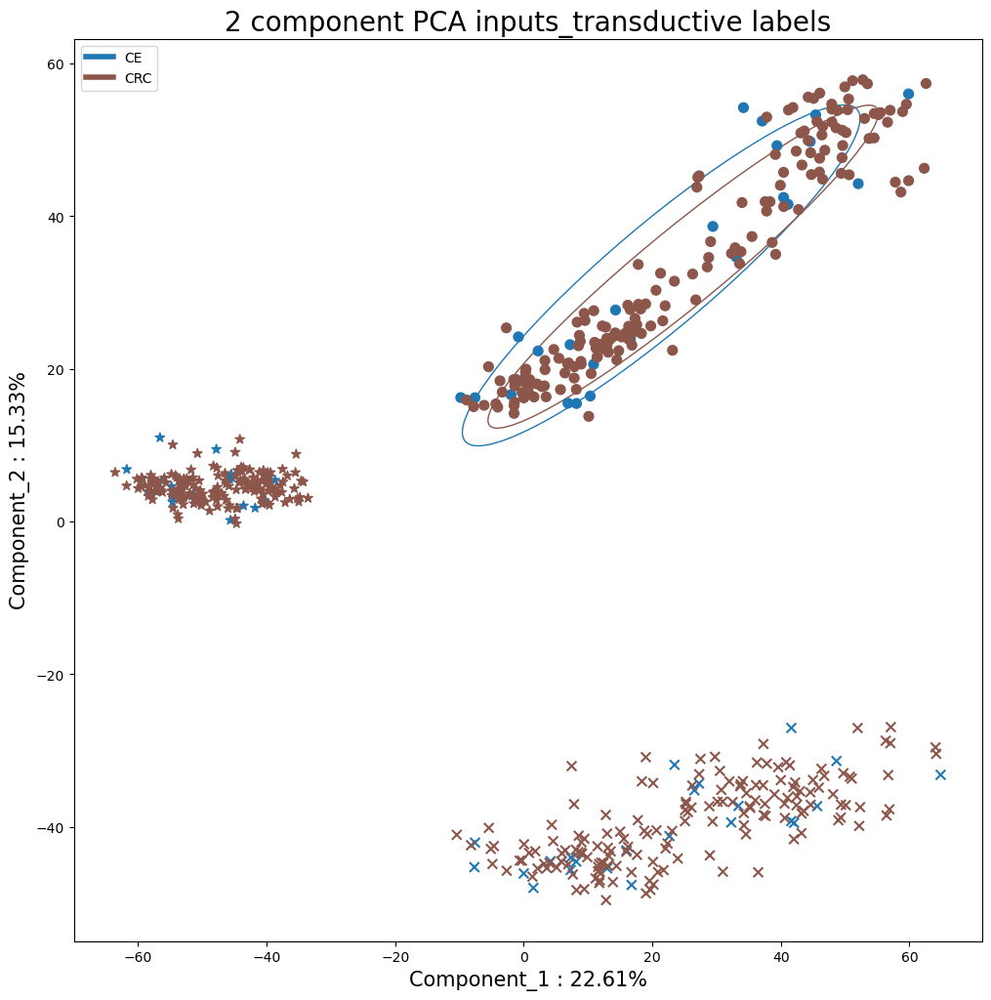

batches


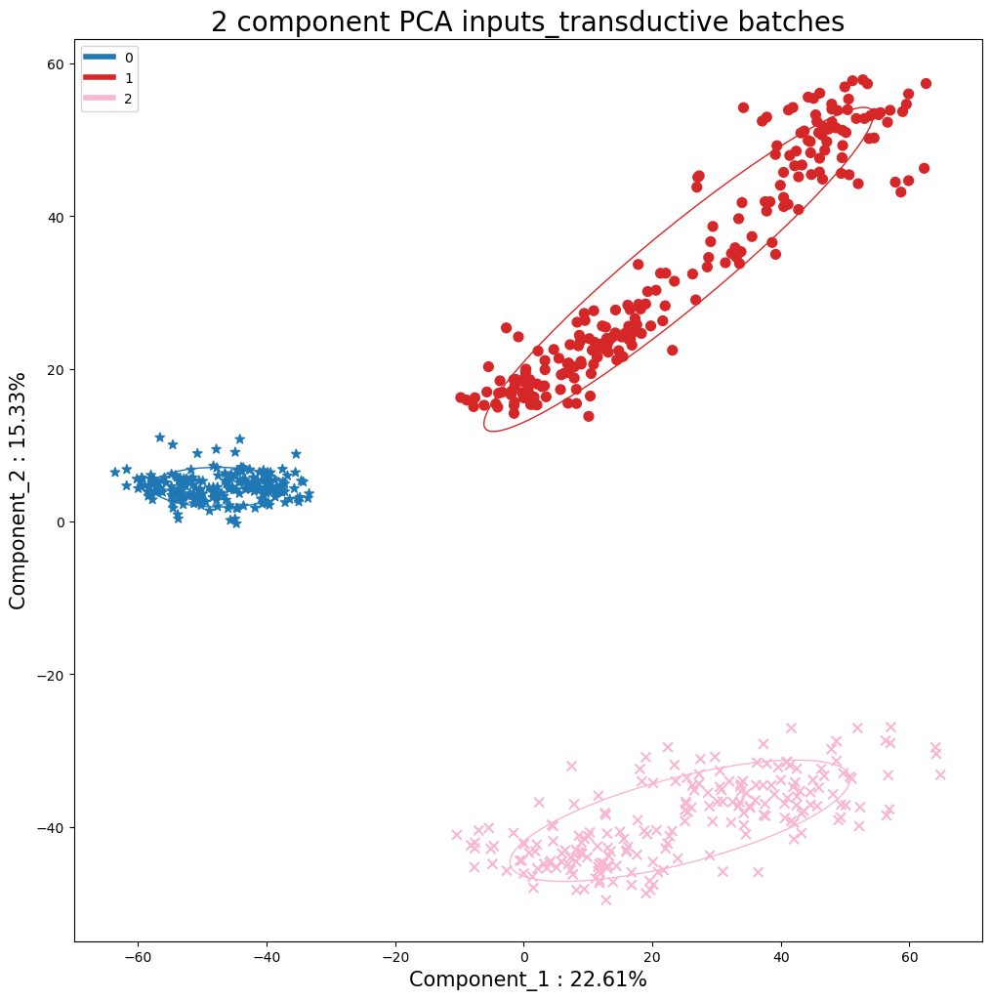

In [47]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA inputs'}, data, 
        {'labels': unique_labels, 'batches': unique_batches}, 0)


In [29]:
np.unique(data['batches']['all'])

array([0, 1, 2], dtype=int64)

In [30]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  8.06337e-08  237
---  -----------  ---
ttests
---  -----------  ---
0_1  3.38244e-07  239
---  -----------  ---


In [31]:
metrics = {}

In [32]:
def rLISI(data, meta_data, perplexity=10):
    import rpy2.robjects as robjects
    from rpy2.robjects import pandas2ri
    from rpy2.robjects.packages import importr
    from rpy2.robjects.conversion import localconverter
    lisi = importr('lisi')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.r.matrix(robjects.IntVector(meta_data), nrow=data.shape[0])
    newdata = robjects.r.matrix(robjects.FloatVector(data.values.reshape(-1)), nrow=data.shape[0])

    new_meta_data.colnames = labels
    results = lisi.compute_lisi(newdata, new_meta_data, labels, perplexity)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = np.array(robjects.conversion.rpy2py(results))
    mean = np.mean(results)
    return mean  # , np.std(results), results


In [33]:
def rKBET(inputs, cats):
    kbet = importr('kBET')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.IntVector(cats)
    newdata = robjects.r.matrix(robjects.FloatVector(inputs.values.reshape(-1)), nrow=inputs.shape[0])

    new_meta_data.colnames = labels
    results = kbet.kBET(newdata, new_meta_data, do_pca=False, plot=False)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = robjects.conversion.rpy2py(results[0])
    try:
        mean = results['kBET.signif'][0]
    except:
        mean = 0

    return mean

In [34]:
# data['inputs']['train']

In [35]:
# from src.dl.models.pytorch.utils.metrics import rLISI
if log_stuff:
    # metrics, _ = pyGPCA(data, 'all_pool', 'pool_raw', metrics)
    # metrics, _ = pyGPCA(data, 'all', 'raw', metrics)
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'raw')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'raw', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'raw')


batches


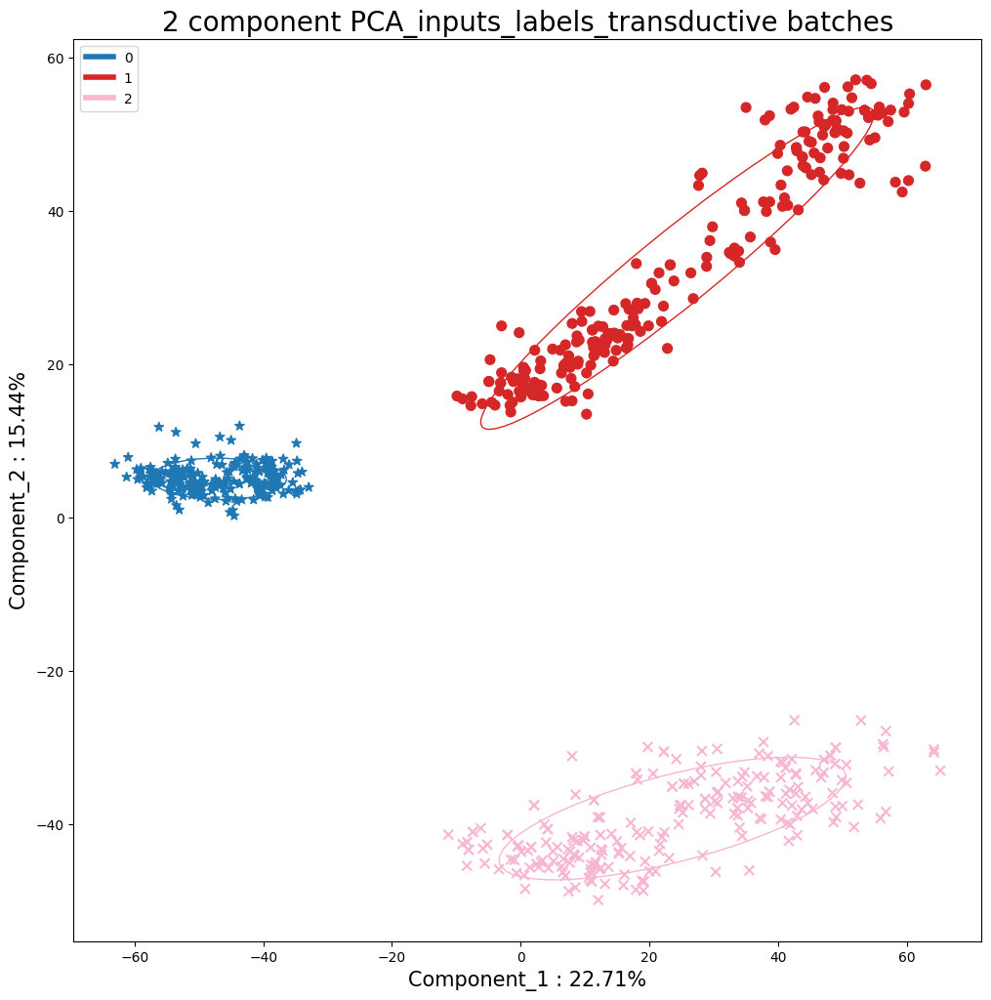

labels


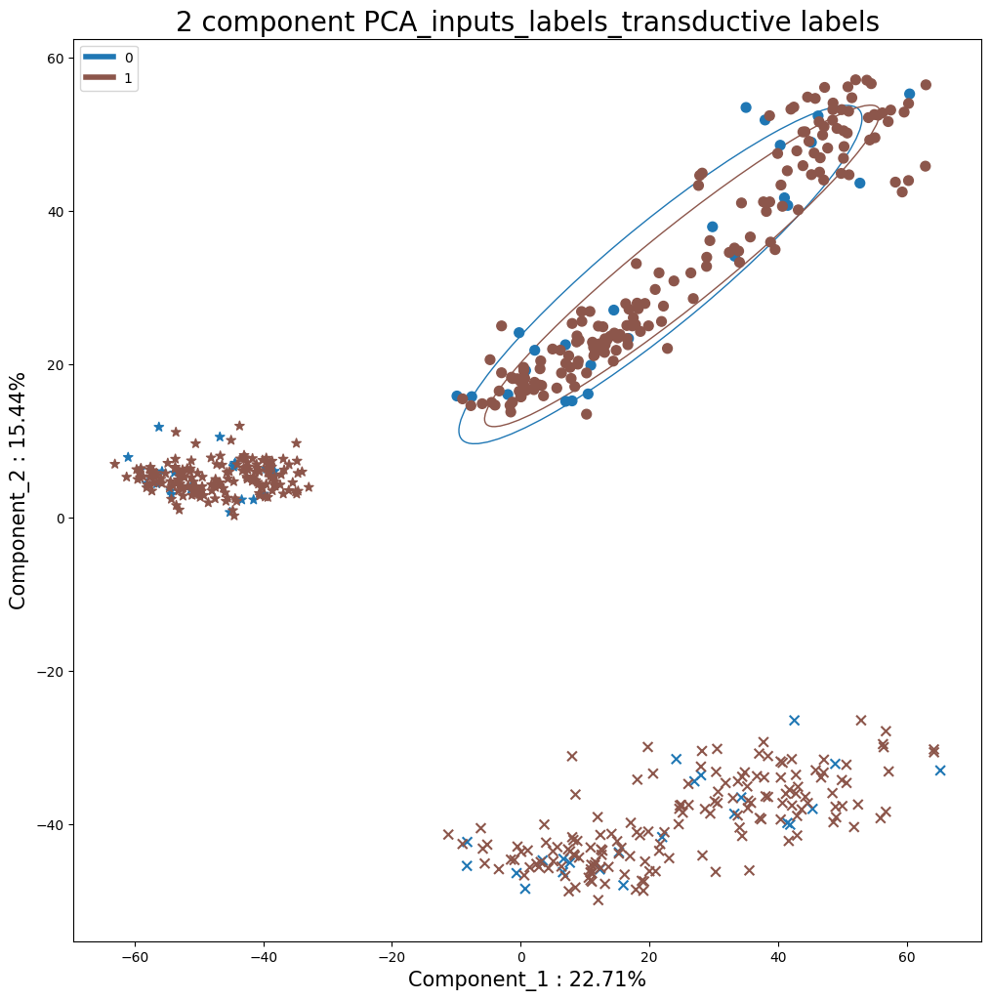

In [36]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


batches


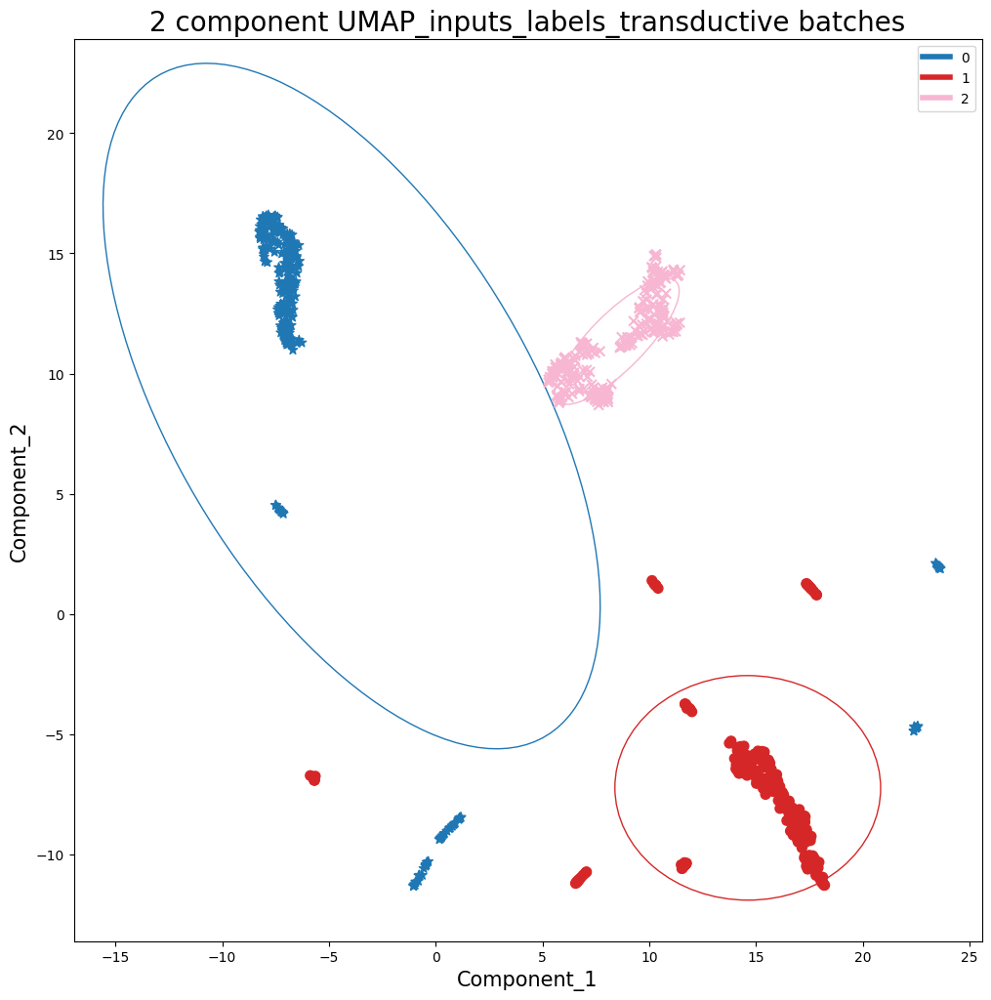

labels


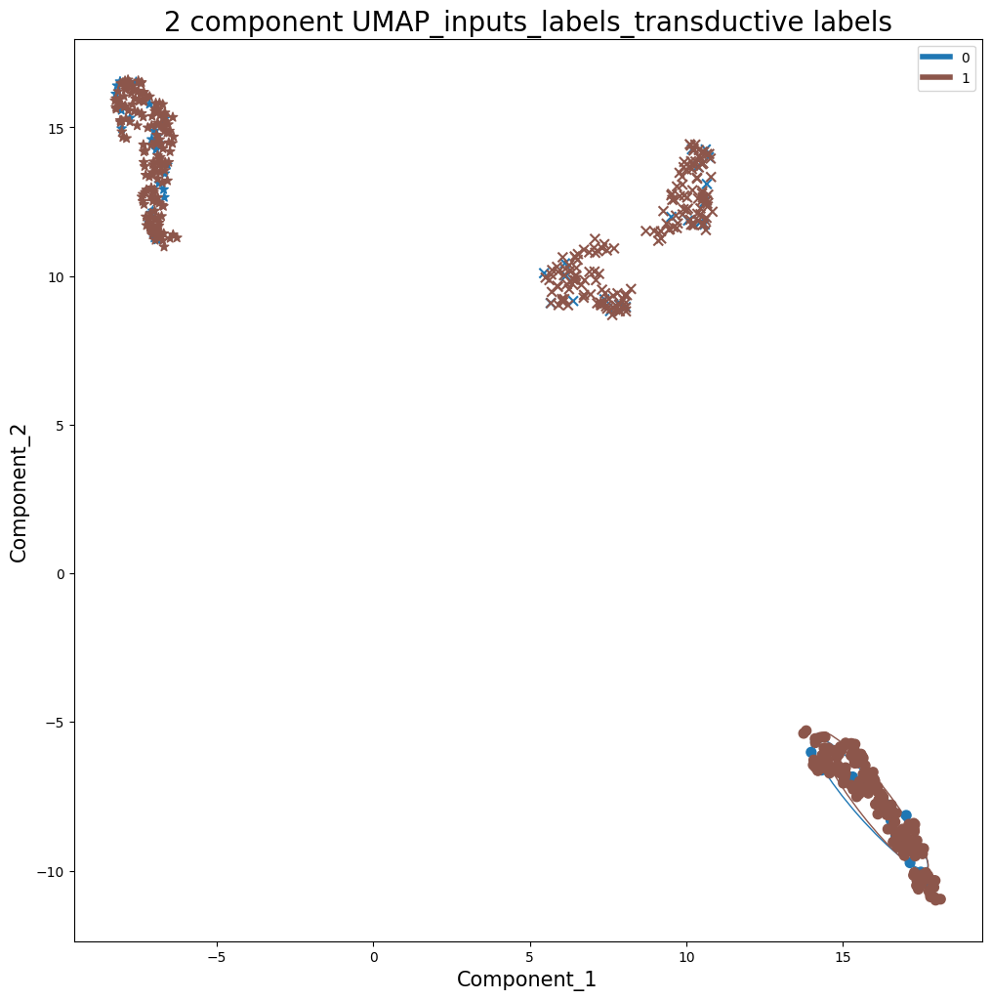

In [37]:
%matplotlib inline
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [38]:
if train_models:
    train_linsvc(data, 'raw', n_meta)
    train_rfc(data, 'raw', n_meta)
   # train_logreg(data, 'raw', n_meta)

In [39]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['qc_aPCC', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols + cols_pool, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score,pool lisi,pool silhouette,pool kbet,pool shannon,pool adjusted_rand_score,pool adjusted_mutual_info_score
raw,0.815415,0.838954,1.825332,0.232852,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN


# Minmax

In [40]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('minmax', data, device='cpu')

Imputing zeros.


In [41]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'minmax')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'minmax', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'minmax')

In [42]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  8.06337e-08  237
---  -----------  ---
ttests
---  -----------  ---
0_1  3.38244e-07  239
---  -----------  ---


batches


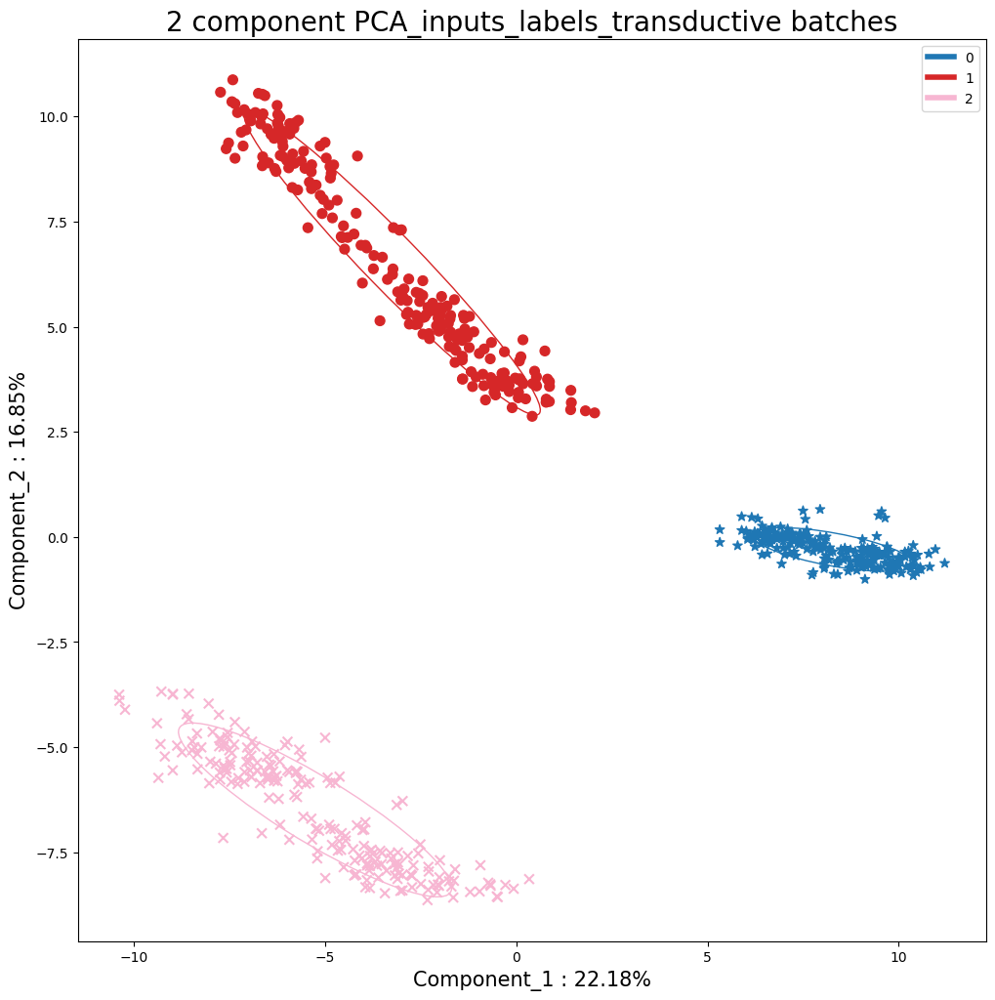

labels


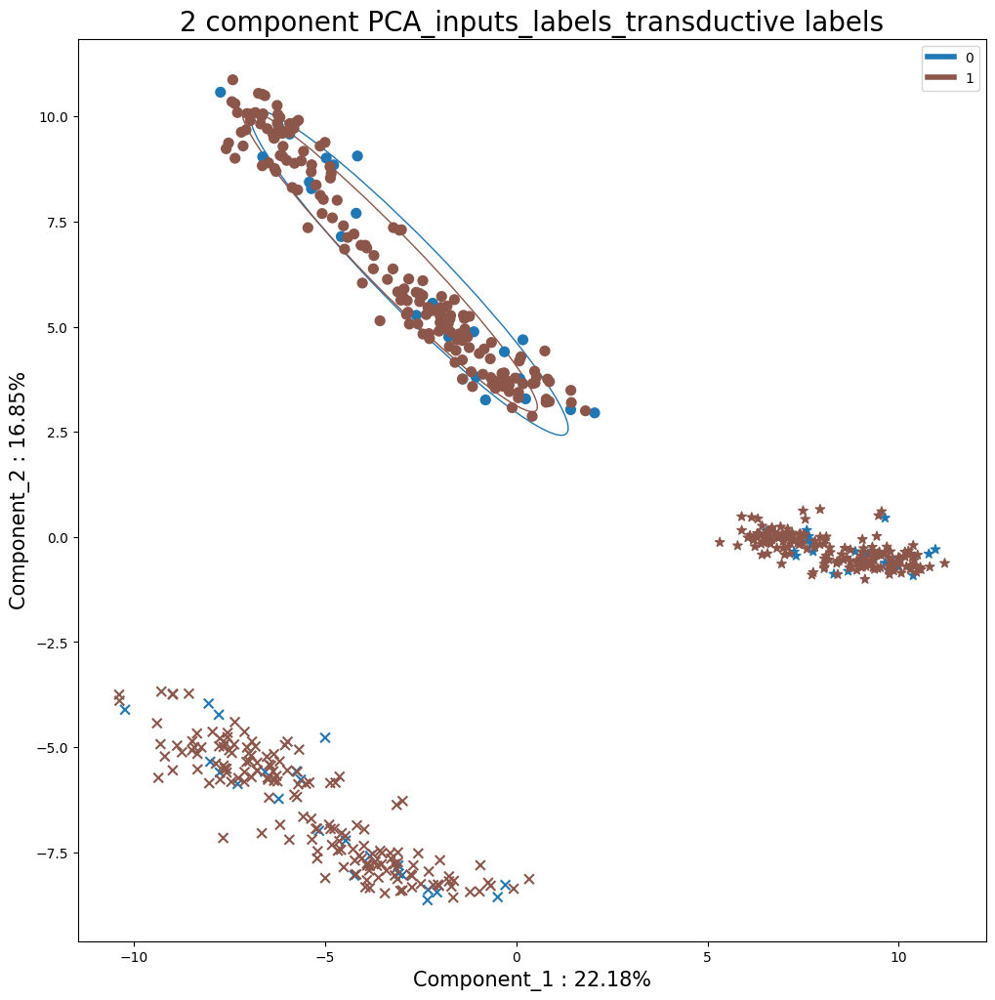

In [43]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [44]:
if train_models:
    train_rfc(data, 'minmax', n_meta)
    train_linsvc(data, 'minmax', n_meta)
    # train_logreg(data, 'minmax', n_meta)

# Minmax per batch

In [45]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('minmax_per_batch', data, device='cpu')

Imputing zeros.


In [46]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'minmax_per_batch')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'minmax_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'minmax')

In [47]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  3.78302e-06  293
---  -----------  ---
ttests
---  -----------  ---
0_1  6.36696e-05  226
---  -----------  ---


batches


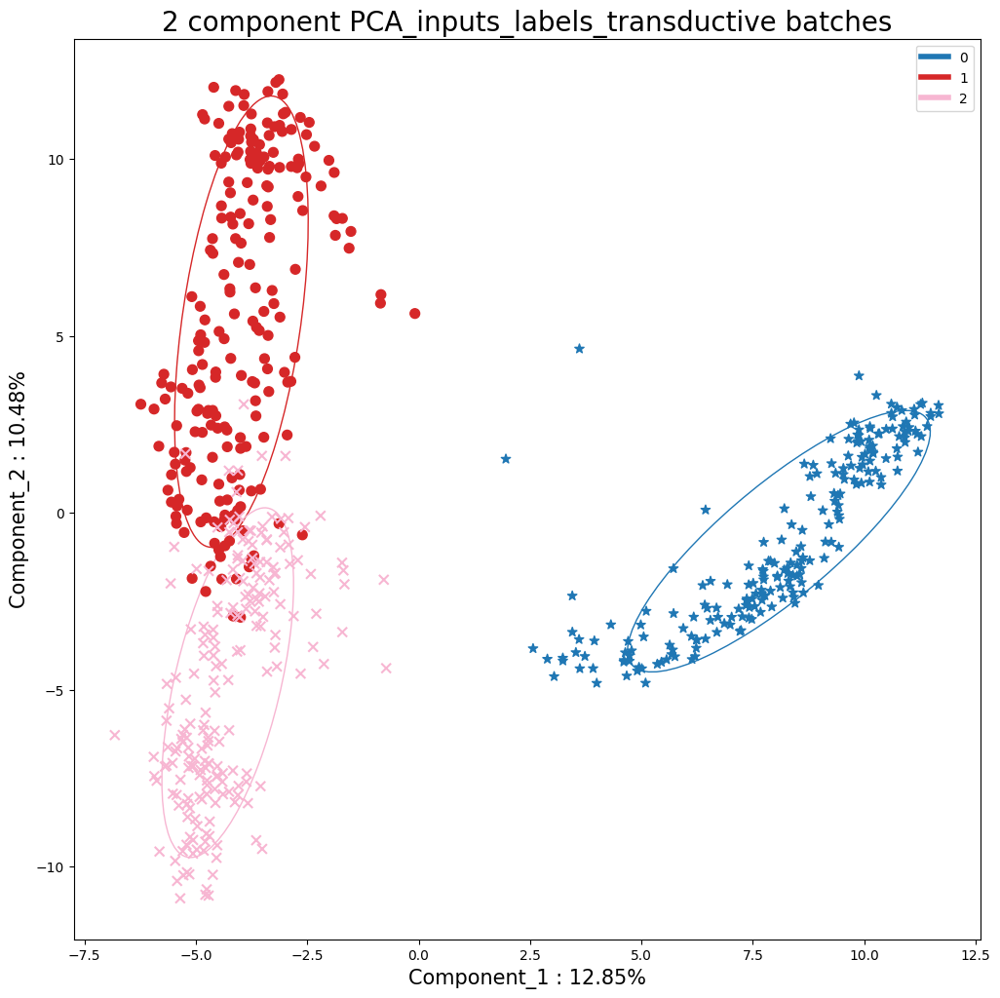

labels


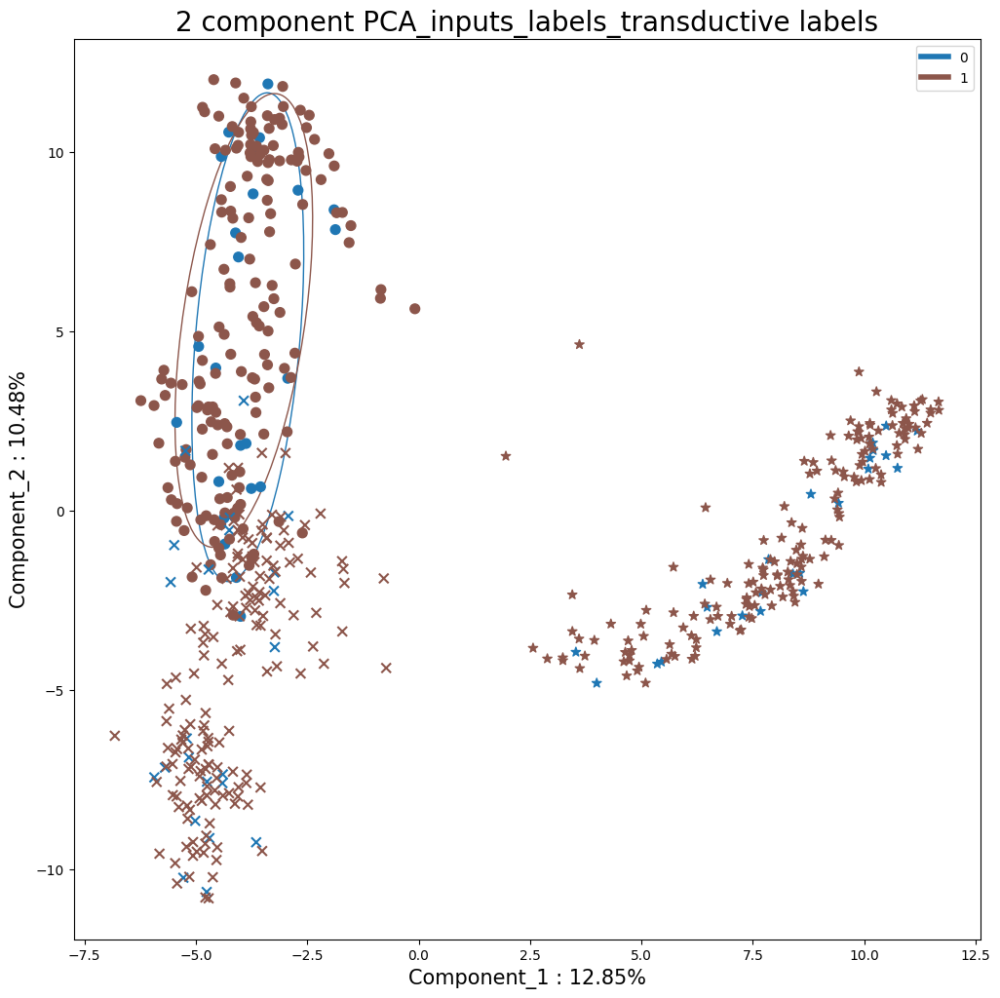

In [48]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [49]:
if train_models:
    train_rfc(data, 'minmax_per_batch', n_meta)
    train_linsvc(data, 'minmax_per_batch', n_meta)
    # train_logreg(data, 'minmax', n_meta)

# Standard

In [50]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

Imputing zeros.


In [51]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'standard')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'standard', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'standard')

In [52]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  8.06337e-08  237
---  -----------  ---
ttests
---  -----------  ---
0_1  3.38244e-07  239
---  -----------  ---


batches


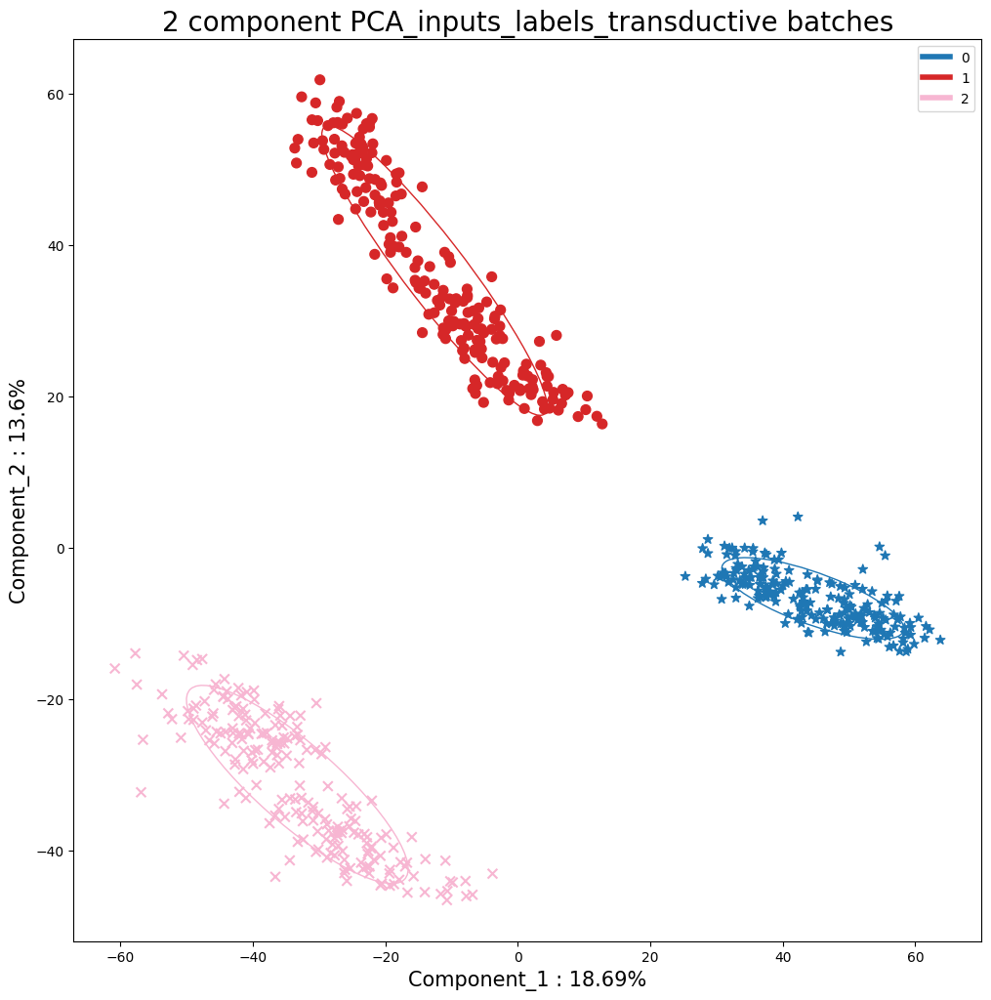

labels


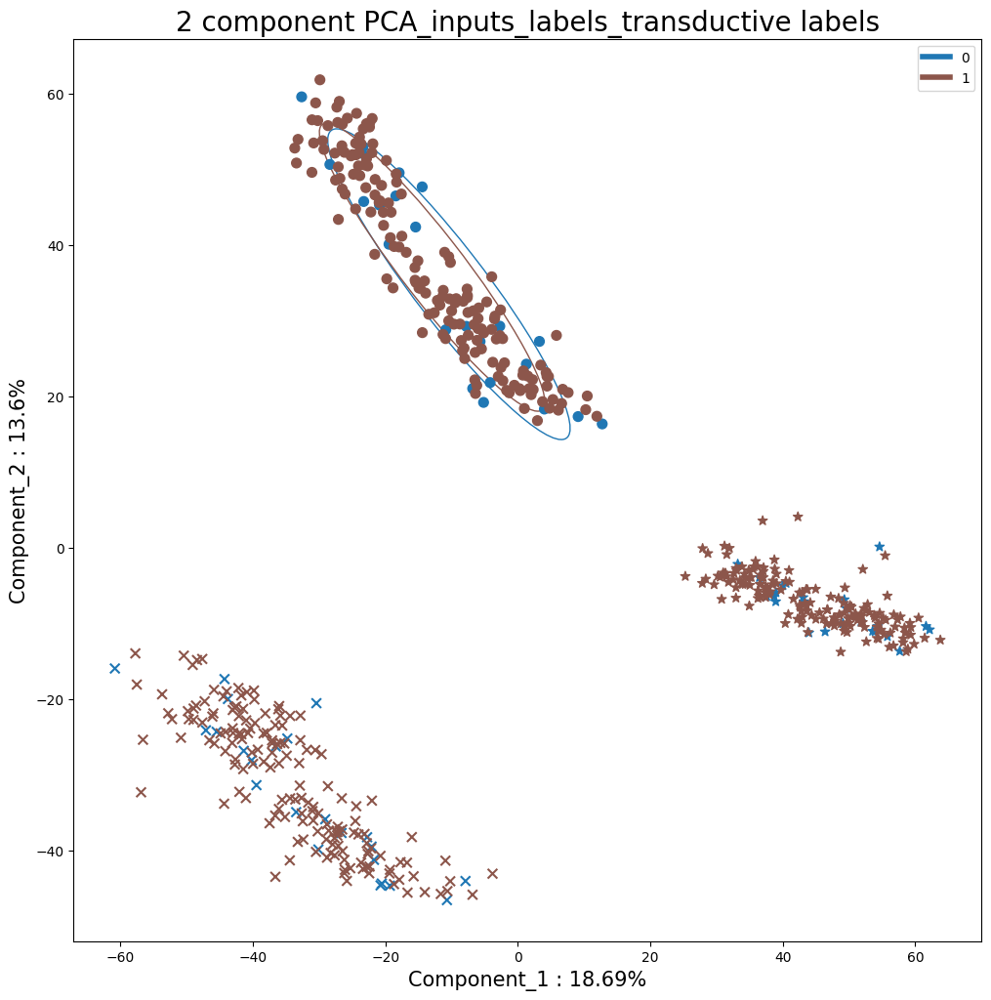

batches


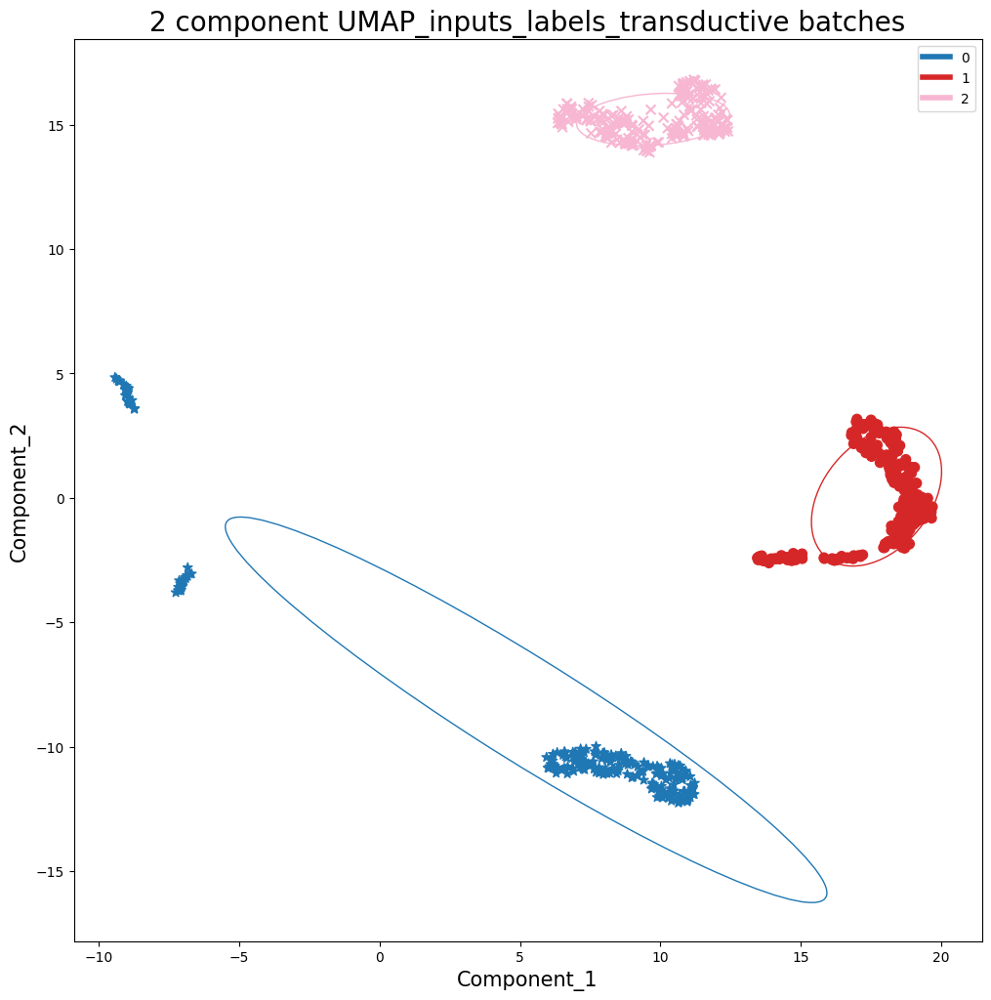

labels


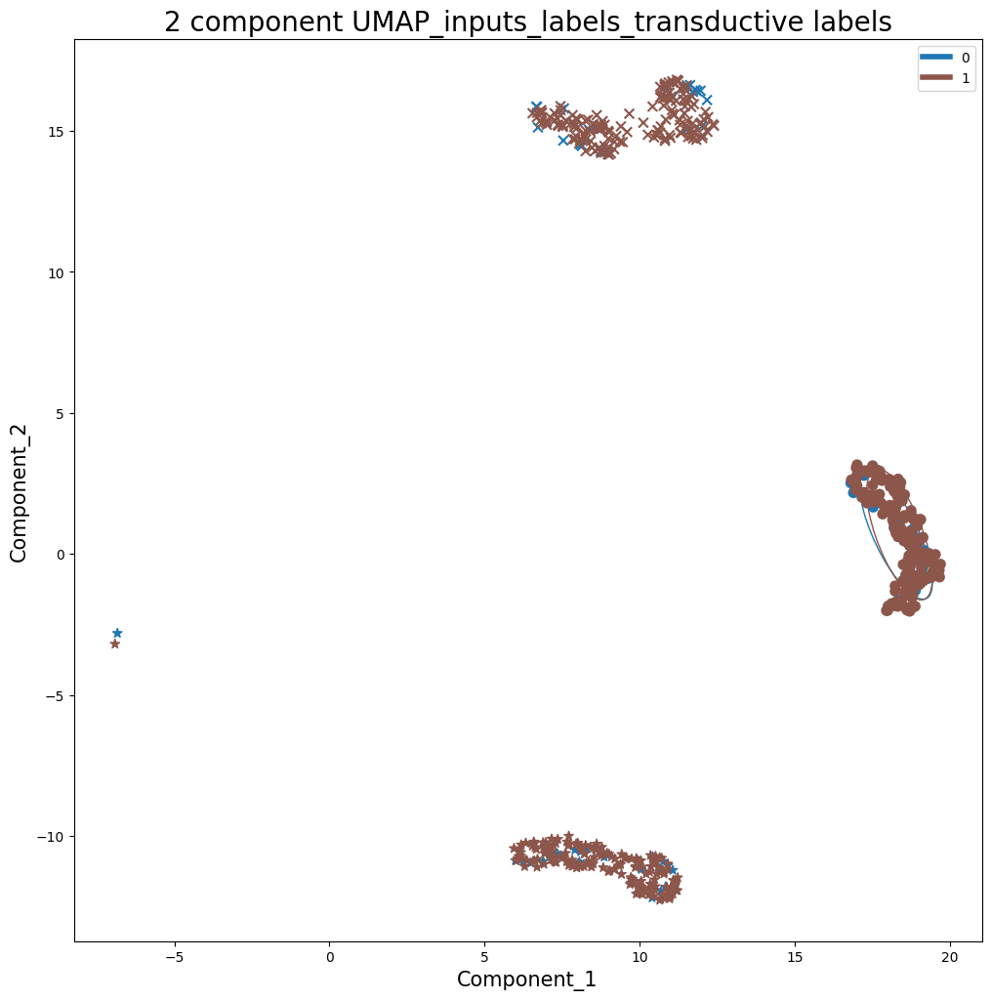

In [53]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)

log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [54]:
if train_models:
    train_rfc(data, 'standard', n_meta)
    train_linsvc(data, 'standard', n_meta)
    # train_logreg(data, 'standard', n_meta)

# Standard per batch

In [55]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard_per_batch', data, device='cpu')

Imputing zeros.


In [56]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'standard_per_batch')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'standard_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'standard')

In [57]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  7.01547e-08  409
---  -----------  ---
ttests
---  -----------  ---
0_1  1.24152e-07  370
---  -----------  ---


batches


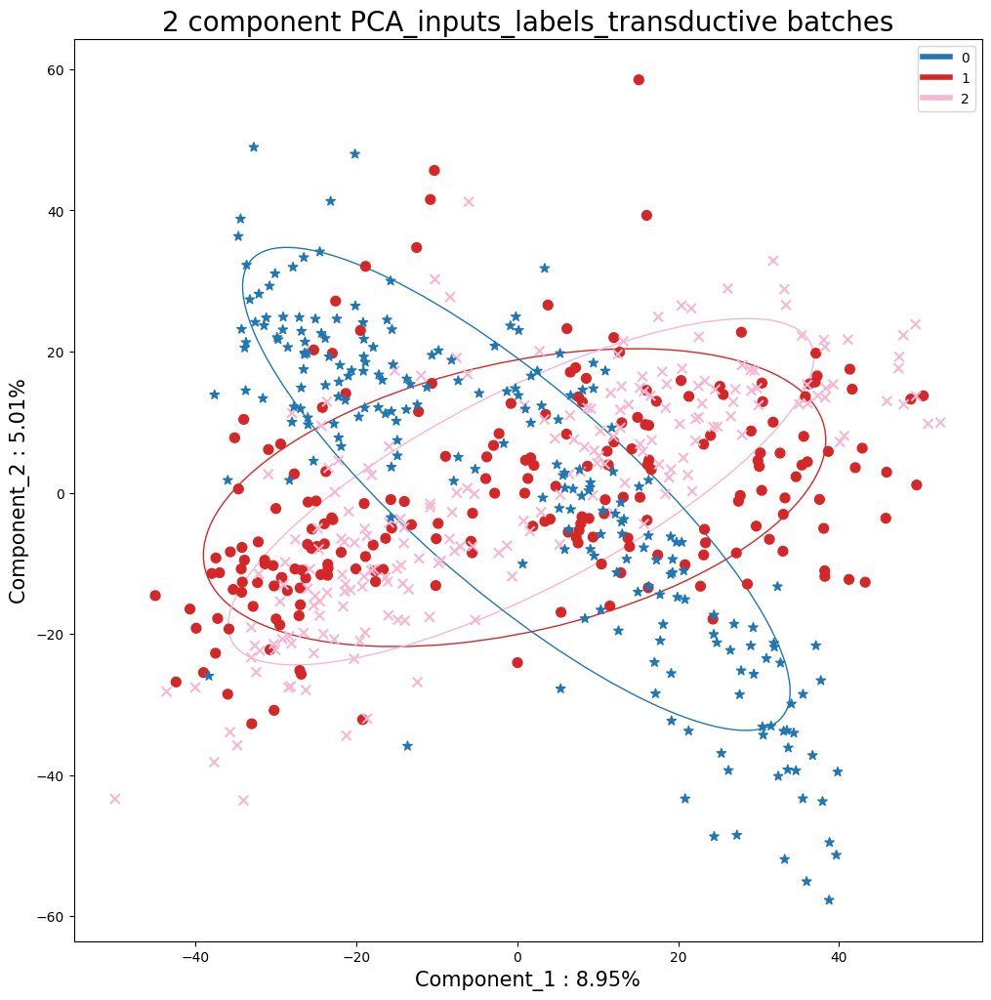

labels


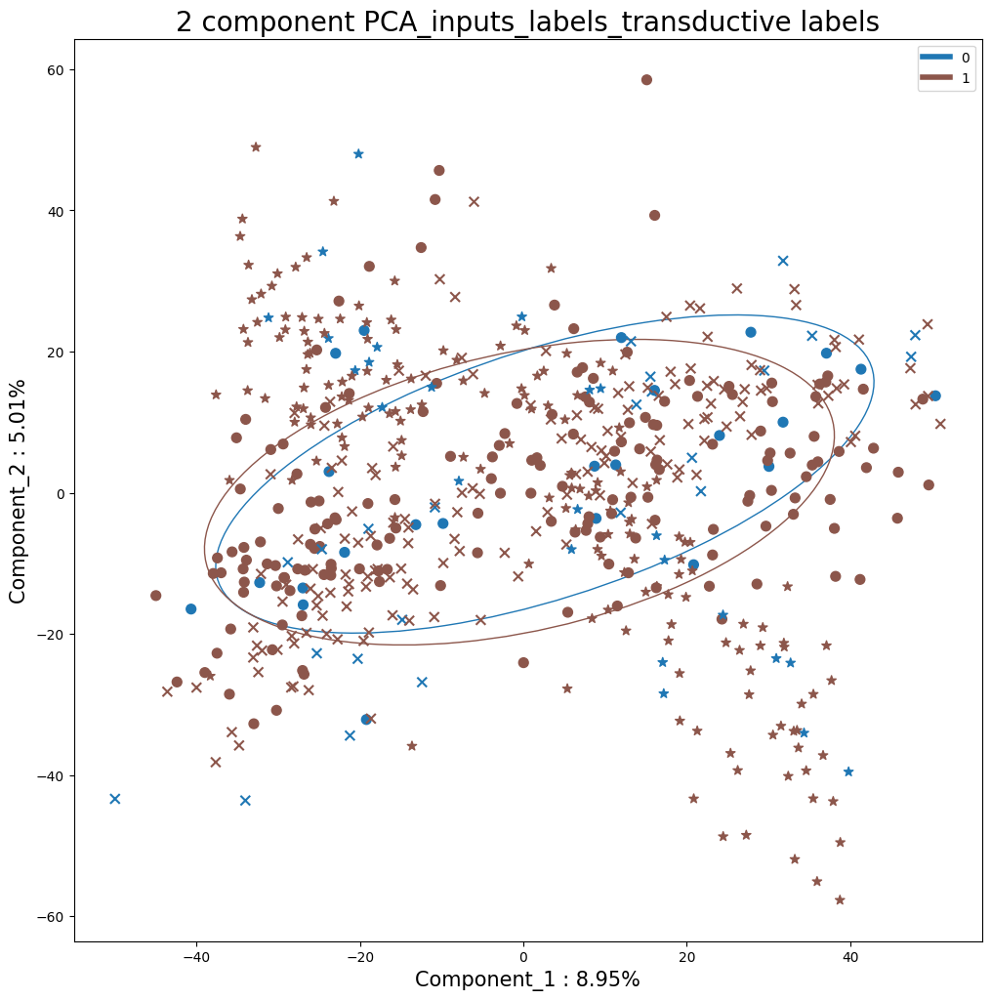

batches


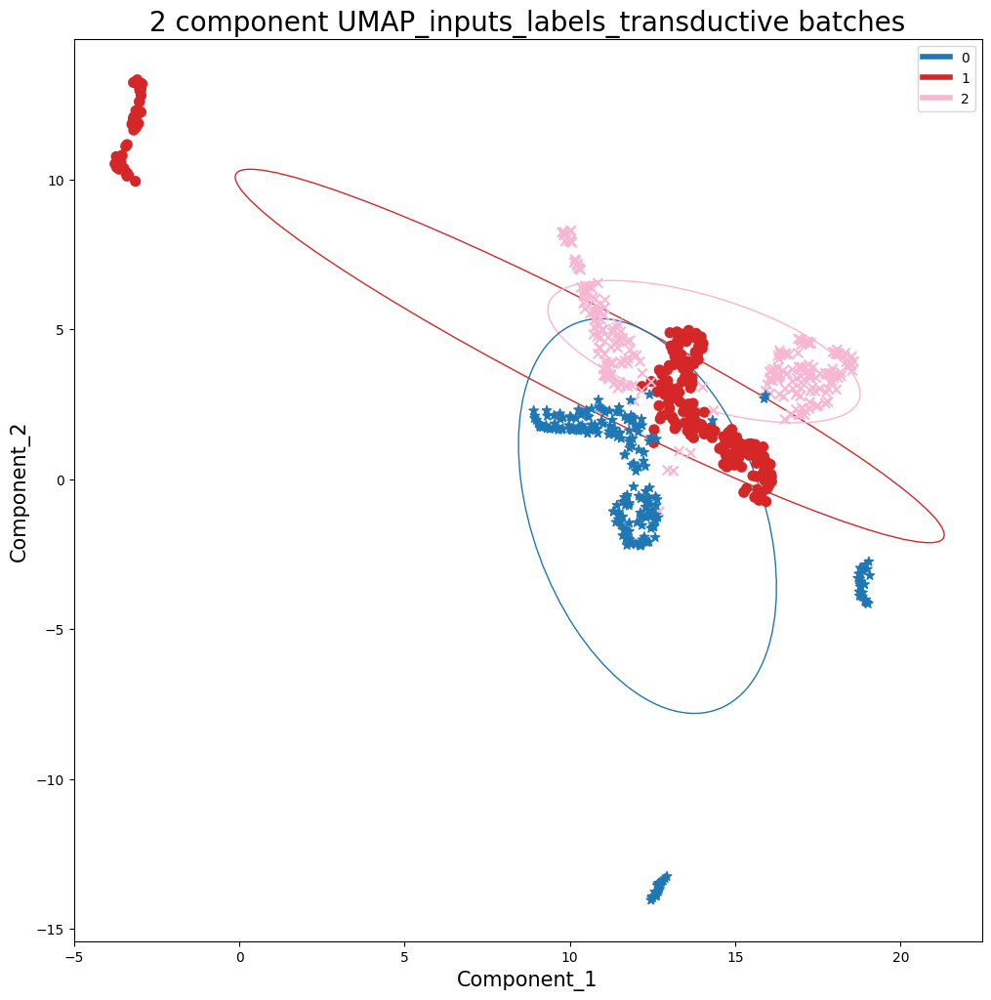

labels


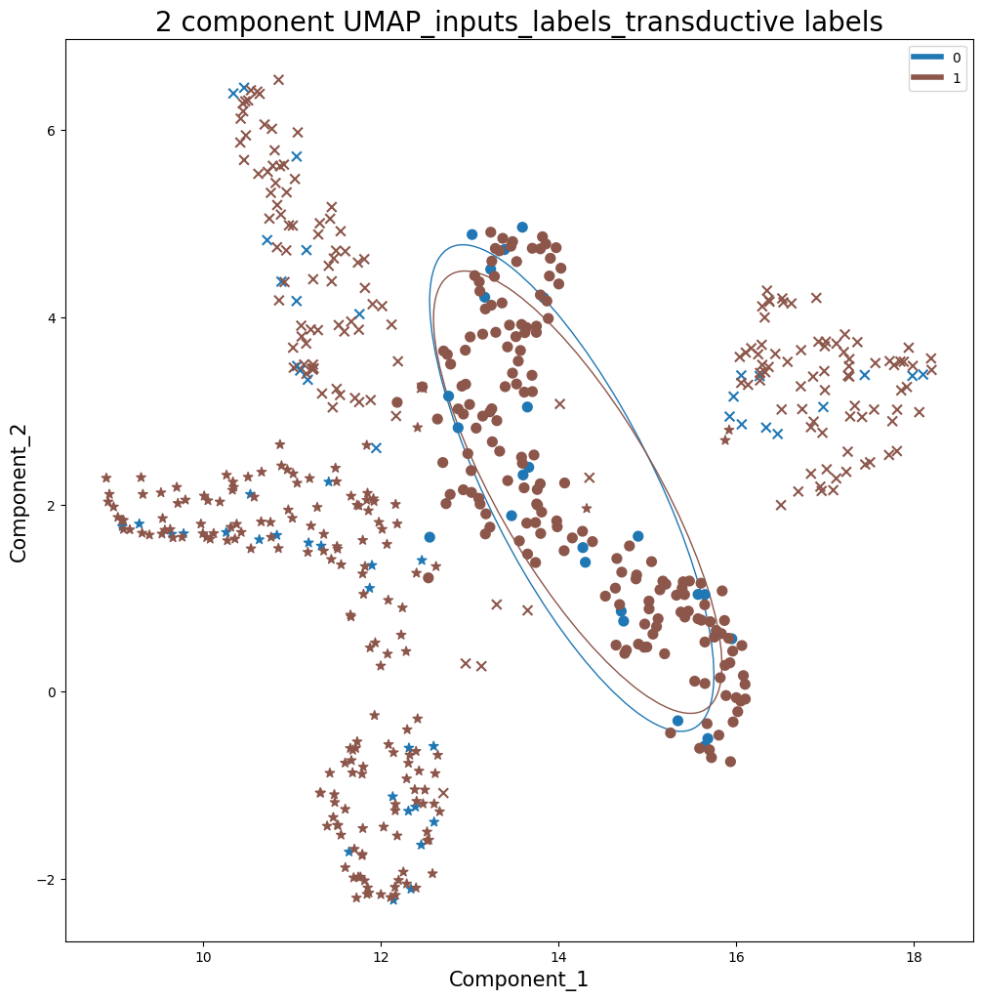

In [58]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)

log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [59]:
if train_models:
    train_linsvc(data, 'standard_per_batch', n_meta)
    train_rfc(data, 'standard_per_batch', n_meta)
    # train_logreg(data, 'standard', n_meta)

# Robust

In [60]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('robust', data, device='cpu')

Imputing zeros.


sel = VarianceThreshold(threshold=0.16)
sel.fit(data['inputs']['all'])
features = np.array([int(x.split('x')[1]) for x in sel.get_feature_names_out()])
data['inputs']['all'] = data['inputs']['all'].iloc[:, features]
data['inputs']['all_pool'] = data['inputs']['all_pool'].iloc[:, features]
data['inputs']['train'] = data['inputs']['train'].iloc[:, features]
data['inputs']['train_pool'] = data['inputs']['train_pool'].iloc[:, features]
data['inputs']['valid'] = data['inputs']['valid'].iloc[:, features]
data['inputs']['valid_pool'] = data['inputs']['valid_pool'].iloc[:, features]
data['inputs']['test'] = data['inputs']['test'].iloc[:, features]
data['inputs']['test_pool'] = data['inputs']['test_pool'].iloc[:, features]

In [61]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'robust')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'robust', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'robust')

In [62]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  8.06337e-08  237
---  -----------  ---
ttests
---  -----------  ---
0_1  3.38244e-07  239
---  -----------  ---


batches


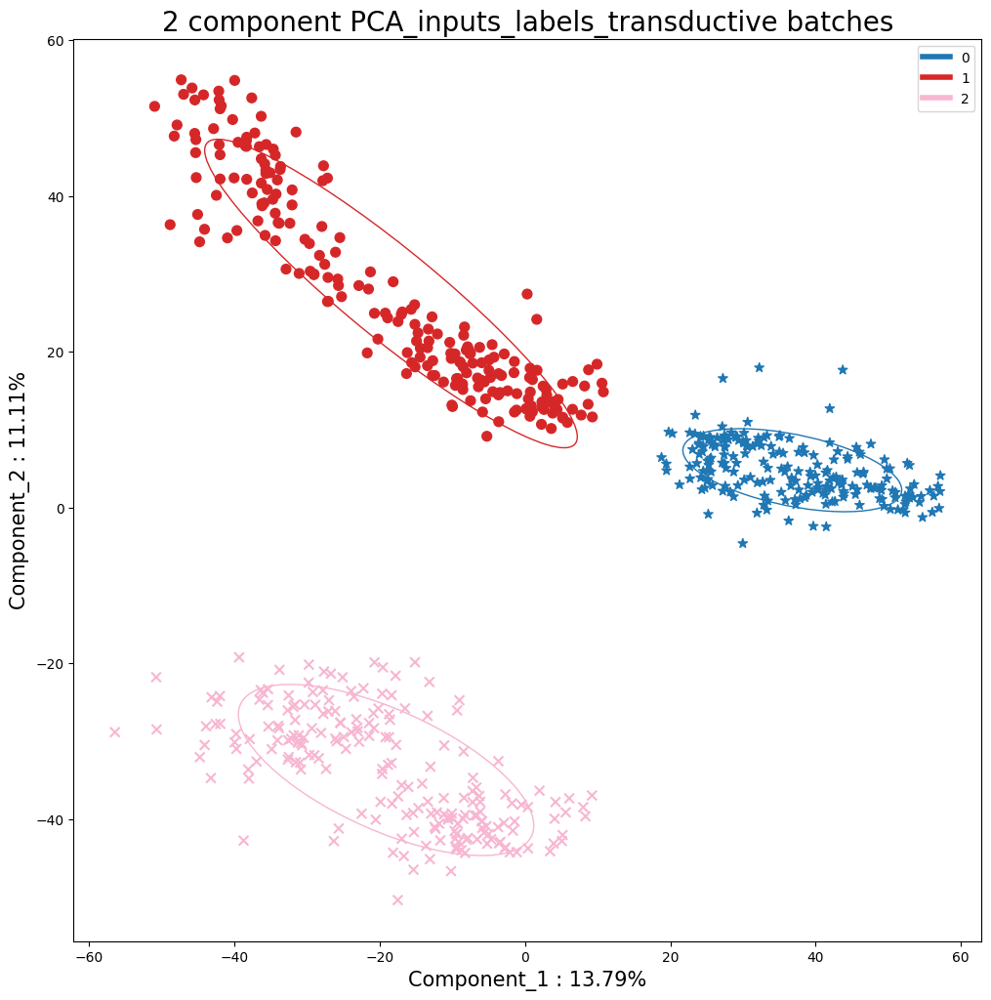

labels


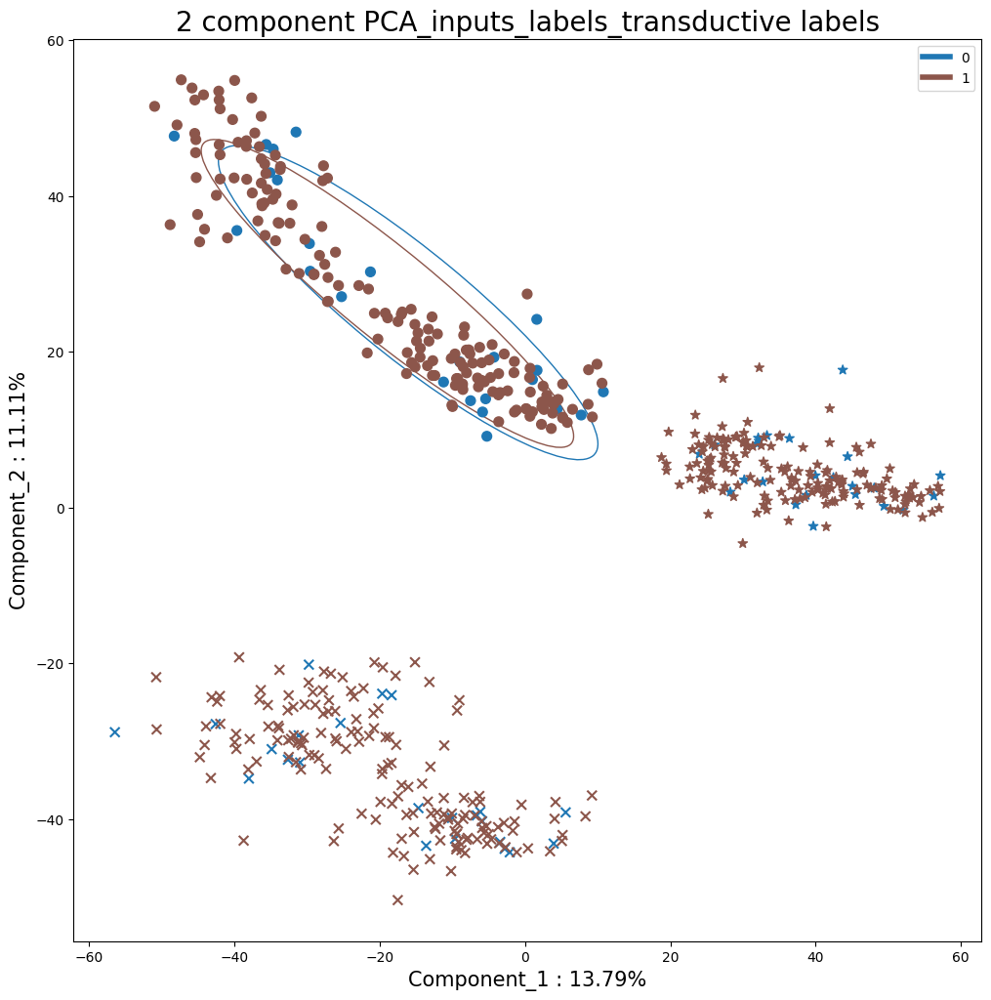

In [63]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [64]:
if train_models:
    train_rfc(data, 'robust', n_meta)
    train_linsvc(data, 'robust', n_meta)
    # train_logreg(data, 'robust', n_meta)

# Robust per batch

In [65]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('robust_per_batch', data, device='cpu')

Imputing zeros.


sel = VarianceThreshold(threshold=0.16)
sel.fit(data['inputs']['all'])
features = np.array([int(x.split('x')[1]) for x in sel.get_feature_names_out()])
data['inputs']['all'] = data['inputs']['all'].iloc[:, features]
data['inputs']['all_pool'] = data['inputs']['all_pool'].iloc[:, features]
data['inputs']['train'] = data['inputs']['train'].iloc[:, features]
data['inputs']['train_pool'] = data['inputs']['train_pool'].iloc[:, features]
data['inputs']['valid'] = data['inputs']['valid'].iloc[:, features]
data['inputs']['valid_pool'] = data['inputs']['valid_pool'].iloc[:, features]
data['inputs']['test'] = data['inputs']['test'].iloc[:, features]
data['inputs']['test_pool'] = data['inputs']['test_pool'].iloc[:, features]

In [66]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'robust_per_batch')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'robust_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'robust')

In [67]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  1.31602e-07  418
---  -----------  ---
ttests
---  -----------  ---
0_1  1.44731e-07  392
---  -----------  ---


batches


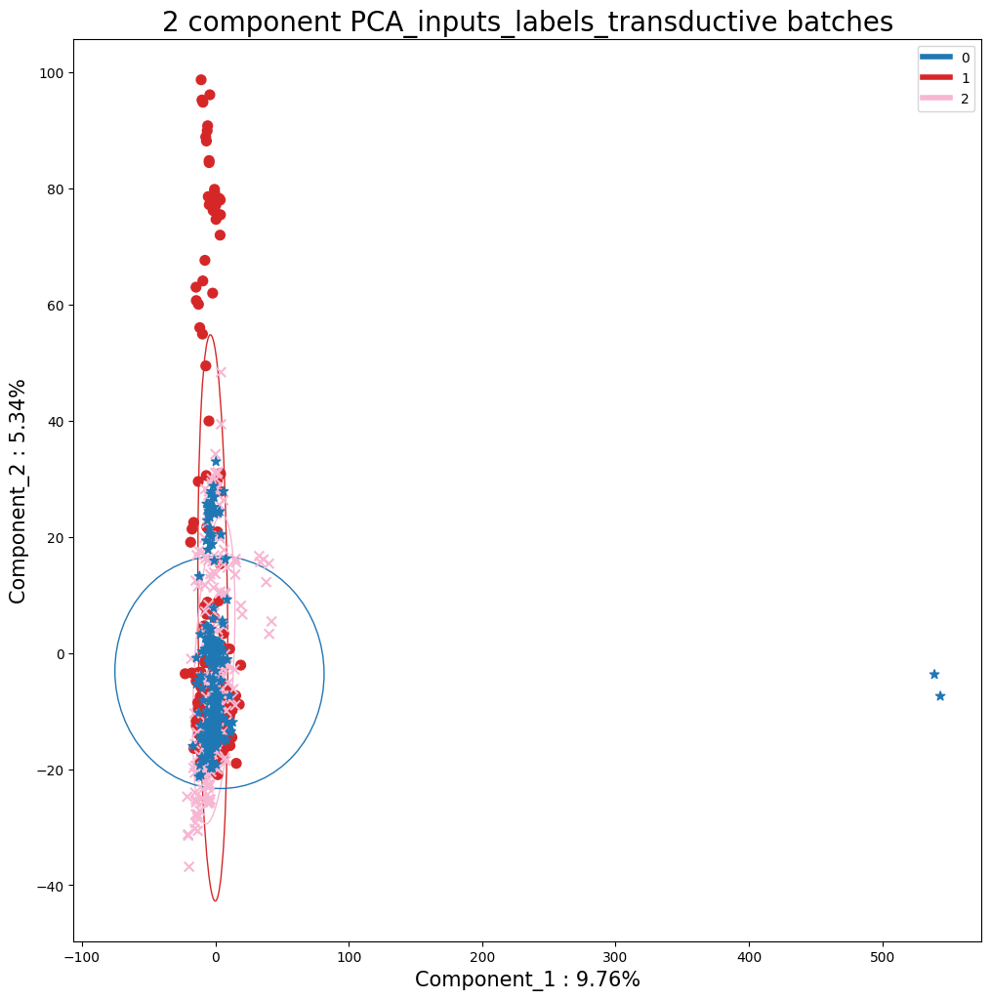

labels


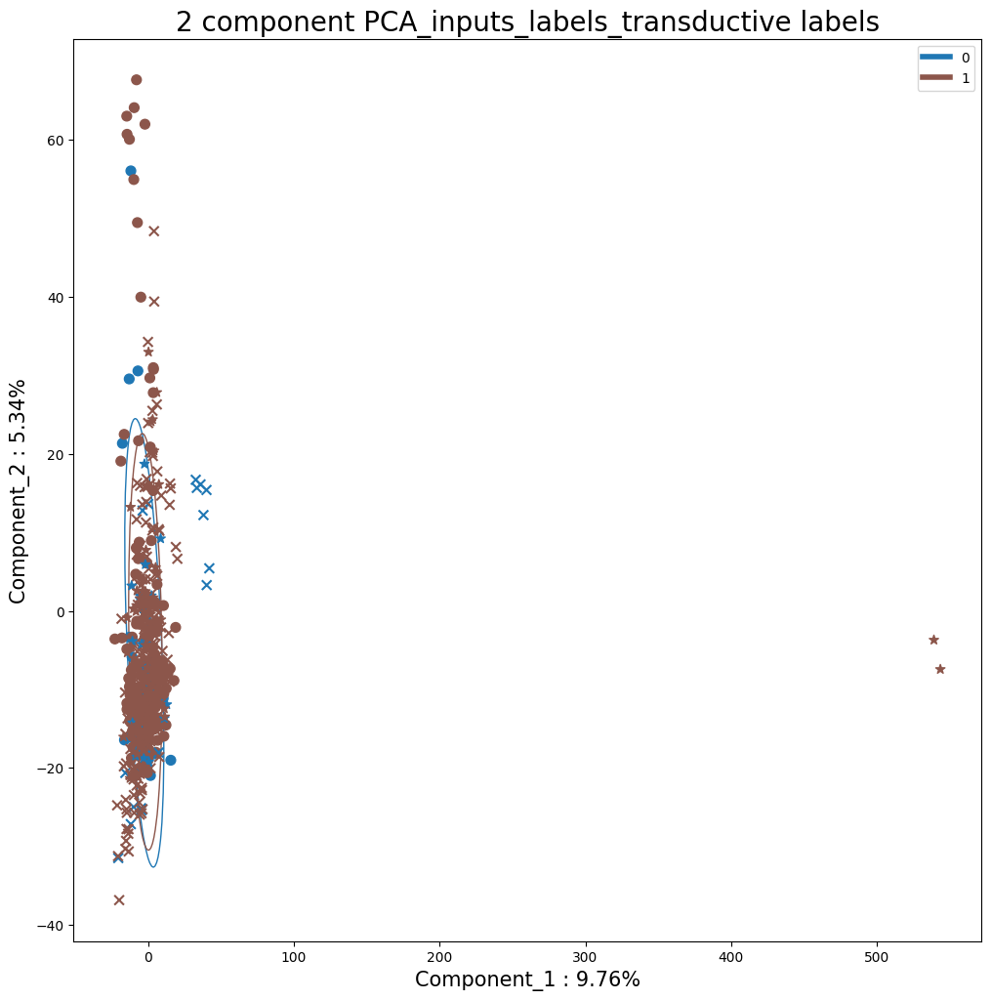

In [68]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [69]:
if train_models:
    train_rfc(data, 'robust_per_batch', n_meta)
    train_linsvc(data, 'robust_per_batch', n_meta)
    # train_logreg(data, 'robust', n_meta)

# Combat

In [70]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('raw', data, device='cpu')
data = remove_batch_effect(get_berm('combat'), data)


Imputing zeros.
not with classes!


R[write to console]: Found3batches

R[write to console]: Adjusting for0covariate(s) or covariate level(s)

R[write to console]: Standardizing Data across genes

R[write to console]: Fitting L/S model and finding priors

R[write to console]: Finding parametric adjustments

R[write to console]: Adjusting the Data




train 0
valid 192
test 376
train_pool 568
valid_pool 593
test_pool 618


In [71]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))
0

Mann      pval min    n pvals < 0.05
---  --------  -
0_1  0.458627  0
---  --------  -
ttests
---  --------  -
0_1  0.291206  0
---  --------  -


0

In [72]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'combat')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'combat', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'combat')

batches


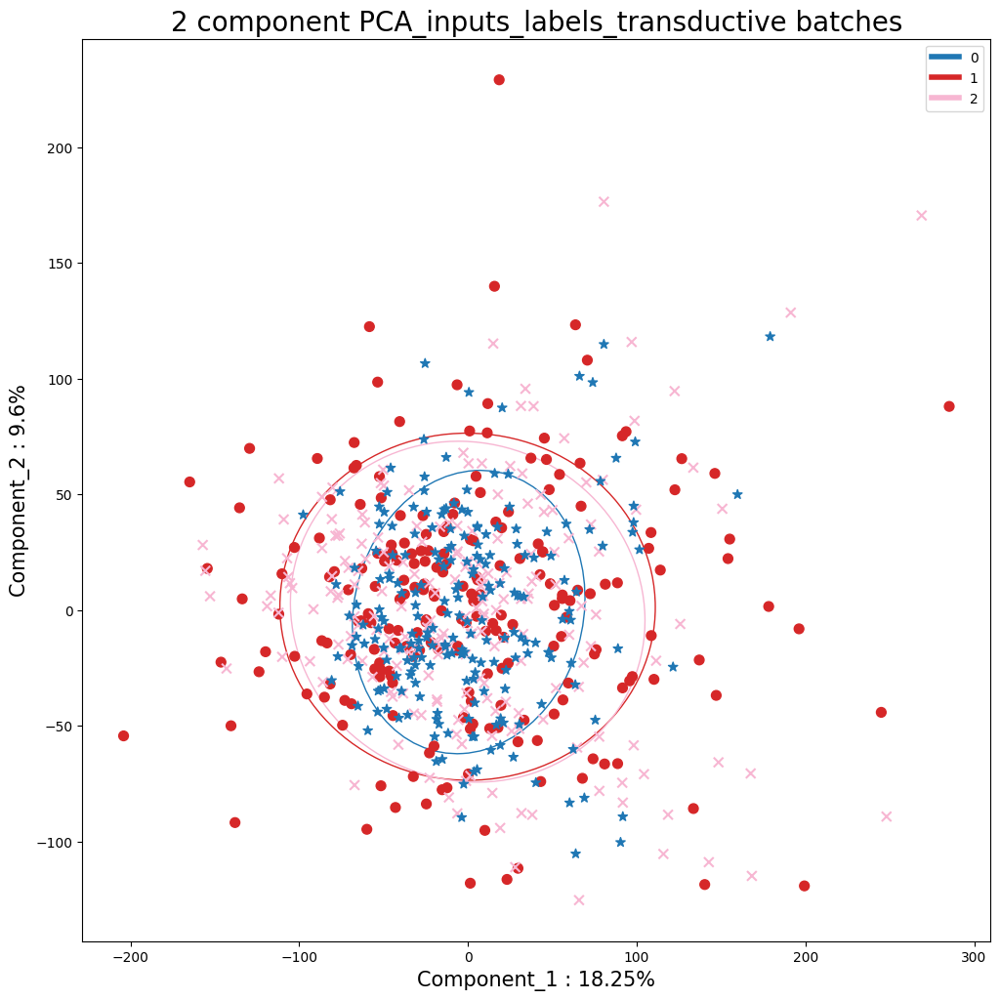

labels


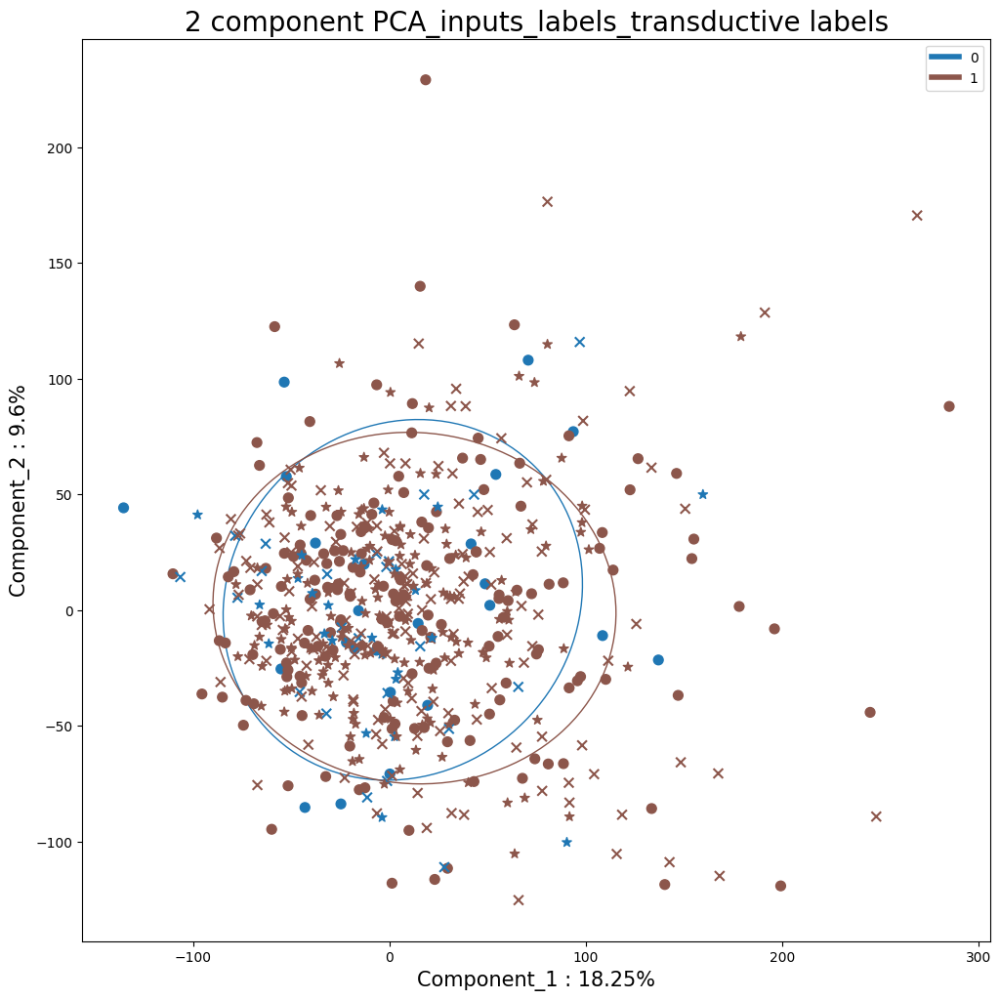

batches


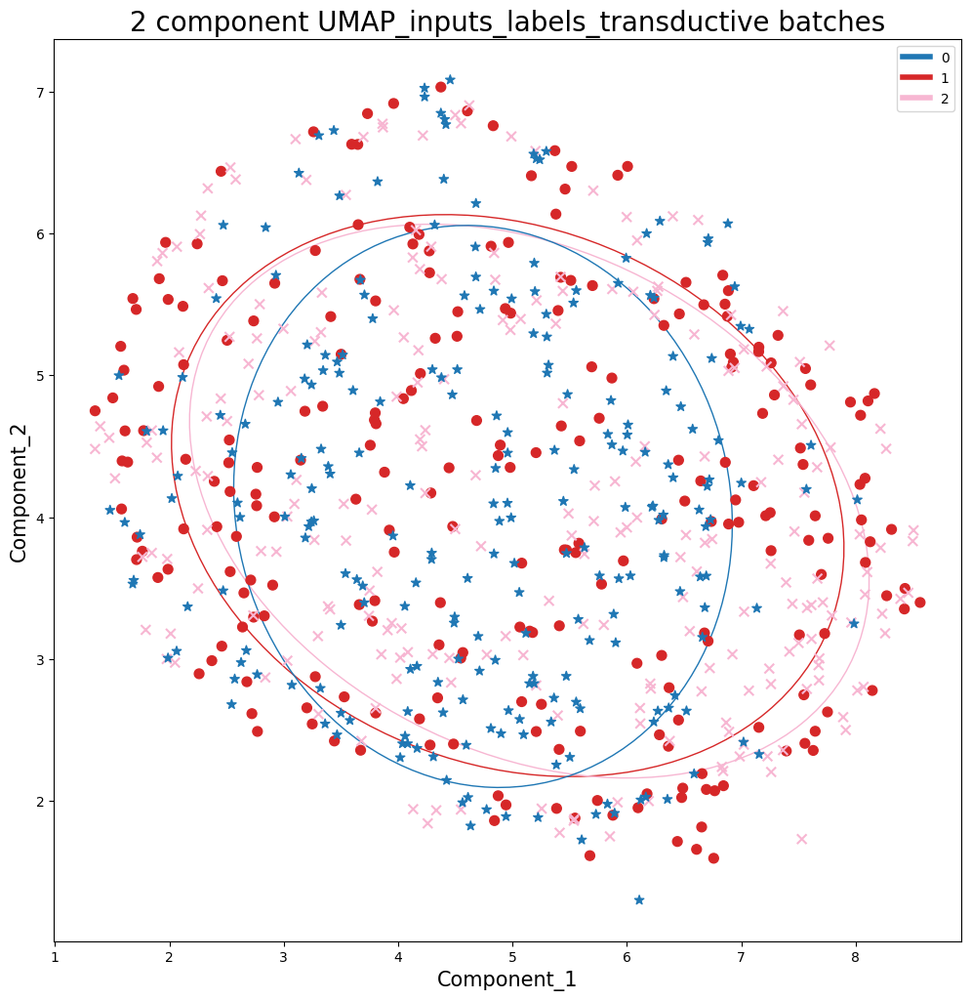

labels


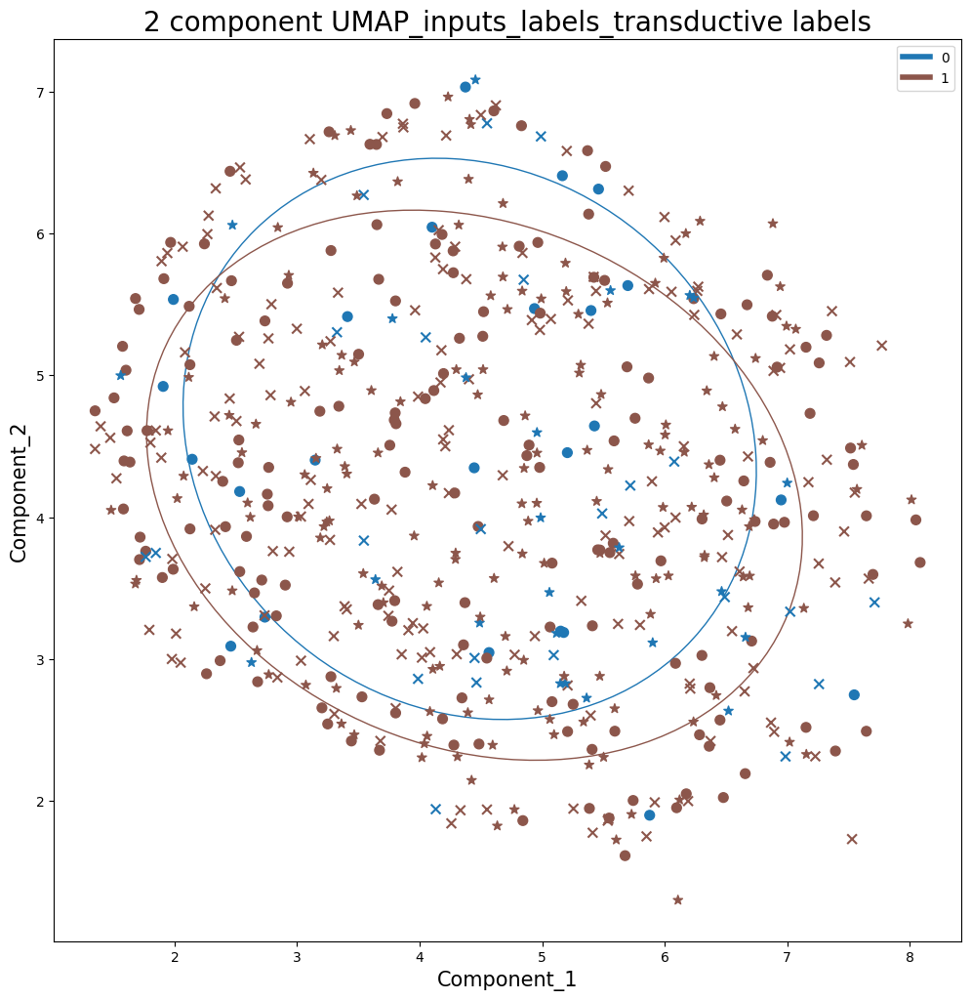

In [73]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [74]:
if train_models:
    train_rfc(data, 'combat', n_meta)
    train_linsvc(data, 'combat', n_meta)
    # train_logreg(data, 'combat', n_meta)

# pyCombat

In [76]:
!pip install combat

  Using cached combat-0.3.3.tar.gz (34 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 536.2/536.2 kB 8.3 MB/s eta 0:00:00
  Created wheel for combat: filename=combat-0.3.3-py3-none-any.whl size=36796 sha256=c20b335c93726503a6ee8c3cfdec390413c87f8e651fb1ecdf433a85ed04b227
  Stored in directory: c:\users\simon\appdata\local\pip\cache\wheels\d8\4c\72\cd9c407803221e1ab20f4968934f758af50ad83b4419c39b8a
Successfully built combat


In [77]:
from combat.pycombat import pycombat
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('raw', data, device='cpu')
data = use_pycombat(pycombat, data)


Imputing zeros.
Found 3 batches.
Adjusting for 0 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data


In [78]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
---  -----------  ---
0_1  2.25021e-07  399
---  -----------  ---
ttests
---  -----------  ---
0_1  8.82866e-07  389
---  -----------  ---


In [79]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'pycombat')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'pycombat', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'pycombat')

batches


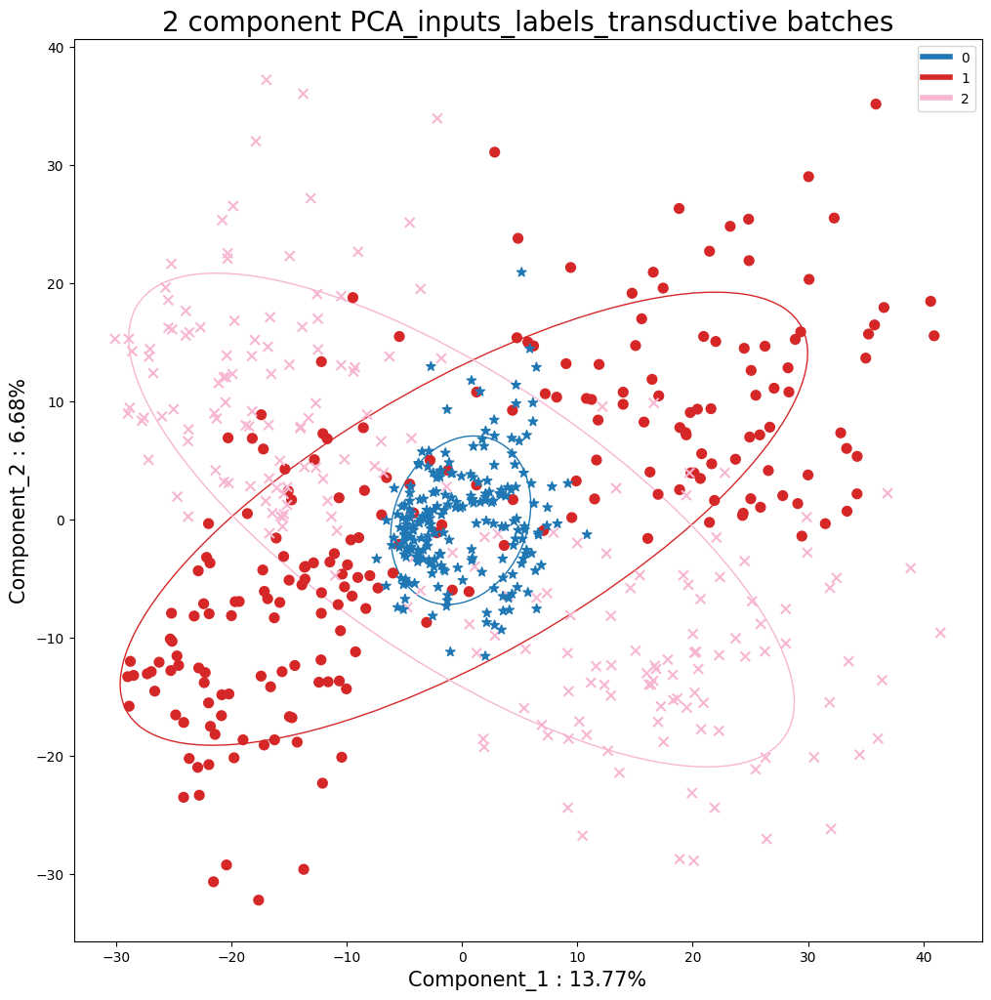

labels


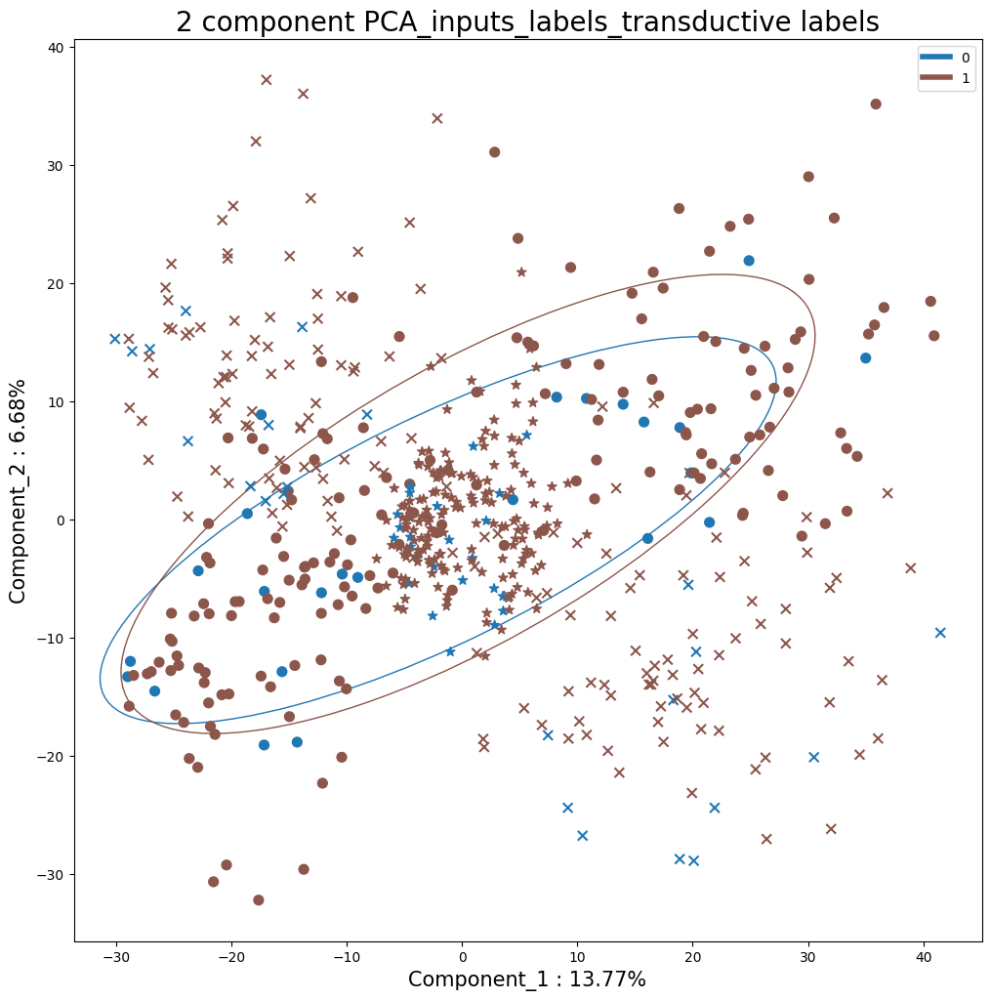

batches


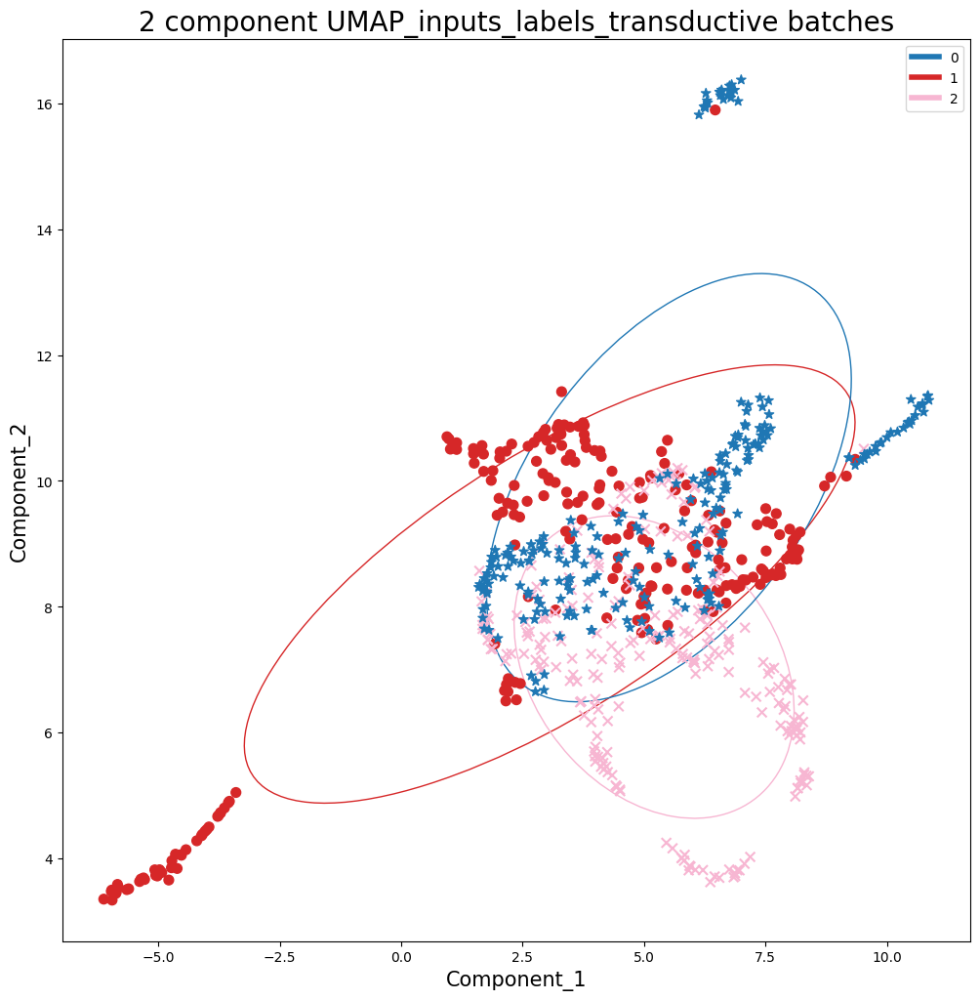

labels


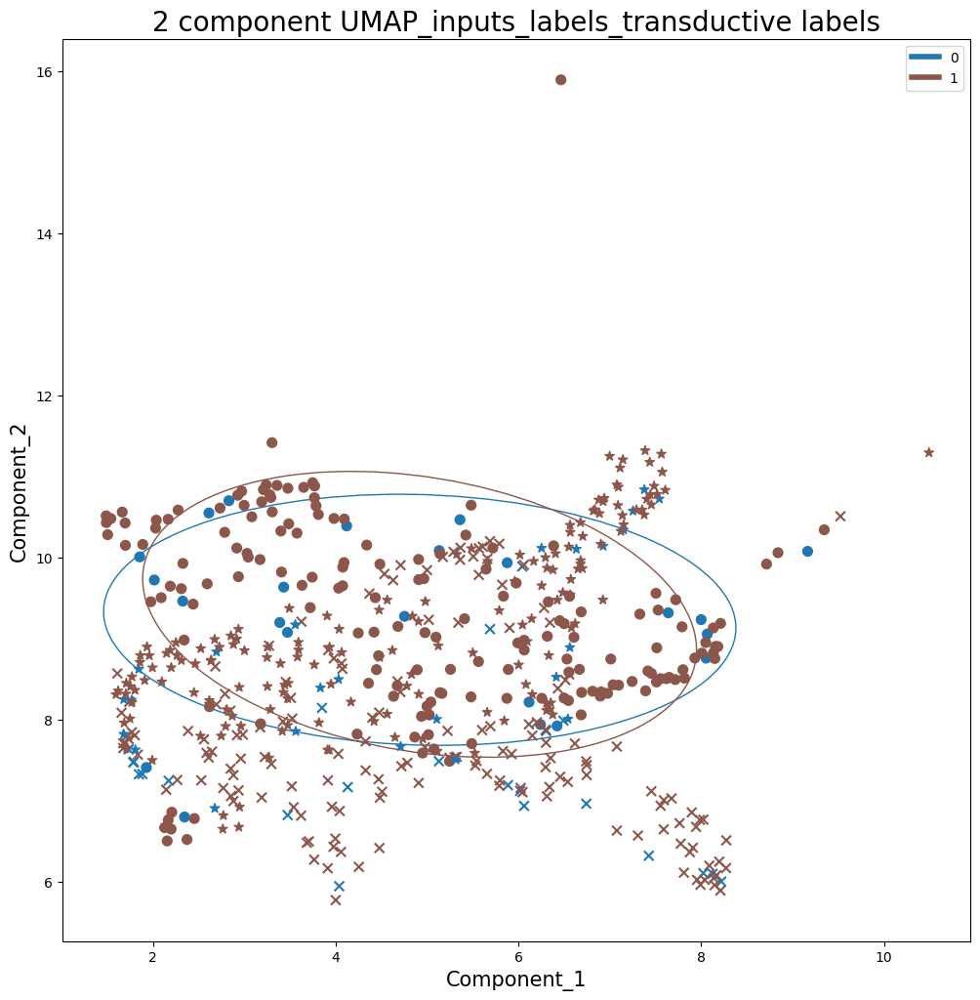

In [80]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_rfc(data, 'pycombat', n_meta)
    train_linsvc(data, 'pycombat', n_meta)
    # train_logreg(data, 'combat', n_meta)

# Harmony

In [ ]:
import rpy2.robjects as ro
base = importr('base')
batches_r = robjects.IntVector(batches.reshape(-1, 1))
batches_df = ro.DataFrame({'batches': batches_r})
batches_df

In [ ]:
data_r

In [ ]:
df = pd.DataFrame(data['inputs']['all'].values.T)
data_r = robjects.r.matrix(robjects.FloatVector(df.values.reshape(-1)), nrow=df.shape[0])
batches_r = robjects.IntVector(batches.reshape(-1))
sva = importr('sva')

print("not with classes!")
newdata = sva.ComBat(data_r, batches_r)


In [ ]:
batches_df

In [ ]:
# def harmonyR(data, batches, orders=None, classes=NULL, par_prior=True, ref_batch=NULL):
batches = data['batches']['all']
dat = data['inputs']['all']
df = pd.DataFrame(dat.values)
data_r = robjects.r.matrix(robjects.FloatVector(df.values.reshape(-1)), nrow=df.shape[0])
batches_r = robjects.IntVector(batches.reshape(-1))
harmony = importr('harmony')
tibble = importr('tibble')
base = importr('base')
newdata = harmony.HarmonyMatrix(data_r, tibble.as_tibble(batches_df), vars_use='batches', do_pca=False)
with localconverter(robjects.default_converter + pandas2ri.converter):
    newdata = np.array(robjects.conversion.rpy2py(newdata))

    


In [ ]:
path = 'data'
data, _, _ = get_amide(path, csv_name)
unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
data = remove_batch_effect(get_berm('harmony'), data)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'harmony')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'harmony', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'harmony')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
from tabulate import tabulate
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_rfc(data, 'harmony', n_meta)
    train_linsvc(data, 'harmony', n_meta)
    # train_logreg(data, 'harmony', n_meta)

# WaveICA

In [ ]:
import pandas as pd
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter

def waveicaR(data, batches):
    with localconverter(robjects.default_converter + pandas2ri.converter):
        data_r = robjects.conversion.py2rpy(data)

    # data_r = robjects.r.matrix(robjects.FloatVector(df.values.reshape(-1)), nrow=df.shape[0])
    batches_r = robjects.IntVector(batches.reshape(-1))
    waveica = importr('WaveICA')
    # data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    newdata = waveica.WaveICA(dat=data_r, batch=batches_r)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        newdata = { key : np.array(robjects.conversion.rpy2py(newdata.rx2(key))) for key in newdata.names }
    return newdata['data_wave']


path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

df = data['inputs']['all']
all_batches = data['batches']['all']
# assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
tmp = waveicaR(df, all_batches)

In [ ]:
previous_len = 0
for g in list(data['inputs'].keys())[1:-1]:
    data['inputs'][g] = pd.DataFrame(
        tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
        index=data['inputs'][g].index)
    previous_len += data['inputs'][g].shape[0]
try:
    data['inputs']['all'] = pd.DataFrame(tmp, index=df.index, columns=df.columns)
except:
    data['inputs']['all'] = pd.DataFrame(tmp, index=df.index)

if n_meta == 2:
    for group in data['inputs']:
        data['inputs'][group] = pd.DataFrame(np.concatenate((data['inputs'][group], data['meta'][group]), 1))


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'waveica')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'waveica', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'waveica')

In [ ]:
if train_models:
    train_rfc(data, 'waveica', n_meta)
    train_linsvc(data, 'waveica', n_meta)
    # train_logreg(data, 'waveica', n_meta)
    

# NORMAE

In [50]:
import sklearn.preprocessing as skp
class Normalization:
    Scalers = {
        'standard': skp.StandardScaler,
        'minmax': skp.MinMaxScaler,
        'maxabs': skp.MaxAbsScaler,
        'robust': skp.RobustScaler
    }

    def __init__(self, ty='standard', **kwargs):
        self.ty = ty
        self.scaler = __class__.Scalers[ty](**kwargs)
        self.fit_ind = False

    def __call__(self, x, y):
        xindex, xcolumns = x.index, x.columns  # scaler的结果是ndarray，但需要df
        values = x.values
        if self.fit_ind:
            x = self.scaler.transform(values)
        else:
            x = self.scaler.fit_transform(values)
            self.fit_ind = True
        return pd.DataFrame(x, index=xindex, columns=xcolumns), y

    def reset(self):
        if self.fit_ind:
            self.scaler = __class__.Scalers[self.ty]
            self.fit_ind = False

    def inverse_transform(self, x, y):
        xindex, xcolumns = x.index, x.columns  # scaler的结果是ndarray，但需要df
        res = self.scaler.inverse_transform(x.values)
        return pd.DataFrame(res, index=xindex, columns=xcolumns), y


In [51]:
class BatchEffectTrainer:
    def __init__(
            self, in_features, n_classes, batch_label_num, device, pre_transfer, opts
    ):

        # architecture
        self.n_classes = n_classes
        self.in_features = in_features
        self.batch_label_num = batch_label_num
        self.device = device
        self.dataset = opts.dataset
        self.encoder_hiddens = opts.ae_encoder_units
        self.decoder_hiddens = opts.ae_decoder_units
        self.disc_b_hiddens = opts.disc_b_units
        self.disc_o_hiddens = opts.disc_o_units
        self.bottle_num = opts.bottle_num
        self.dropouts = opts.dropouts
        self.save_dir = opts.save

        self.model_name = opts.model_name
        self.strategy = opts.strategy

        # loss
        self.use_batch_for_order = opts.use_batch_for_order
        self.lambda_b, self.lambda_o = opts.lambda_b, opts.lambda_o

        # optimizer
        self.lr_rec = opts.lr_rec
        self.lr_disc_b = opts.lr_disc_b
        self.lr_disc_o = opts.lr_disc_o
        self.lr_classif = opts.lr_classif

        # training
        self.epoch = sum(opts.epoch)
        self.rec_epoch, self.disc_epoch, self.iter_epoch, self.classif_epoch = opts.epoch
        self.bs, self.nw = opts.batch_size, opts.num_workers
        self.train_with_qc = opts.train_data == "all"
        self.use_meta_inputs = opts.use_meta_inputs
        self.use_meta_emb = opts.use_meta_emb

        # other
        self.strategy = opts.strategy
        self.visdom_port = opts.visdom_port
        self.visdom_env = opts.visdom_env
        self.pre_transfer = pre_transfer
        self.variational = opts.variational

        # training record
        self.history = {
            'disc_b_loss': [], 'disc_o_loss': [], 'adv_b_loss': [],
            'adv_o_loss': [], 'rec_loss': [], 'qc_rec_loss': [],
            'qc_distance': [], 'subject_dist': [], 'qc_dist/subject_dist': [],
            'valid_c_loss': [], 'test_c_loss': [],
            'valid_acc': [], 'valid_mcc': [], 'valid_auc': [],
            'test_acc': [], 'test_mcc': [], 'test_auc': [], 'qc_aPCC': []
        }
        # early stop
        self.early_stop_objs = {
            'best_epoch': -np.inf, 'best_qc_loss': np.inf, 'best_qc_distance': np.inf,
            'best_models': None, 'index': 0, 'best_score': np.inf, 'best_loss': np.inf
        }

    def fit(self, datas):
        # get dataloaders
        labels_inds = {label: [i for i, x in enumerate(datas['all'].y_df.iloc[:, 2]) if x == label] for label in
                       np.unique(datas['all'].y_df.iloc[:, 2])}
        batches_inds = {batch: [i for i, x in enumerate(datas['all'].y_df.iloc[:, 1]) if x == batch] for batch in
                        np.unique(datas['all'].y_df.iloc[:, 1])}
        qc_labels_inds = {label: [i for i, x in enumerate(datas['qc'].y_df.iloc[:, 2]) if x == label] for label in
                          np.unique(datas['qc'].y_df.iloc[:, 2])}
        qc_batches_inds = {batch: [i for i, x in enumerate(datas['qc'].y_df.iloc[:, 1]) if x == batch] for batch in
                           np.unique(datas['qc'].y_df.iloc[:, 1])}
        datas['all'].make_inds(labels_inds, batches_inds)
        datas['qc'].make_inds(qc_labels_inds, qc_batches_inds)
        all_data = data.ConcatDataset([datas['all'], datas['qc']]) if self.train_with_qc else datas['all']

        train_data = datas['train']
        valid_data = datas['valid']
        test_data = datas['test']
        # strategy = 'no'
        train_samples_weights = make_samples_weights(datas['train'].y_df.iloc[:, 2].to_numpy(), self.strategy, 'train')
        valid_samples_weights = make_samples_weights(datas['valid'].y_df.iloc[:, 2].to_numpy(), self.strategy, 'valid')
        test_samples_weights = make_samples_weights(datas['test'].y_df.iloc[:, 2].to_numpy(), self.strategy, 'test')
        self.n_classes = len([x for x in np.unique(train_samples_weights) if x > 0])
        # build model
        self._build_model()
        dataloaders = {
            'all': data.DataLoader(all_data, batch_size=self.bs, num_workers=self.nw, shuffle=True),
            'train': data.DataLoader(train_data, sampler=WeightedRandomSampler(train_samples_weights,
                                                                               int(sum(train_samples_weights)),
                                                                               replacement=True), batch_size=self.bs,
                                     num_workers=self.nw),
            'valid': data.DataLoader(valid_data, sampler=WeightedRandomSampler(valid_samples_weights,
                                                                               int(sum(valid_samples_weights)),
                                                                               replacement=False), batch_size=self.bs,
                                     num_workers=self.nw),
            'test': data.DataLoader(test_data,
                                    sampler=WeightedRandomSampler(test_samples_weights, int(sum(test_samples_weights)),
                                                                  replacement=False), batch_size=self.bs,
                                    num_workers=self.nw),
            'qc': data.DataLoader(datas['qc'], batch_size=self.bs, num_workers=self.nw, shuffle=True)
        }
        # begin training
        pbar = tqdm(total=self.epoch, position=0, leave=True)
        for e in range(self.epoch):
            self.e = e
            if e < self.rec_epoch:
                self.phase = 'rec_pretrain'
            elif e < self.rec_epoch + self.disc_epoch:
                self.phase = 'disc_pretrain'
            elif e < self.rec_epoch + self.disc_epoch + self.iter_epoch:
                self.phase = 'iter_train'
            else:
                self.phase = 'classif'

            # --- train phase ---
            for model in self.models.values():
                if model is not None:
                    model.train()
            disc_b_loss_obj = mm.Loss()
            disc_o_loss_obj = mm.Loss()
            valid_c_loss_obj = mm.Loss()
            test_c_loss_obj = mm.Loss()
            adv_b_loss_obj = mm.Loss()
            adv_o_loss_obj = mm.Loss()
            rec_loss_obj = mm.Loss()
            scores = {group: {'acc': [], 'auc': [], 'mcc': []} for group in ['train', 'valid', 'test']}
            if self.phase not in ['classif']:
                pbar.set_description(self.phase)
                for batch_x, batch_y, same_batch_sample, not_same_batch_sample, _ in dataloaders['all']:
                    # for x in [all_sample, qc_sample]:
                    # batch_x, batch_y, same_batch_sample, not_same_batch_sample, rec = x
                    # rec = rec.to(self.device).float()
                    batch_x = batch_x.to(self.device).float()
                    batch_y = batch_y.to(self.device).float()
                    # if self.use_meta_inputs:
                    #     batch_x = torch.concat((batch_x, batch_y[:, -2:]), 1)
                    bs0 = batch_x.size(0)
                    for optimizer in self.optimizers.values():
                        optimizer.zero_grad()
                    if self.phase in ['disc_pretrain', 'iter_train']:
                        disc_b_loss, disc_o_loss = self._forward_discriminate(batch_x, batch_y)
                        # if self.model_name not in ['normae_revTriplet']
                        disc_b_loss_obj.add(disc_b_loss, bs0)
                        disc_o_loss_obj.add(disc_o_loss, bs0)
                    if self.phase in ['rec_pretrain', 'iter_train'] and 'normae' in self.model_name:
                        if self.model_name == 'normae':
                            rec_loss, adv_b_loss, adv_o_loss = self._forward_autoencode(batch_x, batch_y, batch_x)
                        elif self.model_name == 'normae_dann':
                            rec_loss, adv_b_loss, adv_o_loss = self._forward_autoencode_dann(batch_x, batch_y, batch_x)
                        elif self.model_name == 'normae_revTriplet':
                            same_batch_sample = same_batch_sample.to(self.device).float()
                            not_same_batch_sample = not_same_batch_sample.to(self.device).float()
                            rec_loss, adv_b_loss, adv_o_loss = self._forward_autoencode_revTriplet(batch_x, batch_y,
                                                                                                   same_batch_sample,
                                                                                                   not_same_batch_sample,
                                                                                                   batch_x)
                        else:
                            exit(f'{self.model_name} not implemented')
                        rec_loss_obj.add(rec_loss, bs0)
                        adv_b_loss_obj.add(adv_b_loss, bs0)
                        adv_o_loss_obj.add(adv_o_loss, bs0)
            else:
                for batch_x, batch_y, _, _, _ in dataloaders['train']:
                    batch_x = batch_x.to(self.device).float()
                    batch_y = batch_y.to(self.device).float()
                    bs0 = batch_x.size(0)
                    preds, labels, c_loss = self._forward_classif(batch_x, batch_y, 'train', sample=True)
                all_preds, all_labels = [], []
                for batch_x, batch_y, _, _, _ in dataloaders['valid']:
                    batch_x = batch_x.to(self.device).float()
                    batch_y = batch_y.to(self.device).float()
                    preds, labels, c_loss = self._forward_classif(batch_x, batch_y, 'valid')
                    all_preds += [preds]
                    all_labels += [labels]
                    bs0 = batch_x.size(0)
                    valid_c_loss_obj.add(c_loss, bs0)
                scores['valid']['acc'] = [np.mean([0 if pred != dom else 1 for pred, dom in
                                                   zip(torch.concat(all_preds).detach().cpu().numpy().argmax(1),
                                                       torch.concat(all_labels).detach().cpu().numpy())])]
                scores['valid']['auc'] = [metrics.roc_auc_score(y_true=OneHotEncoder().fit_transform(
                    torch.concat(all_labels).reshape(-1, 1).detach().cpu().numpy()).toarray(),
                                                                y_score=torch.softmax(torch.concat(all_preds),
                                                                                      1).detach().cpu().numpy(),
                                                                multi_class='ovr')]
                scores['valid']['mcc'] = [np.round(
                    MCC(torch.concat(all_labels).detach().cpu().tolist(),
                        torch.concat(all_preds).detach().cpu().numpy().argmax(1).tolist()), 3)]
                for batch_x, batch_y, _, _, _ in dataloaders['test']:
                    batch_x = batch_x.to(self.device).float()
                    batch_y = batch_y.to(self.device).float()
                    preds, labels, c_loss = self._forward_classif(batch_x, batch_y, 'test')

                    bs0 = batch_x.size(0)
                    test_c_loss_obj.add(c_loss, bs0)

                scores['test']['acc'] = [np.mean([0 if pred != dom else 1 for pred, dom in
                                                  zip(preds.detach().cpu().numpy().argmax(1),
                                                      labels.detach().cpu().numpy())])]
                scores['test']['auc'] = [metrics.roc_auc_score(y_true=OneHotEncoder().fit_transform(
                    torch.concat(all_labels).reshape(-1, 1).detach().cpu().numpy()).toarray(),
                                                               y_score=torch.softmax(torch.concat(all_preds),
                                                                                     1).detach().cpu().numpy(),
                                                               multi_class='ovr')]
                scores['test']['mcc'] = [np.round(
                    MCC(labels.detach().cpu().tolist(), preds.detach().cpu().numpy().argmax(1).tolist()), 3)]

            # record loss
            self.history['disc_b_loss'].append(disc_b_loss_obj.value())
            self.history['disc_o_loss'].append(disc_o_loss_obj.value())
            self.history['adv_b_loss'].append(adv_b_loss_obj.value())
            self.history['adv_o_loss'].append(adv_o_loss_obj.value())
            self.history['rec_loss'].append(rec_loss_obj.value())
            if len(scores['valid']['acc']) > 0:
                self.history['valid_c_loss'].append(valid_c_loss_obj.value())
                self.history['test_c_loss'].append(test_c_loss_obj.value())
                self.history['valid_acc'].append(scores['valid']['acc'][0])
                self.history['valid_auc'].append(scores['valid']['auc'][0])
                self.history['valid_mcc'].append(scores['valid']['mcc'][0])
                self.history['test_acc'].append(scores['test']['acc'][0])
                self.history['test_auc'].append(scores['test']['auc'][0])
                self.history['test_mcc'].append(scores['test']['mcc'][0])
                pbar.set_description(f"{self.phase}, MCC: {np.mean(scores['test']['mcc'][0])}")

            else:
                self.history['valid_c_loss'].append(np.nan)
                self.history['test_c_loss'].append(np.nan)
                self.history['valid_acc'].append(np.nan)
                self.history['valid_mcc'].append(np.nan)
                self.history['valid_auc'].append(np.nan)
                self.history['test_acc'].append(np.nan)
                self.history['test_mcc'].append(np.nan)
                self.history['test_auc'].append(np.nan)
                # pbar.set_description(f"{self.phase}, MCC: {np.nan}")

            # visual epoch loss
            self.visobj.add_epoch_loss(
                winname='disc_losses',
                disc_b_loss=self.history['disc_b_loss'][-1],
                disc_o_loss=self.history['disc_o_loss'][-1],
                adv_b_loss=self.history['adv_b_loss'][-1],
                adv_o_loss=self.history['adv_o_loss'][-1],
            )
            self.visobj.add_epoch_loss(
                winname='recon_losses',
                recon_loss=self.history['rec_loss'][-1]
            )
            self.visobj.add_epoch_loss(
                winname='valid_classification',
                classif_loss=self.history['valid_c_loss'][-1],
                acc=self.history['valid_acc'][-1],
                auc=self.history['valid_auc'][-1],
                mcc=self.history['valid_mcc'][-1]
            )
            self.visobj.add_epoch_loss(
                winname='test_classification',
                classif_loss=self.history['test_c_loss'][-1],
                acc=self.history['test_acc'][-1],
                auc=self.history['test_auc'][-1],
                mcc=self.history['test_mcc'][-1]
            )
            if self.history['valid_c_loss'][-1] < self.early_stop_objs['best_loss']:
                self.early_stop_objs['best_loss'] = self.history['valid_c_loss'][-1]
                os.makedirs(self.save_dir, exist_ok=True)
                torch.save(self.early_stop_objs['best_models'], f'{self.save_dir}/{self.model_name}_best_c_loss.pth')

            # --- valid phase ---
            all_data = ConcatData(datas['all'], datas['qc'])
            all_reses_dict, qc_loss = self.generate(
                all_data, verbose=False, compute_qc_loss=True)
            # pca
            subject_pca, qc_pca = pca_for_dict(all_reses_dict, 3)
            # plot pca
            pca_plot(subject_pca, qc_pca)
            # display in visdom
            self.visobj.vis.matplot(plt, win='PCA', opts={'title': 'PCA'})
            plt.close()

            # --- early stopping ---
            qc_dist_rec = mm.mean_distance(qc_pca['Rec_nobe'])
            subject_dist_rec = mm.mean_distance(subject_pca['Rec_nobe'])
            qc_aPCC_rec = mm.get_qc_pcc(qc_pca['Rec_nobe'], pearsonr)
            qc_dist_enc = mm.mean_distance(qc_pca['Codes'])
            subject_dist_enc = mm.mean_distance(subject_pca['Codes'])
            qc_aPCC_enc = mm.get_qc_pcc(qc_pca['Codes'], pearsonr)

            self.history['qc_aPCC'].append(qc_aPCC_enc)
            self.history['qc_rec_loss'].append(qc_loss)
            self.history['qc_distance'].append(qc_dist_enc)
            self.history['subject_dist'].append(subject_dist_enc)
            self.history['qc_dist/subject_dist'].append(qc_dist_enc / subject_dist_enc)
            self.visobj.add_epoch_loss(winname='qc_aPCC',
                                       enc=qc_aPCC_enc[0][0],
                                       rec=qc_aPCC_rec[0][0]
                                       )
            self.visobj.add_epoch_loss(winname='qc_rec_loss', qc_loss=qc_loss)
            self.visobj.add_epoch_loss(winname='qc_dist',
                                       enc=qc_dist_enc,
                                       rec=qc_dist_rec
                                       )
            self.visobj.add_epoch_loss(winname='subject_dist',
                                       enc=subject_dist_enc,
                                       rec=subject_dist_rec,
                                       )
            self.visobj.add_epoch_loss(winname='norm_dist',
                                       enc=qc_dist_enc / subject_dist_enc,
                                       rec=qc_dist_rec / subject_dist_rec,
                                       )
            if self.phase == 'iter_train':
                self._check_qc(qc_dist_rec, qc_loss)
            values = log_metrics(datas, self.models, variational=self.variational)
            # progressbar
            self.visobj.add_epoch_loss(winname='ARI',
                                       inputs=values['all']['adjusted_rand_score']['inputs']['domains'][-1],
                                       enc=values['all']['adjusted_rand_score']['enc']['domains'][-1],
                                       rec=values['all']['adjusted_rand_score']['rec']['domains'][-1])
            self.visobj.add_epoch_loss(winname='AMI',
                                       inputs=values['all']['adjusted_mutual_info_score']['inputs']['domains'][-1],
                                       enc=values['all']['adjusted_mutual_info_score']['enc']['domains'][-1],
                                       rec=values['all']['adjusted_mutual_info_score']['rec']['domains'][-1])
            self.visobj.add_epoch_loss(winname='batch_entropy',
                                       inputs=values['all']['batch_entropy']['inputs']['domains'][-1],
                                       enc=values['all']['batch_entropy']['enc']['domains'][-1],
                                       rec=values['all']['batch_entropy']['rec']['domains'][-1])

            pbar.update(1)
        pbar.close()

        # early stop information and save visdom env
        # if self.visdom_env != 'main':
        self.visobj.vis.save([f"{self.save_dir}/{self.visdom_env}"])
        print('')
        print('The best epoch is %d' % self.early_stop_objs['best_epoch'])
        print('The best qc loss is %.4f' %
              self.early_stop_objs['best_qc_loss'])
        print('The best qc distance is %.4f' %
              self.early_stop_objs['best_qc_distance'])
        for k, v in self.models.items():
            if self.early_stop_objs['best_models'][k] is not None:
                v.load_state_dict(self.early_stop_objs['best_models'][k])
        self.early_stop_objs.pop('best_models')
        return self.models, self.history, self.early_stop_objs

    def generate(self, data_loader, verbose=True, compute_qc_loss=False):
        device = 'cuda:0'
        for m in self.models.values():
            if m is not None:
                m.to(self.device).eval()
        if isinstance(data_loader, data.Dataset):
            data_loader = data.DataLoader(
                data_loader, batch_size=self.bs, num_workers=self.nw)
        x_ori, x_rec, x_rec_nobe, ys, codes = [], [], [], [], []
        qc_loss = mm.Loss()

        # encoding
        if verbose:
            print('----- encoding -----')
            iterator = tqdm(data_loader, position=0, leave=True, desc='encode and decode: ')
        else:
            iterator = data_loader
        with torch.no_grad():
            for batch_x, batch_y, _, _, _ in iterator:
                # return x and y
                # if self.use_meta_inputs:
                #     batch_x = torch.concat((batch_x, batch_y[:, -2:]), 1)
                x_ori.append(batch_x)
                ys.append(batch_y)
                # return latent representation
                batch_x = batch_x.to(self.device, torch.float)
                batch_y = batch_y.to(self.device, torch.float)
                hidden = self.models['encoder'](batch_x)
                batch_ys = [
                    torch.eye(self.batch_label_num).to(device)[batch_y[:, 1].long()],
                    batch_y[:, [0]]
                ]
                batch_ys = torch.cat(batch_ys, dim=1)
                qc_index = batch_y[:, -1] == -1.
                if self.variational:
                    hidden_samples, _, _ = self.models['gaussian'](hidden[~qc_index], train=True, beta=1)
                    if qc_index.sum() > 0:
                        hidden_qc, _, _ = self.models['gaussian'](hidden[qc_index], train=False, beta=1)
                        hidden = torch.cat((hidden_samples, hidden_qc))
                    else:
                        hidden = hidden_samples
                hidden_be = hidden + self.models['map'](batch_ys)
                codes.append(hidden)
                # return rec with and without batch effects
                x_rec.append(self.models['decoder'](hidden_be))
                x_rec_nobe.append(self.models['decoder'](hidden))
                # return qc loss
                if compute_qc_loss:
                    qc_index = batch_y[:, -1] == -1.
                    if qc_index.sum() > 0:
                        batch_qc_loss = self.criterions['rec'](
                            batch_x[qc_index], x_rec[-1][qc_index])
                        qc_loss.add(
                            batch_qc_loss,
                            qc_index.sum().detach().cpu().item()
                        )
                    else:
                        qc_loss.add(torch.tensor(0.), 0)

        # return dataframe
        res = {
            'Ori': torch.cat(x_ori), 'Ys': torch.cat(ys),
            'Codes': torch.cat(codes), 'Rec': torch.cat(x_rec),
            'Rec_nobe': torch.cat(x_rec_nobe)
        }
        # if self.use_meta_inputs:
        #     new_columns = ['age', 'gender']
        # else:
        #     new_columns = []
        for k, v in res.items():
            if v is not None:
                if k == 'Ys':
                    res[k] = pd.DataFrame(
                        v.detach().cpu().numpy(),
                        index=data_loader.dataset.y_df.index,
                        columns=data_loader.dataset.y_df.columns
                    )
                elif k != 'Codes':
                    res[k] = pd.DataFrame(
                        v.detach().cpu().numpy(),
                        index=data_loader.dataset.x_df.index,
                        columns=list(data_loader.dataset.x_df.columns)  #  + new_columns
                    )
                    res[k] = self.pre_transfer.inverse_transform(
                        res[k], None)[0]
                else:
                    res[k] = pd.DataFrame(
                        v.detach().cpu().numpy(),
                        index=data_loader.dataset.x_df.index,
                    )

        if compute_qc_loss:
            return res, qc_loss.value()
        return res

    def load_model(self, model_file):
        saved_model = torch.load(model_file)
        for k in self.early_stop_objs:
            saved_model.pop(k, None)
        self.models = saved_model

    def _check_qc(self, qc_dist, qc_loss):
        early_stop_score = qc_dist + qc_loss * 100
        if early_stop_score < self.early_stop_objs['best_score']:
            self.early_stop_objs['best_epoch'] = self.e
            self.early_stop_objs['best_models'] = {
                k: copy.deepcopy(v.state_dict())
                for k, v in self.models.items()
            }
            self.early_stop_objs['best_qc_loss'] = qc_loss
            self.early_stop_objs['best_qc_distance'] = qc_dist
            self.early_stop_objs['best_score'] = early_stop_score
            self.early_stop_objs['index'] = 0
        else:
            self.early_stop_objs['index'] += 1

    def _build_model(self):
        device = 'cuda:0'
        logit_dim = self.batch_label_num + 1
        # build models
        if self.use_meta_emb:
            n_meta_emb = 2
        else:
            n_meta_emb = 0
        self.models = {
            'classif': SimpleCoder(
                [500 + n_meta_emb] +
                [self.n_classes], dropout=self.dropouts[0]
            ).to(self.device),
            'encoder': SimpleCoder(
                [self.in_features] + self.encoder_hiddens +
                [self.bottle_num], dropout=self.dropouts[0]
            ).to(self.device),
            'decoder': SimpleCoder(
                [self.bottle_num] + self.decoder_hiddens +
                [self.in_features], dropout=self.dropouts[1],
                final_act=None
            ).to(self.device),
            'map': SimpleCoder(
                [logit_dim] + [500] + [self.bottle_num],
            ).to(self.device),
            'disc_b': SimpleCoder(
                [self.bottle_num] + self.disc_b_hiddens +
                [self.batch_label_num], bn=True, dropout=self.dropouts[2]
            ).to(self.device),
            "disc_o": SimpleCoder(
                [self.bottle_num] + self.disc_o_hiddens + [1],
                bn=False, dropout=self.dropouts[3]
            ).to(self.device)
        }
        if self.variational:
            self.models['gaussian'] = GaussianSample(500, 500, device).to(self.device)

        # build loss
        if 'Triplet' in self.model_name:
            bloss = nn.TripletMarginLoss(margin=1, swap=True)
        else:
            bloss = nn.CrossEntropyLoss()
        self.criterions = {
            'classif': nn.CrossEntropyLoss(),
            'disc_b': bloss,
            'disc_o': OrderLoss(),
            "rec": nn.L1Loss()
        }
        # build optim
        optimizer_obj = partial(optim.Adam, betas=(0.5, 0.9))
        if self.variational:
            rec_optimizer = optimizer_obj(
                chain(
                    self.models['encoder'].parameters(),
                    self.models['decoder'].parameters(),
                    self.models['gaussian'].parameters(),
                    self.models['map'].parameters()
                ), lr=self.lr_rec
            )
        else:
            rec_optimizer = optimizer_obj(
                chain(
                    self.models['encoder'].parameters(),
                    self.models['decoder'].parameters(),
                    self.models['map'].parameters()
                ), lr=self.lr_rec
            )
        self.optimizers = {
            'rec': rec_optimizer,
            "disc_b": optimizer_obj(self.models['disc_b'].parameters(),
                                    lr=self.lr_disc_b),
            "disc_o": optimizer_obj(self.models['disc_o'].parameters(),
                                    lr=self.lr_disc_o),
            "classif": optimizer_obj(self.models['classif'].parameters(),
                                     lr=self.lr_classif),
        }

    def _forward_autoencode(self, batch_x, batch_y, rec):
        ''' autoencode进行训练的部分 '''
        device = 'cuda:0'
        res = [None, None, None]
        with torch.enable_grad():
            all_loss = 0.
            hidden = self.models['encoder'](batch_x)
            # decoder
            batch_ys = [
                torch.eye(self.batch_label_num).to(device)[batch_y[:, 1].long()],
                batch_y[:, [0]]

            ]
            batch_ys = torch.cat(batch_ys, dim=1)
            if self.phase == "iter_train":
                # adversarial regularizations (disc_b)
                logit_b = self.models['disc_b'](hidden)
                loss_b = self.criterions['disc_b'](logit_b, batch_y[:, 1].long())
                all_loss -= self.lambda_b * loss_b
                res[1] = loss_b
                # adversarial regularizations (disc_o)
                if self.use_batch_for_order:
                    group = batch_y[:, 1]
                else:
                    group = None
                logit_o = self.models['disc_o'](hidden)
                loss_o = self.criterions['disc_o'](logit_o, batch_y[:, 0], group)
                all_loss -= self.lambda_o * loss_o
                res[2] = loss_o
            if self.variational:
                hidden, mu, log_var = self.models['gaussian'](hidden, train=True, beta=1)
                # Kullback-Leibler Divergence
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
                all_loss += 0.1 * kl.mean()
            hidden_be = hidden + self.models['map'](batch_ys)
            batch_x_rec = self.models['decoder'](hidden_be)
            # reconstruction losses
            recon_loss = self.criterions['rec'](batch_x_rec, rec)
            all_loss += recon_loss
            res[0] = recon_loss

        all_loss.backward()
        nn.utils.clip_grad_norm_(
            chain(self.models["encoder"].parameters(),
                  self.models["decoder"].parameters(),
                  self.models["map"].parameters()),
            max_norm=1
        )
        self.optimizers['rec'].step()
        return res

    def _forward_autoencode_dann(self, batch_x, batch_y, rec):
        ''' autoencode进行训练的部分 '''
        device = 'cuda:0'
        res = [None, None, None]
        with torch.enable_grad():
            all_loss = 0.
            hidden = self.models['encoder'](batch_x)
            batch_ys = [
                torch.eye(self.batch_label_num).to(device)[batch_y[:, 1].long()],
                batch_y[:, [0]]

            ]
            batch_ys = torch.cat(batch_ys, dim=1)

            if self.phase == "iter_train":
                # adversarial regularizations (disc_b)
                reverse = ReverseLayerF.apply(hidden, 1)
                logit_b = self.models['disc_b'](reverse)
                loss_b = self.criterions['disc_b'](logit_b, batch_y[:, 1].long())
                all_loss += self.lambda_b * loss_b
                res[1] = loss_b
                # adversarial regularizations (disc_o)
                if self.use_batch_for_order:
                    group = batch_y[:, 1]
                else:
                    group = None
                logit_o = self.models['disc_o'](reverse)
                loss_o = self.criterions['disc_o'](logit_o, batch_y[:, 0], group)
                all_loss += self.lambda_o * loss_o
                res[2] = loss_o
            if self.variational:
                hidden, mu, log_var = self.models['gaussian'](hidden, train=True, beta=1)
                # Kullback-Leibler Divergence
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
                all_loss += 0.1 * kl.mean()
            # decoder
            hidden_be = hidden + self.models['map'](batch_ys)
            batch_x_rec = self.models['decoder'](hidden_be)
            # reconstruction losses
            recon_loss = self.criterions['rec'](batch_x_rec, rec)
            all_loss += recon_loss
            res[0] = recon_loss
        all_loss.backward()
        nn.utils.clip_grad_norm_(
            chain(self.models["encoder"].parameters(),
                  self.models["decoder"].parameters(),
                  self.models["map"].parameters()),
            max_norm=1
        )
        self.optimizers['rec'].step()
        return res

    def _forward_autoencode_revTriplet(self, batch_x, batch_y, same_batch_sample, not_same_batch_sample, rec):
        ''' autoencode进行训练的部分 '''
        device = 'cuda:0'
        res = [None, None, None]
        with torch.enable_grad():
            all_loss = 0.
            hidden = self.models['encoder'](batch_x)
            same_batch_hidden = self.models['encoder'](same_batch_sample)
            not_same_batch_hidden = self.models['encoder'](not_same_batch_sample)

            # decoder
            batch_ys = [
                torch.eye(self.batch_label_num).to(device)[batch_y[:, 1].long()],
                batch_y[:, [0]]
            ]
            batch_ys = torch.cat(batch_ys, dim=1)
            if self.phase == "iter_train":
                # adversarial regularizations (disc_b)
                reverse_hidden = ReverseLayerF.apply(hidden, 1)
                # reverse_same_batch_hidden = ReverseLayerF.apply(same_batch_hidden, 1)
                # reverse_not_same_batch_hidden = ReverseLayerF.apply(not_same_batch_hidden, 1)
                # logit_b = self.models['disc_b'](reverse_hidden, reverse_same_batch_hidden, reverse_not_same_batch_sample)

                loss_b = self.criterions['disc_b'](hidden, not_same_batch_hidden, same_batch_hidden)
                all_loss += self.lambda_b * loss_b
                res[1] = loss_b
                # adversarial regularizations (disc_o)
                if self.use_batch_for_order:
                    group = batch_y[:, 1]
                else:
                    group = None
                logit_o = self.models['disc_o'](reverse_hidden)
                loss_o = self.criterions['disc_o'](logit_o, batch_y[:, 0], group)
                all_loss += self.lambda_o * loss_o
                res[2] = loss_o
            if self.variational:
                hidden, mu, log_var = self.models['gaussian'](hidden, train=True, beta=1)
                # Kullback-Leibler Divergence
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
                all_loss += 0.1 * kl.mean()
            hidden_be = hidden + self.models['map'](batch_ys)
            batch_x_rec = self.models['decoder'](hidden_be)
            # reconstruction losses
            recon_loss = self.criterions['rec'](batch_x_rec, rec)
            all_loss += recon_loss
            res[0] = recon_loss

        all_loss.backward()
        nn.utils.clip_grad_norm_(
            chain(self.models["encoder"].parameters(),
                  self.models["decoder"].parameters(),
                  self.models["map"].parameters()),
            max_norm=1
        )
        self.optimizers['rec'].step()
        return res

    def _forward_discriminate(self, batch_x, batch_y):
        with torch.no_grad():
            hidden = self.models['encoder'](batch_x)
            if self.variational:
                hidden, _, _ = self.models['gaussian'](hidden, train=True, beta=1)

        with torch.enable_grad():
            # disc_b
            if self.model_name != 'normae_revTriplet':
                logit_b = self.models['disc_b'](hidden)
                adv_b_loss = self.criterions['disc_b'](logit_b, batch_y[:, 1].long())
                adv_b_loss.backward()
                nn.utils.clip_grad_norm_(self.models["disc_b"].parameters(), max_norm=1)
                self.optimizers['disc_b'].step()
            else:
                adv_b_loss = torch.zeros(1)[0]
            # disc_o
            logit_o = self.models['disc_o'](hidden)
            if self.use_batch_for_order:
                group = batch_y[:, 1]
            else:
                group = None
            try:
                adv_o_loss = self.criterions['disc_o'](logit_o, batch_y[:, 0], group)
            except:
                pass
            adv_o_loss.backward()
            nn.utils.clip_grad_norm_(self.models["disc_b"].parameters(), max_norm=1)
            self.optimizers['disc_o'].step()
        return [adv_b_loss, adv_o_loss]

    def _forward_classif(self, batch_x, batch_y, step, sample=False):
        with torch.no_grad():
            hidden = self.models['encoder'](batch_x)
            if self.variational:
                if sample:
                    hidden, _, _ = self.models['gaussian'](hidden, train=True, beta=1)
                else:
                    hidden, _, _ = self.models['gaussian'](hidden, train=False, beta=1)

            if self.use_meta_emb:
                hidden = torch.concat((hidden, batch_y[:, -2:]), 1)

        with torch.enable_grad():
            # disc_b
            preds = self.models['classif'](hidden)
            labels = batch_y[:, 2].long()
            c_loss = self.criterions['classif'](preds, batch_y[:, 2].long())

            if step == 'train':
                c_loss.backward()
                nn.utils.clip_grad_norm_(self.models["classif"].parameters(),
                                         max_norm=1)
                self.optimizers['classif'].step()
        return [preds, labels, c_loss]



In [52]:
import argparse
import numpy as np
import os
class Config:
    def __init__(self, load):
        # task
        self.ae_encoder_units=[1000, 1000]
        self.ae_decoder_units=[1000, 1000]
        self.disc_b_units=[250, 250]
        self.disc_o_units=[250, 250]
        self.bottle_num=500
        self.dropouts=(0.3, 0.1, 0.3, 0.3)
        self.dataset = 'amide'
        self.save = ''
        self.model_name = ''
        self.strategy = ''
        self.use_batch_for_order = 1
        self.lambda_b = 1
        self.lambda_o = 1
        self.lr_rec = 1
        self.lr_disc_b = 1
        self.lr_disc_o = 1
        self.lr_classif = 1
        self.batch_size = 1
        self.num_workers = 0
        self.train_data = None
        self.use_meta_inputs = None
        self.use_meta_emb = None
        self.visdom_port = None
        self.visdom_env = None
        self.variational = None
        self.epoch = (0, 0, 0, 0)
        self.load = load


In [53]:
def get_amide_data(
    y_file, pre_transfer=None, sub_qc_split=True, use_log=False,
    use_batch=None, use_samples_size=None, random_seed=None
):
    '''
    Read metabolic data file and get dataframes
    metabolic data (x_file) example:
        name,mz,rt,QC1,A1,A2,A3,QC2,A4\n
        M64T32,64,32,1000,2000,3000,4000,5000,6000\n
        M65T33,65,33,10000,20000,30000,40000,50000,60000\n
        ...
    sample information data (y_file) example:
        sample.name,injection.order,batch,group,class\n
        QC1,1,1,QC,QC\n
        A1,2,1,0,Subject\n
        A2,3,1,1,Subject\n
        A3,4,1,1,Subject\n
        QC2,5,2,QC,QC\n
        A4,6,2,0,Subject\n
        A5,7,2,1,Subject\n
        A6,8,2,1,Subject\n
        ...
    '''
    # read y_file
    all_df = pd.read_csv(y_file, index_col=0)
    all_df = all_df.dropna()
    # read x_file

    # remove peaks that has most zero values in all samples
    meta_df, y_df = all_df.iloc[:, 3:], all_df.iloc[:, :3]
    mask1 = (meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask1]
    # remove peaks that has most zero values in QCs
    qc_mask = y_df['group'] == 'QC'
    qc_meta_df = meta_df.loc[qc_mask, :]
    mask2 = (qc_meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask2]

    # for each peak, impute the zero values with the half of minimum values
    def impute_zero(peak):
        zero_mask = peak == 0
        if zero_mask.any():
            new_x = peak.copy()
            impute_value = peak.loc[~zero_mask].min()
            new_x[zero_mask] = impute_value / 2
            return new_x
        return peak

    meta_df = meta_df.apply(impute_zero, axis=0)

    # extract the useful information from y_file
    y_df = y_df.loc[:, ['Injection_order', 'batch', 'group']]
    # batch labels are transform to beginning from zero
    y_df.loc[:, 'batch'] -= 1
    # digitize group
    y_df['group'].replace('QC', '-1', inplace=True)
    y_df['group'] = y_df['group'].astype('int')
    # digitize class
    # y_df['class'].replace({'Subject': 1, 'QC': 0}, inplace=True)
    # inverse injection.order
    # y_df['injection.order'] = y_df['injection.order'].max(
    # ) - y_df['injection.order']

    if use_batch is not None:
        bool_ind = (y_df.loc[:, "batch"] < use_batch).values
        meta_df, y_df = meta_df.loc[bool_ind, :], y_df.loc[bool_ind, :]
    if use_samples_size is not None:
        meta_df, _, y_df, _ = train_test_split(
            meta_df, y_df, train_size=use_samples_size,
            stratify=y_df.loc[:, "batch"].values,
            random_state=random_seed
        )
    if use_log:
        meta_df = meta_df.applymap(np.log)
    if pre_transfer is not None:
        meta_df, y_df = pre_transfer(meta_df, y_df)
    if sub_qc_split:
        qc_index = y_df['group'] == -1
        return BaseData(meta_df, y_df, False), \
            BaseData(meta_df[qc_index], y_df[qc_index], True)
    return BaseData(meta_df, y_df, None, False)


In [54]:
opts = Config(load='save_alzheimer_normae_vae0_nmeta0_nmeta-emb2')
pre_transfer = Normalization("standard")
trainer = BatchEffectTrainer(572, 2, 21, 'cpu', pre_transfer, opts)
model_file = os.path.join(opts.load, "models.pth") \
    if os.path.isdir(opts.load) else opts.load
trainer.load_model(model_file)


## Encoded

In [81]:
path = 'data'
data, unique_labels = get_harvard(path, csv_name, 'CU_DEM-AD', bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

In [82]:
group

'train_pool'

In [83]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['all'].values))
enc_data['inputs']['all_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['all_pool'].values))
enc_data['inputs']['train'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['train'].values))
enc_data['inputs']['train_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['train_pool'].values))
enc_data['inputs']['valid'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['valid'].values))
enc_data['inputs']['valid_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['valid_pool'].values))
enc_data['inputs']['test'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['test'].values))
enc_data['inputs']['test_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['test_pool'].values))

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    # if n_meta == 2:
    #     enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [84]:
path = 'model_0.pth'

In [86]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  ---------  -
CU_DEM-AD            0.566875   0
CU_MCI-AD            0.470123   0
CU_MCI-other         0.775784   0
CU_NPH               0.999435   0
CU_DEM-other         0.773327   0
DEM-AD_MCI-AD        0.998165   0
DEM-AD_MCI-other     0.100766   0
DEM-AD_NPH           0.970508   0
DEM-AD_DEM-other     0.299135   0
MCI-AD_MCI-other     0.0630197  0
MCI-AD_NPH           0.802623   0
MCI-AD_DEM-other     0.26229    0
MCI-other_NPH        0.246729   0
MCI-other_DEM-other  1          0
NPH_DEM-other        0.671555   0
-------------------  ---------  -
ttests
-------------------  ---------  -
CU_DEM-AD            0.915768   0
CU_MCI-AD            0.95623    0
CU_MCI-other         0.4312     0
CU_NPH               0.987018   0
CU_DEM-other         0.725191   0
DEM-AD_MCI-AD        0.999217   0
DEM-AD_MCI-other     0.0773679  0
DEM-AD_NPH           0.999981   0
DEM-AD_DEM-other     0.439455   0
MCI-AD_MCI-other     0.0905964  0
MCI-

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'aedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'aedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
if train_models:
    train_rfc(enc_data, 'aedann-enc', n_meta)
    train_linsvc(enc_data, 'aedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [89]:
path = 'data'
data, unique_labels = get_harvard(path, csv_name, 'CU_DEM-AD', bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

In [90]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])

enc_data = data.copy()
rec_data = data.copy()

enc_data['inputs']['all'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['all'].values))
enc_data['inputs']['all_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['all_pool'].values))
enc_data['inputs']['train'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['train'].values))
enc_data['inputs']['train_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['train_pool'].values))
enc_data['inputs']['valid'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['valid'].values))
enc_data['inputs']['valid_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['valid_pool'].values))
enc_data['inputs']['test'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['test'].values))
enc_data['inputs']['test_pool'] = trainer.models['encoder'].cpu()(torch.Tensor(data['inputs']['test_pool'].values))

rec_data['inputs']['all'] = trainer.models['decoder'].cpu()(enc_data['inputs']['all'])
rec_data['inputs']['all_pool'] = trainer.models['decoder'].cpu()(enc_data['inputs']['all_pool'])
rec_data['inputs']['train'] = trainer.models['decoder'].cpu()(enc_data['inputs']['train'])
rec_data['inputs']['train_pool'] = trainer.models['decoder'].cpu()(enc_data['inputs']['train_pool'])
rec_data['inputs']['valid'] = trainer.models['decoder'].cpu()(enc_data['inputs']['valid'])
rec_data['inputs']['valid_pool'] = trainer.models['decoder'].cpu()(enc_data['inputs']['valid_pool'])
rec_data['inputs']['test'] = trainer.models['decoder'].cpu()(enc_data['inputs']['test'])
rec_data['inputs']['test_pool'] = trainer.models['decoder'].cpu()(enc_data['inputs']['test_pool'])

for group in enc_data['inputs']:
    rec_data['inputs'][group] = pd.DataFrame(rec_data['inputs'][group].detach().cpu().numpy())
    # if n_meta == 2:
    #     enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [92]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  ---------  ---
CU_DEM-AD            0.751244     0
CU_MCI-AD            0.502529     0
CU_MCI-other         0.500802     0
CU_NPH               0.997874     0
CU_DEM-other         0.575375     0
DEM-AD_MCI-AD        0.999552     0
DEM-AD_MCI-other     0.0689471    0
DEM-AD_NPH           0.995713     0
DEM-AD_DEM-other     0.153486     0
MCI-AD_MCI-other     0.0482354  237
MCI-AD_NPH           0.977789     0
MCI-AD_DEM-other     0.163491     0
MCI-other_NPH        0.302949     0
MCI-other_DEM-other  0.998631     0
NPH_DEM-other        0.333463     0
-------------------  ---------  ---
ttests
-------------------  ---------  ---
CU_DEM-AD            0.971207     0
CU_MCI-AD            0.99555      0
CU_MCI-other         0.220476     0
CU_NPH               0.998399     0
CU_DEM-other         0.516775     0
DEM-AD_MCI-AD        0.999051     0
DEM-AD_MCI-other     0.0483966  298
DEM-AD_NPH           0.999765     0
DEM-AD_DEM-other    

In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    metrics['aedann-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'aedann-rec', n_meta)
    train_linsvc(rec_data, 'aedann-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

In [81]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['qc_aPCC', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols + cols_pool, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score,pool lisi,pool silhouette,pool kbet,pool shannon,pool adjusted_rand_score,pool adjusted_mutual_info_score
raw,0.815415,0.838954,1.825332,0.232852,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
minmax,0.480164,0.902304,2.131924,0.244783,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
minmax_per_batch,0.325926,0.967037,2.384002,0.16348,0.000035,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
standard,0.18279,0.913505,1.904793,0.202406,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
standard_per_batch,0.239696,0.961342,2.190061,-0.000819,0.0,0.202112,0.958372,0.929593,NaN,NaN,NaN,NaN,NaN,NaN
robust,0.310263,0.881791,2.12807,0.152401,0.0,0.009617,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
robust_per_batch,0.360971,1.035938,2.223215,0.005672,0.013149,0.335144,0.844217,0.805306,NaN,NaN,NaN,NaN,NaN,NaN
combat,0.008655,1.181689,1.021349,-0.010799,0.0,0.825778,0.008524,0.021677,NaN,NaN,NaN,NaN,NaN,NaN
pycombat,0.94308,0.793879,1.805688,-0.023297,0.0,0.284751,0.175841,0.370541,NaN,NaN,NaN,NaN,NaN,NaN


# AE 

## Encoded

In [87]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


NameError: name 'get_data' is not defined

In [ ]:
if not best_correction:
    # Best score run Brain-1446
    path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld0/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch0/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches/remove_zeros0/n_meta2/n_repeats5/minmax/bermnone/adam/ncols-1/thres0/layers_63-893/d0/gamma0/beta0/zeta0/nu57.62209361696243/margin4.261329859495163/smooth0/lr4.85414884669202e-05/wd2.1707730937174506e-06/model_0.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw1/tl0/tld0/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch0/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/groukfold1/standard_minmax/bermnone/adam/ncols-1/thres0/layers_595-266/d0/gamma0/beta0/zeta0/nu49.174486355422346/margin9.692095908336341/smooth0/lr0.0015474593243259335/wd1.7888652782772013e-07/model_1.pth'
    

In [ ]:
print(data['inputs']['all'].shape)
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder0(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=63,
                     mapper=0,
                     layer2=893,
                     dropout=0,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, n_meta=2,
                     use_gnn=0, device='cuda').to('cuda')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=True)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=True)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=True)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=True)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
enc_data['inputs']['all'].shape

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'ae-enc')


In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-enc', n_meta)
    train_linsvc(enc_data, 'ae-enc', n_meta)
    # train_logreg(enc_data, 'ae-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'ae-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'ae-rec', device='cuda')
    metrics =log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'ae-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'ae-rec', n_meta)
    train_linsvc(rec_data, 'ae-rec', n_meta)
    # train_logreg(rec_data, 'ae-rec', n_meta)
    

# VAE

## Encoded

In [136]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder

In [137]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

In [138]:
if not best_correction:
    # Best Run Brain-1719
    path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld0/pseudo0/vae1/zinb0/balanced0/thres0.0/dannset0/dannbatch0/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/groukfold0/minmax/bermnone/adam/ncols-1/thres0/layers_63-893/d0/gamma0/beta32.6809463738317/zeta0/nu57.62209361696243/margin4.261329859495163/smooth0/lr4.85414884669202e-05/wd2.1707730937174506e-06/model_0.pth'
else:
    # Best correction path
    path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld0/pseudo0/vae1/zinb0/balanced0/thres0.0/dannset0/dannbatch0/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/groukfold0/robust_minmax/bermnone/adam/ncols-1/thres0/layers_892-574/d0/gamma0/beta6.4794353577005115/zeta0/nu21.648275041587837/margin9.503732382319868/smooth0/lr0.00022000273638880235/wd4.2665766986491783e-07/model_1.pth'


In [139]:
best_correction

False

In [140]:
print(data['inputs']['all'].shape)
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=21,
                     nb_classes=2,
                     layer1=63,
                     mapper=0,
                     layer2=893,
                     dropout=0,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, n_emb=2, n_meta=0,
                     use_gnn=0, device='cuda').to('cuda')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=892,
                 mapper=0,
                 layer2=574,
                 dropout=0,
                 variational=1, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

(389, 896)


FileNotFoundError: [Errno 2] No such file or directory: 'logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld0/pseudo0/vae1/zinb0/balanced0/thres0.0/dannset0/dannbatch0/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/groukfold0/minmax/bermnone/adam/ncols-1/thres0/layers_63-893/d0/gamma0/beta32.6809463738317/zeta0/nu57.62209361696243/margin4.261329859495163/smooth0/lr4.85414884669202e-05/wd2.1707730937174506e-06/model_0.pth'

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(enc_data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(enc_data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(enc_data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(enc_data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'vae-enc')


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-enc', n_meta)
    train_linsvc(enc_data, 'vae-enc', n_meta)
    # train_logreg(enc_data, 'vae-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
data['inputs'][group].shape

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'vae-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'vae-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'vae-rec')


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-rec', n_meta)
    train_linsvc(enc_data, 'vae-rec', n_meta)
    # train_logreg(enc_data, 'vae-rec', n_meta)
    

# AE-revTriplet

In [ ]:
class AutoEncoder3(nn.Module):
    def __init__(self, in_shape, n_batches, nb_classes, mapper, variational, layer1, layer2, n_meta, dropout, zinb=False,
                 conditional=False, add_noise=False, tied_weights=0, use_gnn=False, device='cuda'):
        super(AutoEncoder3, self).__init__()
        self.add_noise = add_noise
        self.device = device
        self.use_gnn = use_gnn
        self.use_mapper = mapper
        self.n_batches = n_batches
        self.zinb = zinb
        self.tied_weights = tied_weights
        self.flow_type = 'vanilla'
        # self.gnn1 = GCNConv(in_shape, in_shape)
        self.enc = Encoder2(in_shape, layer1, layer2, dropout)
        if conditional:
            self.dec = Decoder2(in_shape, n_batches, layer2, layer1, dropout)
        else:
            self.dec = Decoder2(in_shape, 0, layer2, layer1, dropout)
        self.mapper = Classifier(n_batches + 1, layer2)

        if variational:
            self.gaussian_sampling = GaussianSample(layer2, layer2, device)
        else:
            self.gaussian_sampling = None
        self.dann_discriminator = Classifier2(layer2, 64, n_batches)
        self.classifier = Classifier3(layer2+ n_meta, 64, nb_classes)
        # self.classifier = nn.Sequential(nn.Linear(layer2+n_meta, nb_classes))

        self._dec_mean = nn.Sequential(nn.Linear(layer1, in_shape), MeanAct())
        self._dec_disp = nn.Sequential(nn.Linear(layer1, in_shape), DispAct())
        self._dec_pi = nn.Sequential(nn.Linear(layer1, in_shape), nn.Sigmoid())
        self.random_init(nn.init.kaiming_uniform_)

    def forward(self, x, to_rec, batches=None, sampling=False, beta=1.0):
        rec = {}
        if self.add_noise:
            x = x * (Variable(x.data.new(x.size()).normal_(0, 0.1)) > -.1).type_as(x)
        enc = self.enc(x)
        if self.gaussian_sampling is not None:
            if sampling:
                enc, mu, log_var = self.gaussian_sampling(enc, train=True, beta=beta)
                # Kullback-Leibler Divergence
                # kl = self._kld(enc, (mu, log_var))
                # mean_sq = mu * mu
                # std = log_var.exp().sqrt()
                # stddev_sq = std * std
                # kl = 0.5 * torch.mean(mean_sq + stddev_sq - torch.log(stddev_sq) - 1)
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
            else:
                enc, _, _ = self.gaussian_sampling(enc, train=False)
                kl = torch.Tensor([0])
        else:
            kl = torch.Tensor([0])
        if self.use_mapper:
            bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            enc += self.mapper(bs)
        if not self.tied_weights:
            try:
                bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            except:
                bs = to_categorical(batches.long(), self.n_batches + 1).to(self.device).float()

            rec = {"mean": self.dec(enc, bs)}
        elif not self.zinb:
            rec = [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]
            rec += [F.relu(F.linear(rec[0], self.enc.linear1[0].weight.t()))]
            rec = {"mean": rec}  # TODO rec does not need to be a dict no more
        elif self.zinb:
            rec = {"mean": [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]}

        if self.zinb:
            _mean = self._dec_mean(rec['mean'][0])
            _disp = self._dec_disp(rec['mean'][0])
            _pi = self._dec_pi(rec['mean'][0])
            zinb_loss = self.zinb_loss(to_rec, _mean, _disp, _pi, scale_factor=1)
            # if not sampling:
            rec = {'mean': _mean, 'rec': None}
        else:
            zinb_loss = torch.Tensor([0])

        # reverse = ReverseLayerF.apply(enc, alpha)
        # b_preds = self.classifier(reverse)
        # rec[-1] = torch.clamp(rec[-1], min=0, max=1)
        return [enc, rec, zinb_loss, kl]

    def random_init(self, init_func=nn.init.kaiming_uniform_):
        for m in self.modules():
            if isinstance(m, nn.Linear) or isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init_func(m.weight.data)
                if m.bias is not None:
                    m.bias.data.zero_()
            # if isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.BatchNorm1d):
            #     nn.init.constant_(m.weight, 0.975)
            #     nn.init.constant_(m.bias, 0.125)

    def predict_proba(self, x):
        return self.classifier(x).detach().cpu().numpy()

    def predict(self, x):
        return self.classifier(x).argmax(1).detach().cpu().numpy()

    def _kld(self, z, q_param, h_last=None, p_param=None):
        if len(z.shape) == 1:
            z = z.view(1, -1)
        if (self.flow_type == "nf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type == "iaf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type in ['hf', 'ccliniaf']) and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        elif self.flow_type in ["o-sylvester", "h-sylvester", "t-sylvester"] and self.n_flows > 0:
            mu, log_var, r1, r2, q_ortho, b = q_param
            f_z = self.flow(z, r1, r2, q_ortho, b)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        # vanilla
        else:
            (mu, log_var) = q_param
            qz = log_normal_diag(z, mu, log_var)
        if p_param is None:
            pz = log_normal_standard(z)
        else:
            (mu, log_var) = p_param
            pz = log_gaussian(z, mu, log_var)

        kl = -(pz - qz)

        return kl

    # based on https://github.com/DHUDBlab/scDSC/blob/master/layers.py
    def zinb_loss(self, x, mean, disp, pi, scale_factor=1.0, ridge_lambda=0.0):
        eps = 1e-10
        # scale_factor = scale_factor[:, None]
        mean = mean * scale_factor

        t1 = torch.lgamma(disp + eps) + torch.lgamma(x + 1.0) - torch.lgamma(x + disp + eps)
        t2 = (disp + x) * torch.log(1.0 + (mean / (disp + eps))) + (x * (torch.log(disp + eps) - torch.log(mean + eps)))
        nb_final = t1 + t2

        nb_case = nb_final - torch.log(1.0 - pi + eps)
        zero_nb = torch.pow(disp / (disp + mean + eps), disp)
        zero_case = -torch.log(pi + ((1.0 - pi) * zero_nb) + eps)
        result = torch.where(torch.le(x, 1e-8), zero_case, nb_case)

        if ridge_lambda > 0:
            ridge = ridge_lambda * torch.square(pi)
            result += ridge
        result = torch.mean(result)
        return result



## Encoded

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
path = 'model_0.pth'

In [ ]:
# if not best_correction:
    # Best score Brain-1551
#     path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld1/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch1/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches/remove_zeros0/n_meta2/n_repeats5/robust_minmax/bermnone/adam/ncols-1/thres0/layers_754-136/d0/gamma0.9768008273173123/beta0/zeta0/nu30.958018576109037/margin5.8942867536097765/smooth0/lr0.001518392003100429/wd2.152628640318965e-08/model_0.pth'
# else:
    # Best correction Brain-1725
#     path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld1/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch1/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/minmax/bermnone/adam/ncols-1/thres0/layers_63-893/d0.5/gamma32.6809463738317/beta0/zeta0/nu57.62209361696243/margin4.261329859495163/smooth0.19275802373886108/lr4.85414884669202e-05/wd2.1707730937174506e-06/model_1.pth'

In [ ]:
print(data['inputs']['all'].shape)
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    print("!")
    best_ae2 = AutoEncoder0(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=754,
                     mapper=0,
                     layer2=136,
                     dropout=0,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, n_meta=2,
                     use_gnn=0, device='cuda').to('cuda')
else:
    best_ae2 = AutoEncoder3(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=63,
                 mapper=0,
                 layer2=893,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'aedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'aedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
if train_models:
    train_rfc(enc_data, 'aedann-enc', n_meta)
    train_linsvc(enc_data, 'aedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    metrics['aedann-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'aedann-rec', n_meta)
    train_linsvc(rec_data, 'aedann-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# VAE-revTriplet

In [ ]:
class AutoEncoder3(nn.Module):
    def __init__(self, in_shape, n_batches, nb_classes, mapper, variational, layer1, layer2, n_meta, dropout, zinb=False,
                 conditional=False, add_noise=False, tied_weights=0, use_gnn=False, device='cuda'):
        super(AutoEncoder3, self).__init__()
        self.add_noise = add_noise
        self.device = device
        self.use_gnn = use_gnn
        self.use_mapper = mapper
        self.n_batches = n_batches
        self.zinb = zinb
        self.tied_weights = tied_weights
        self.flow_type = 'vanilla'
        # self.gnn1 = GCNConv(in_shape, in_shape)
        self.enc = Encoder2(in_shape, layer1, layer2, dropout)
        if conditional:
            self.dec = Decoder2(in_shape, n_batches, layer2, layer1, dropout)
        else:
            self.dec = Decoder2(in_shape, 0, layer2, layer1, dropout)
        self.mapper = Classifier(n_batches + 1, layer2)

        if variational:
            self.gaussian_sampling = GaussianSample(layer2, layer2, device)
        else:
            self.gaussian_sampling = None
        self.dann_discriminator = Classifier2(layer2, 64, n_batches)
        self.classifier = Classifier3(layer2+ n_meta, 64, nb_classes)
        # self.classifier = nn.Sequential(nn.Linear(layer2+n_meta, nb_classes))

        self._dec_mean = nn.Sequential(nn.Linear(layer1, in_shape), MeanAct())
        self._dec_disp = nn.Sequential(nn.Linear(layer1, in_shape), DispAct())
        self._dec_pi = nn.Sequential(nn.Linear(layer1, in_shape), nn.Sigmoid())
        self.random_init(nn.init.kaiming_uniform_)

    def forward(self, x, to_rec, batches=None, sampling=False, beta=1.0):
        rec = {}
        if self.add_noise:
            x = x * (Variable(x.data.new(x.size()).normal_(0, 0.1)) > -.1).type_as(x)
        enc = self.enc(x)
        if self.gaussian_sampling is not None:
            if sampling:
                enc, mu, log_var = self.gaussian_sampling(enc, train=True, beta=beta)
                # Kullback-Leibler Divergence
                # kl = self._kld(enc, (mu, log_var))
                # mean_sq = mu * mu
                # std = log_var.exp().sqrt()
                # stddev_sq = std * std
                # kl = 0.5 * torch.mean(mean_sq + stddev_sq - torch.log(stddev_sq) - 1)
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
            else:
                enc, _, _ = self.gaussian_sampling(enc, train=False)
                kl = torch.Tensor([0])
        else:
            kl = torch.Tensor([0])
        if self.use_mapper:
            bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            enc += self.mapper(bs)
        if not self.tied_weights:
            try:
                bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            except:
                bs = to_categorical(batches.long(), self.n_batches + 1).to(self.device).float()

            rec = {"mean": self.dec(enc, bs)}
        elif not self.zinb:
            rec = [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]
            rec += [F.relu(F.linear(rec[0], self.enc.linear1[0].weight.t()))]
            rec = {"mean": rec}  # TODO rec does not need to be a dict no more
        elif self.zinb:
            rec = {"mean": [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]}

        if self.zinb:
            _mean = self._dec_mean(rec['mean'][0])
            _disp = self._dec_disp(rec['mean'][0])
            _pi = self._dec_pi(rec['mean'][0])
            zinb_loss = self.zinb_loss(to_rec, _mean, _disp, _pi, scale_factor=1)
            # if not sampling:
            rec = {'mean': _mean, 'rec': None}
        else:
            zinb_loss = torch.Tensor([0])

        # reverse = ReverseLayerF.apply(enc, alpha)
        # b_preds = self.classifier(reverse)
        # rec[-1] = torch.clamp(rec[-1], min=0, max=1)
        return [enc, rec, zinb_loss, kl]

    def random_init(self, init_func=nn.init.kaiming_uniform_):
        for m in self.modules():
            if isinstance(m, nn.Linear) or isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init_func(m.weight.data)
                if m.bias is not None:
                    m.bias.data.zero_()
            # if isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.BatchNorm1d):
            #     nn.init.constant_(m.weight, 0.975)
            #     nn.init.constant_(m.bias, 0.125)

    def predict_proba(self, x):
        return self.classifier(x).detach().cpu().numpy()

    def predict(self, x):
        return self.classifier(x).argmax(1).detach().cpu().numpy()

    def _kld(self, z, q_param, h_last=None, p_param=None):
        if len(z.shape) == 1:
            z = z.view(1, -1)
        if (self.flow_type == "nf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type == "iaf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type in ['hf', 'ccliniaf']) and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        elif self.flow_type in ["o-sylvester", "h-sylvester", "t-sylvester"] and self.n_flows > 0:
            mu, log_var, r1, r2, q_ortho, b = q_param
            f_z = self.flow(z, r1, r2, q_ortho, b)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        # vanilla
        else:
            (mu, log_var) = q_param
            qz = log_normal_diag(z, mu, log_var)
        if p_param is None:
            pz = log_normal_standard(z)
        else:
            (mu, log_var) = p_param
            pz = log_gaussian(z, mu, log_var)

        kl = -(pz - qz)

        return kl

    # based on https://github.com/DHUDBlab/scDSC/blob/master/layers.py
    def zinb_loss(self, x, mean, disp, pi, scale_factor=1.0, ridge_lambda=0.0):
        eps = 1e-10
        # scale_factor = scale_factor[:, None]
        mean = mean * scale_factor

        t1 = torch.lgamma(disp + eps) + torch.lgamma(x + 1.0) - torch.lgamma(x + disp + eps)
        t2 = (disp + x) * torch.log(1.0 + (mean / (disp + eps))) + (x * (torch.log(disp + eps) - torch.log(mean + eps)))
        nb_final = t1 + t2

        nb_case = nb_final - torch.log(1.0 - pi + eps)
        zero_nb = torch.pow(disp / (disp + mean + eps), disp)
        zero_case = -torch.log(pi + ((1.0 - pi) * zero_nb) + eps)
        result = torch.where(torch.le(x, 1e-8), zero_case, nb_case)

        if ridge_lambda > 0:
            ridge = ridge_lambda * torch.square(pi)
            result += ridge
        result = torch.mean(result)
        return result



## Encoded

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
path = 'model_0.pth'

In [ ]:
# if not best_correction:
    # Best score Brain-1551
#     path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld1/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch1/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches/remove_zeros0/n_meta2/n_repeats5/robust_minmax/bermnone/adam/ncols-1/thres0/layers_754-136/d0/gamma0.9768008273173123/beta0/zeta0/nu30.958018576109037/margin5.8942867536097765/smooth0/lr0.001518392003100429/wd2.152628640318965e-08/model_0.pth'
# else:
    # Best correction Brain-1725
#     path='logs/ae_classifier_2opt_holdout/unique_genes/valid0/test0/map0/tw0/random0/taw0/tl0/tld1/pseudo0/vae0/zinb0/balanced0/thres0.0/dannset0/dannbatch1/bdisc0/freezeae0/freezec0/lossl1/strategyCU_DEM-AD/badbatches0/remove_zeros0/n_meta2/n_repeats5/minmax/bermnone/adam/ncols-1/thres0/layers_63-893/d0.5/gamma32.6809463738317/beta0/zeta0/nu57.62209361696243/margin4.261329859495163/smooth0.19275802373886108/lr4.85414884669202e-05/wd2.1707730937174506e-06/model_1.pth'

In [ ]:
print(data['inputs']['all'].shape)
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    print("!")
    best_ae2 = AutoEncoder0(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=754,
                     mapper=0,
                     layer2=136,
                     dropout=0,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, n_meta=2,
                     use_gnn=0, device='cuda').to('cuda')
else:
    best_ae2 = AutoEncoder3(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=63,
                 mapper=0,
                 layer2=893,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-revTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-revTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-revTriplet-enc', n_meta)
    train_linsvc(enc_data, 'ae-revTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'ae-revTriplet-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'ae-revTriplet-rec', device='cuda')
    # metrics['ae-revTriplet-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'ae-revTriplet-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'ae-revTriplet-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'ae-revTriplet-rec', n_meta)
    train_linsvc(rec_data, 'ae-revTriplet-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# AE-invTriplet

## Encoded

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
path = 'model_0.pth'

In [ ]:
# 32de49ac-65af-4d8d-aa16-69aa7c387f10

In [ ]:
print(data['inputs']['all'].shape)
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    print("!")
    best_ae2 = AutoEncoder0(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=754,
                     mapper=0,
                     layer2=136,
                     dropout=0,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, n_meta=2,
                     use_gnn=0, device='cuda').to('cuda')
else:
    best_ae2 = AutoEncoder3(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=63,
                 mapper=0,
                 layer2=893,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'aedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'aedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
if train_models:
    train_rfc(enc_data, 'aedann-enc', n_meta)
    train_linsvc(enc_data, 'aedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    metrics['aedann-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'aedann-rec', n_meta)
    train_linsvc(rec_data, 'aedann-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# VAE-invTriplet

In [302]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder

## Encoded

In [303]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [304]:
path = 'model_0.pth'

In [306]:
path='logs/ae_classifier_then_holdout/306166a8-a071-43f1-bc75-fcee3b4820e7/model_0.pth'

best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
             n_batches=21,
             nb_classes=2,
             layer1=901,
             mapper=0,
             layer2=868,
             dropout=0,
             variational=1, conditional=False, zinb=0,
             add_noise=0, tied_weights=0, n_meta=0, n_emb=2,
             use_gnn=0, device='cuda').to('cuda')


best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cuda:0'))
best_ae2.eval()
pass

FileNotFoundError: [Errno 2] No such file or directory: 'logs/ae_classifier_then_holdout/306166a8-a071-43f1-bc75-fcee3b4820e7/model_0.pth'

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-revTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-revTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-revTriplet-enc', n_meta)
    train_linsvc(enc_data, 'ae-revTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [ ]:
path = 'data'
data, unique_labels = get_data(path, csv_name, bad_batches)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

scaler = Pipeline([('standard', RobustScaler()), ('minmax', MinMaxScaler())])
# scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
# scaler = MinMaxScaler()

data['inputs']['all'] = scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'] = scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'] = scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'] = scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'] = scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'] = scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'] = scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'] = scaler.transform(data['inputs']['test_pool'])


In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all']), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool']), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train']), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool']), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid']), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool']), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test']), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool']), batches, sampling=False)

for group in enc_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'][np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'ae-revTriplet-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'ae-revTriplet-rec', device='cuda')
    # metrics['ae-revTriplet-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'ae-revTriplet-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'ae-revTriplet-rec', device='cuda')
    # metrics = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [ ]:
if train_models:
    train_rfc(rec_data, 'ae-revTriplet-rec', n_meta)
    train_linsvc(rec_data, 'ae-revTriplet-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# AEDANN

## Encoded

In [270]:
path = 'data'
data, unique_labels = get_harvard(path, 'unique_genes.csv', 'CU_DEM-AD')
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

In [271]:
data['inputs']['all'].shape

(921, 548)

In [272]:
# BAT-50
path='logs/ae_then_classifier_holdout/c463f52d-6108-4613-a182-fbb51740e244/model_0.pth'

In [273]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder
best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=22,
                 nb_classes=2,
                 mapper=0,
                 layer1=1137,
                 layer2=260,
                 # layer3=layer3,
                 n_meta=0,
                 n_emb=2,
                 dropout=0,
                 variational=0, conditional=False,
                 zinb=0, add_noise=0, tied_weights=0,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cuda:0'))
best_ae2.eval()
pass

In [274]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)
for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group])


In [275]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  -----------  -
CU_DEM-AD            1.84039e-09  2
CU_MCI-AD            1.5951e-11   1
CU_MCI-other         0.000824634  2
CU_NPH               1.06273e-20  1
CU_DEM-other         0.00292152   2
DEM-AD_MCI-AD        0.998655     0
DEM-AD_MCI-other     0.0936363    0
DEM-AD_NPH           0.42701      0
DEM-AD_DEM-other     0.0361857    3
MCI-AD_MCI-other     0.0751372    0
MCI-AD_NPH           0.000244031  1
MCI-AD_DEM-other     0.0135374    7
MCI-other_NPH        6.77288e-10  1
MCI-other_DEM-other  0.942786     0
NPH_DEM-other        0.0459597    1
-------------------  -----------  -
ttests
-------------------  -----------  -
CU_DEM-AD            8.37945e-11  1
CU_MCI-AD            3.84904e-12  1
CU_MCI-other         0.00182914   2
CU_NPH               4.76781e-25  1
CU_DEM-other         0.000461736  2
DEM-AD_MCI-AD        0.999841     0
DEM-AD_MCI-other     0.0622088    0
DEM-AD_NPH           0.243587     0
DEM-AD_DEM-other    

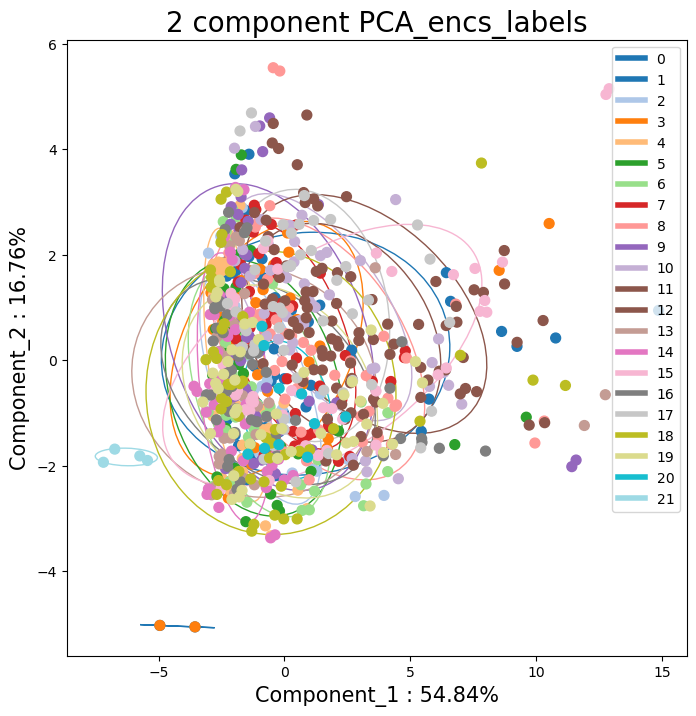

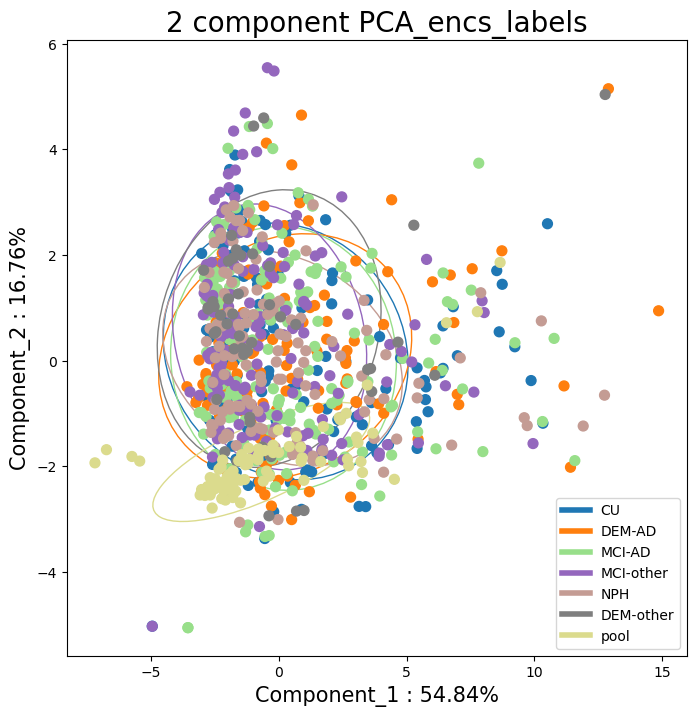

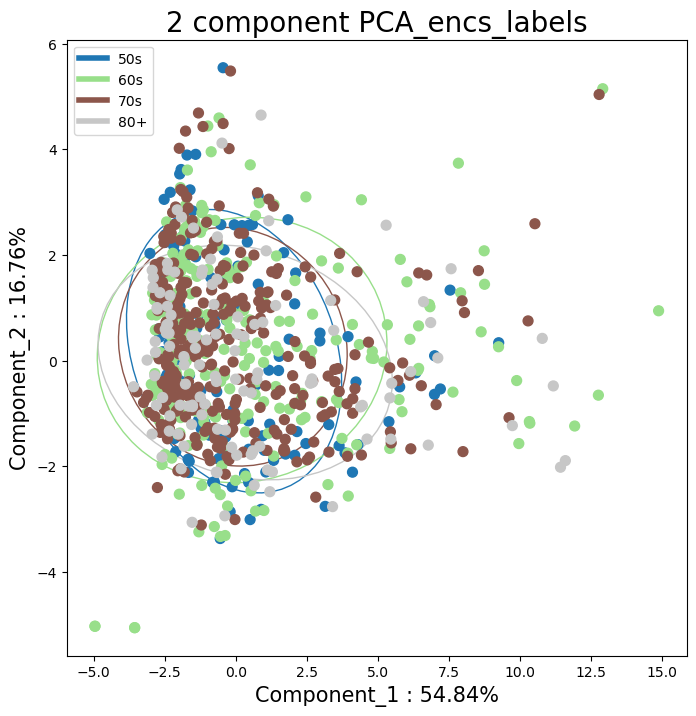

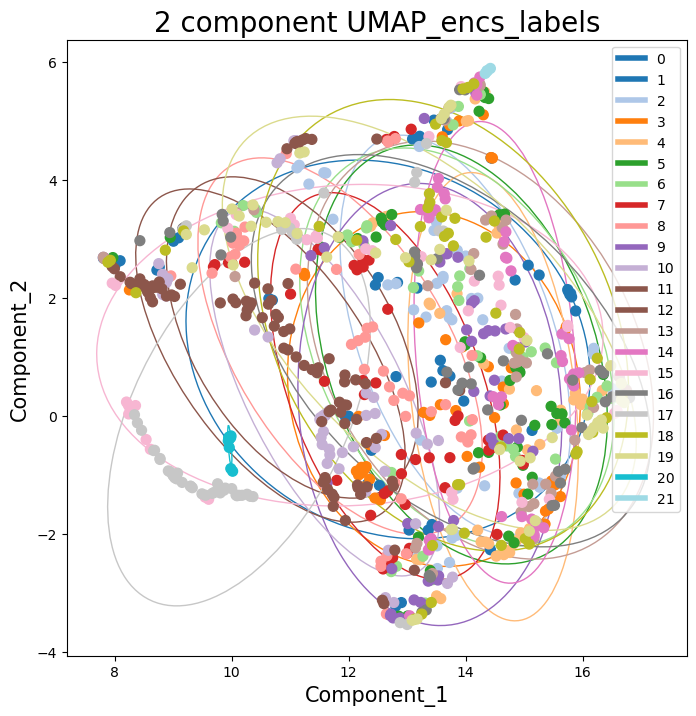

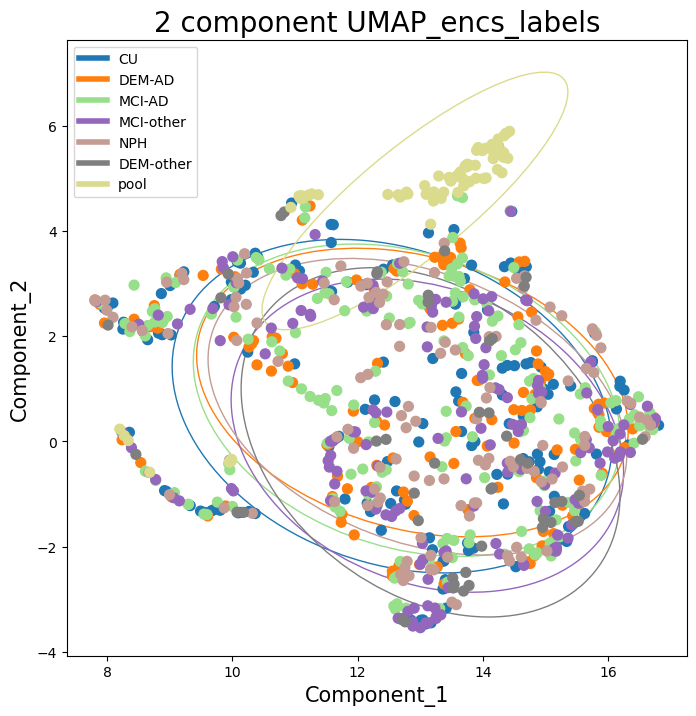

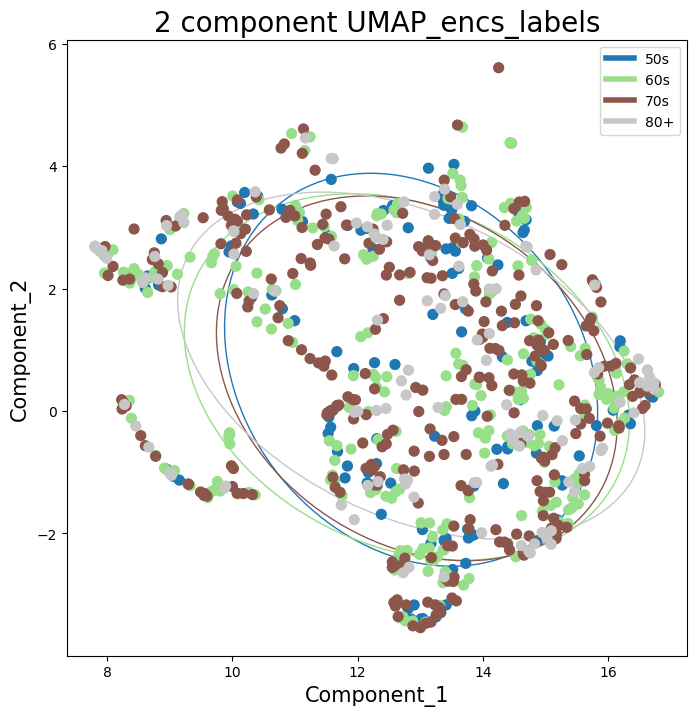

In [276]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [277]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'aedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'aedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [278]:
if train_models:
    train_rfc(enc_data, 'aedann-enc', n_meta)
    train_linsvc(enc_data, 'aedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [279]:
path = 'data'
data, unique_labels = get_harvard(path, 'unique_genes.csv', 'CU_DEM-AD')
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

In [280]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in rec_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)
for group in rec_data['inputs']:
    rec_data['inputs'][group] = pd.DataFrame(rec_data['inputs'][group])


In [281]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  -----------  ---
CU_DEM-AD            3.86341e-09    1
CU_MCI-AD            3.34849e-11    1
CU_MCI-other         0.0017311      2
CU_NPH               2.23092e-20    1
CU_DEM-other         0.000359143  107
DEM-AD_MCI-AD        0.962634       0
DEM-AD_MCI-other     0.119912       0
DEM-AD_NPH           0.122183       0
DEM-AD_DEM-other     0.0123373     84
MCI-AD_MCI-other     0.0657709      0
MCI-AD_NPH           0.000512278    1
MCI-AD_DEM-other     0.000190548  192
MCI-other_NPH        1.42179e-09    2
MCI-other_DEM-other  0.00840903    11
NPH_DEM-other        0.000240465  182
-------------------  -----------  ---
ttests
-------------------  -----------  ---
CU_DEM-AD            1.75904e-10    1
CU_MCI-AD            8.08004e-12    1
CU_MCI-other         0.00383981     2
CU_NPH               1.00088e-24    1
CU_DEM-other         0.000351754   76
DEM-AD_MCI-AD        0.999476       0
DEM-AD_MCI-other     0.0821074      0
DEM-AD

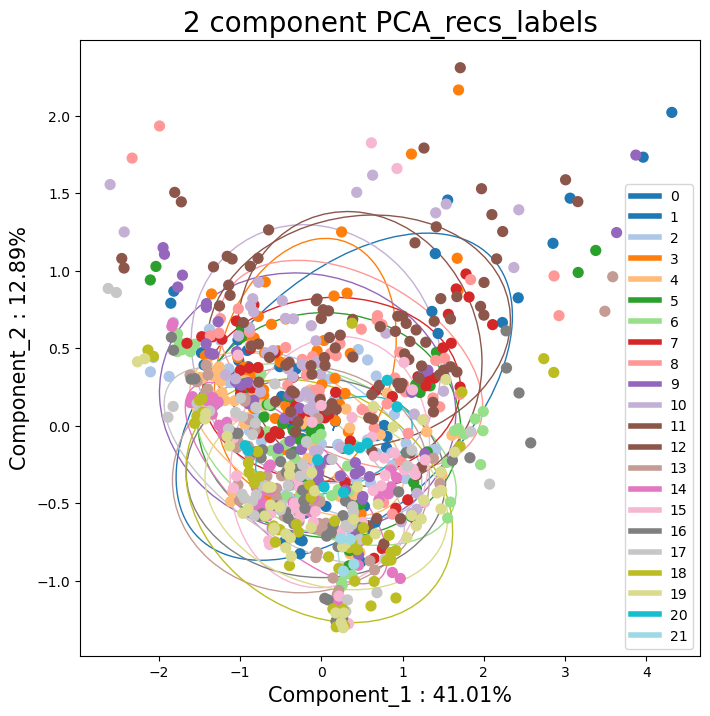

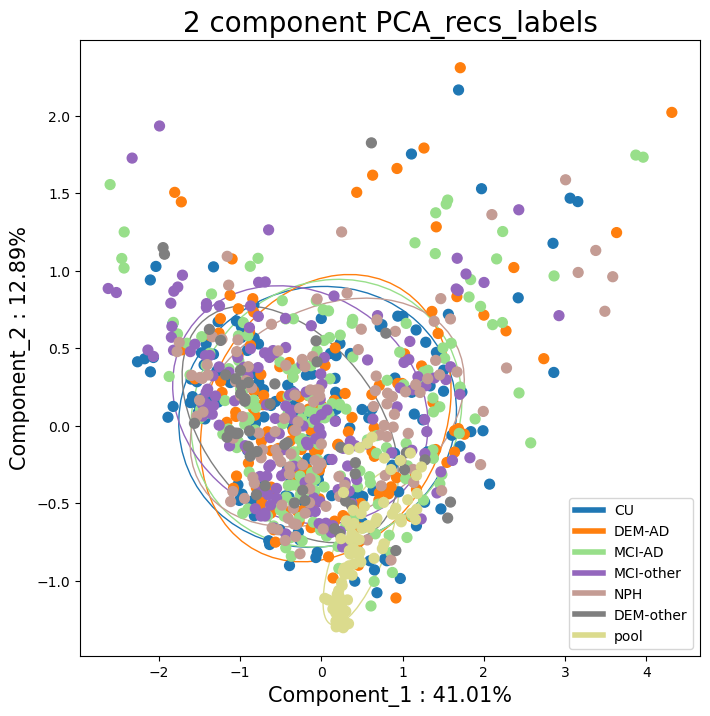

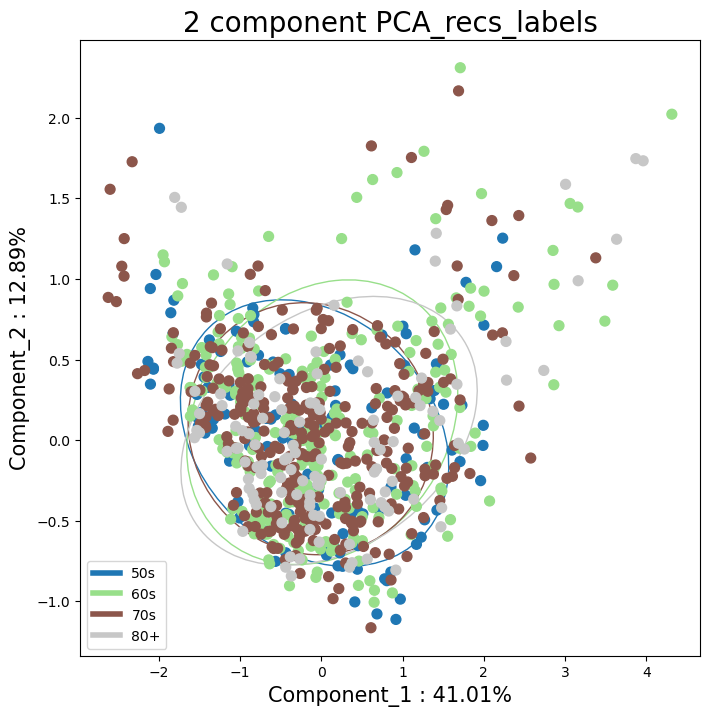

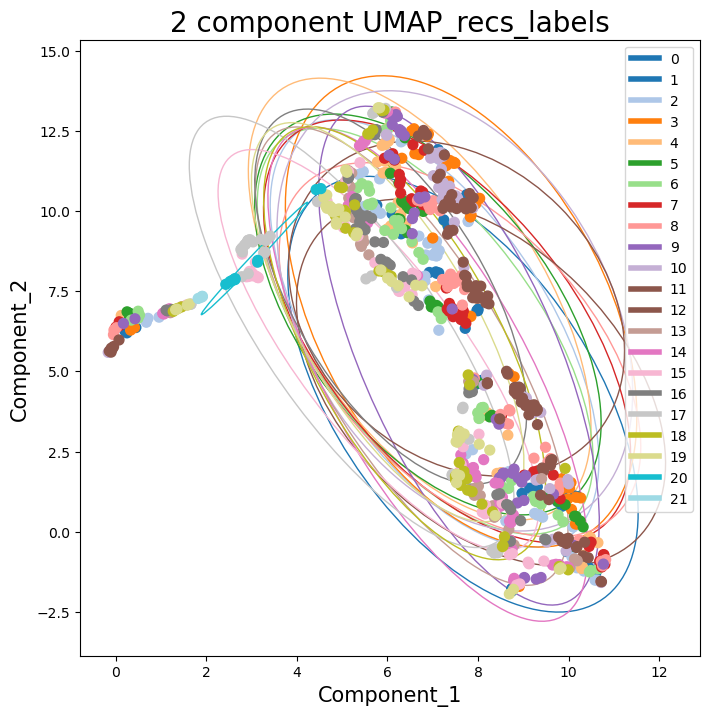

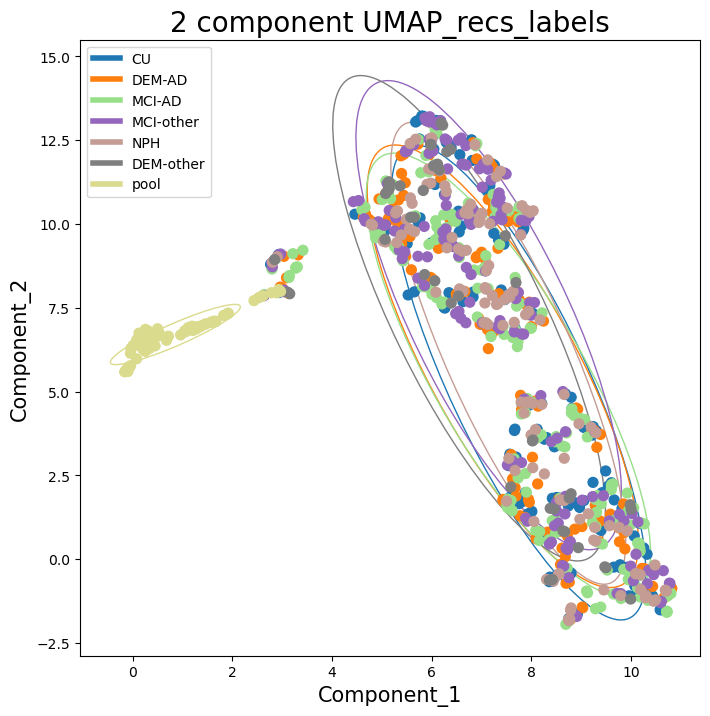

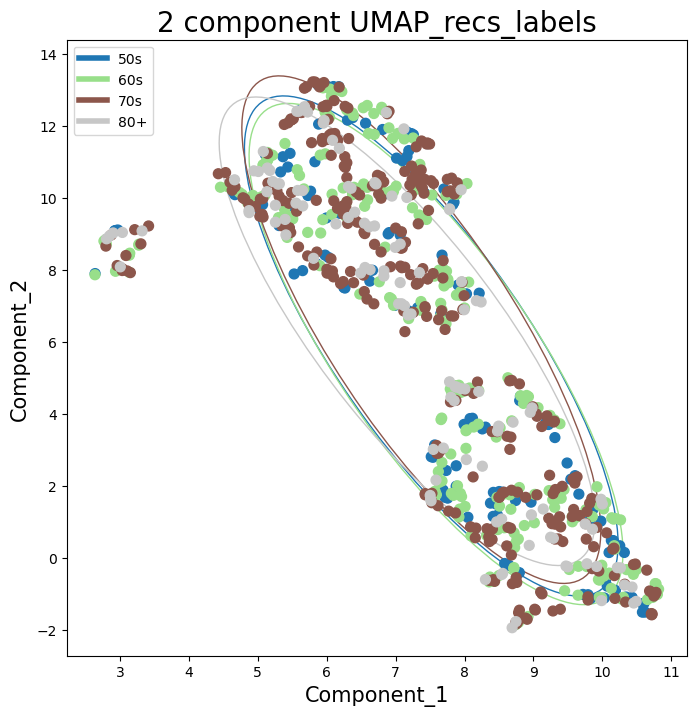

In [282]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [283]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'aedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'aedann-rec', device='cuda')
    # metrics['aedann-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [284]:
if train_models:
    train_rfc(rec_data, 'aedann-rec', n_meta)
    train_linsvc(rec_data, 'aedann-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# VAEDANN

## Encoded

In [285]:
path = 'data'
data, unique_labels = get_harvard(path, 'unique_genes.csv', 'CU_DEM-AD')
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

In [286]:
data['inputs']['all'].shape

(921, 548)

In [287]:
# BAT-50
path='logs/ae_then_classifier_holdout/0eea9b1e-bfda-4420-92a6-722ded1ba914/model_0.pth'

In [288]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder
best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=22,
                 nb_classes=2,
                 mapper=0,
                 layer1=1137,
                 layer2=260,
                 # layer3=layer3,
                 n_meta=0,
                 n_emb=2,
                 dropout=0,
                 variational=1, conditional=False,
                 zinb=0, add_noise=0, tied_weights=0,
                 use_gnn=0, device='cuda').to('cuda')

best_ae2.mapper.to('cuda')
best_ae2.dec.to('cuda')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cuda:0'))
best_ae2.eval()
pass

In [289]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = enc_data['inputs'][group].detach().cpu().numpy()
    if n_meta == 2:
        enc_data['inputs'][group] = np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1)
for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group])


In [290]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  -----------  -
CU_DEM-AD            1.84039e-09  1
CU_MCI-AD            1.5951e-11   1
CU_MCI-other         0.000824634  2
CU_NPH               1.06273e-20  1
CU_DEM-other         0.00292152   1
DEM-AD_MCI-AD        0.466878     0
DEM-AD_MCI-other     0.0545883    0
DEM-AD_NPH           0.42701      0
DEM-AD_DEM-other     0.00463202   6
MCI-AD_MCI-other     0.365418     0
MCI-AD_NPH           0.000244031  1
MCI-AD_DEM-other     0.0291871    2
MCI-other_NPH        6.77288e-10  1
MCI-other_DEM-other  0.580081     0
NPH_DEM-other        0.118401     0
-------------------  -----------  -
ttests
-------------------  -----------  -
CU_DEM-AD            8.37945e-11  1
CU_MCI-AD            3.84904e-12  1
CU_MCI-other         0.00182914   4
CU_NPH               4.76781e-25  1
CU_DEM-other         0.000461736  1
DEM-AD_MCI-AD        0.544715     0
DEM-AD_MCI-other     0.0477104    4
DEM-AD_NPH           0.121794     0
DEM-AD_DEM-other    

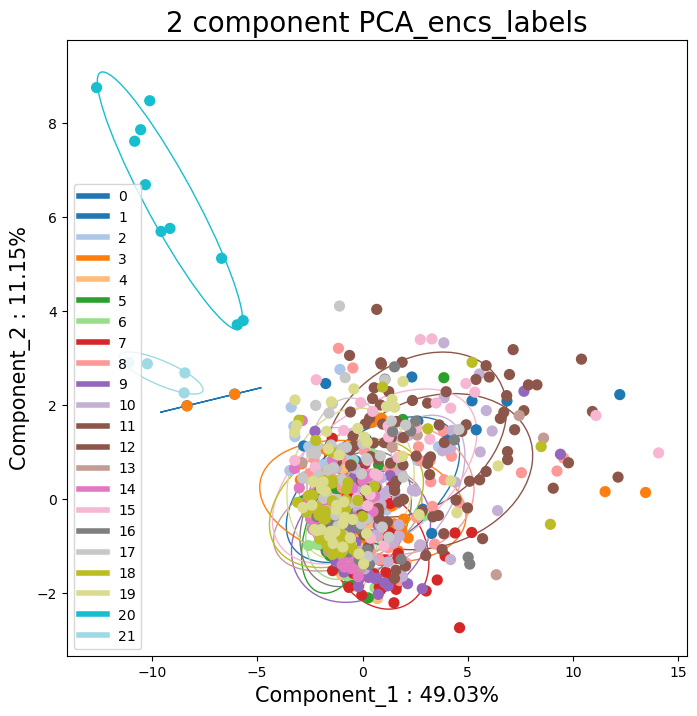

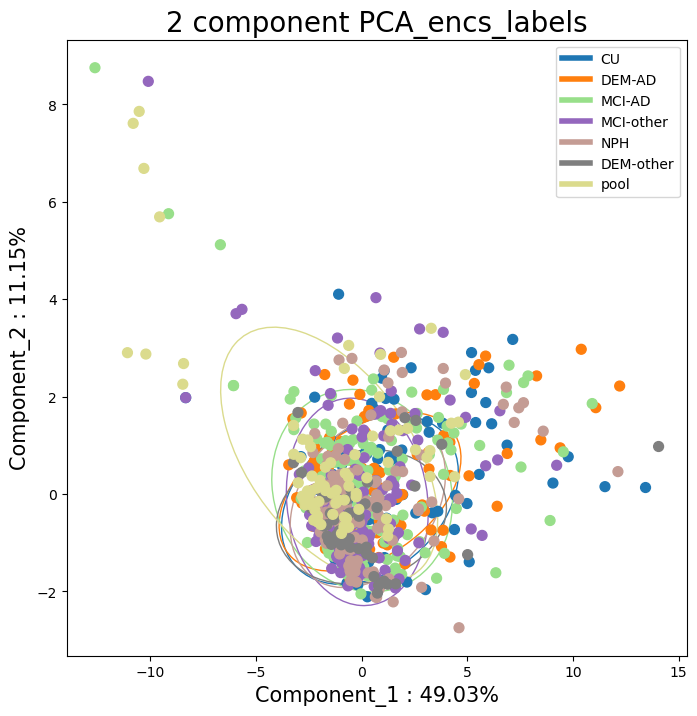

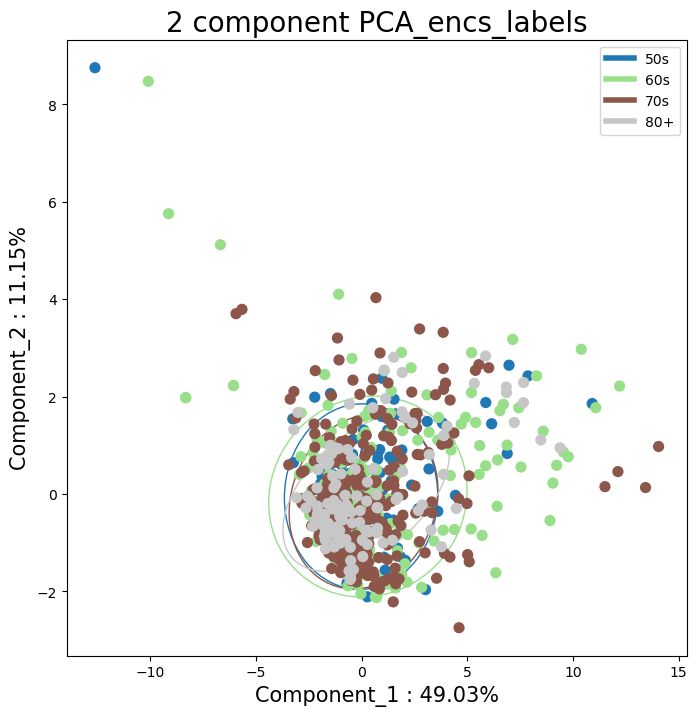

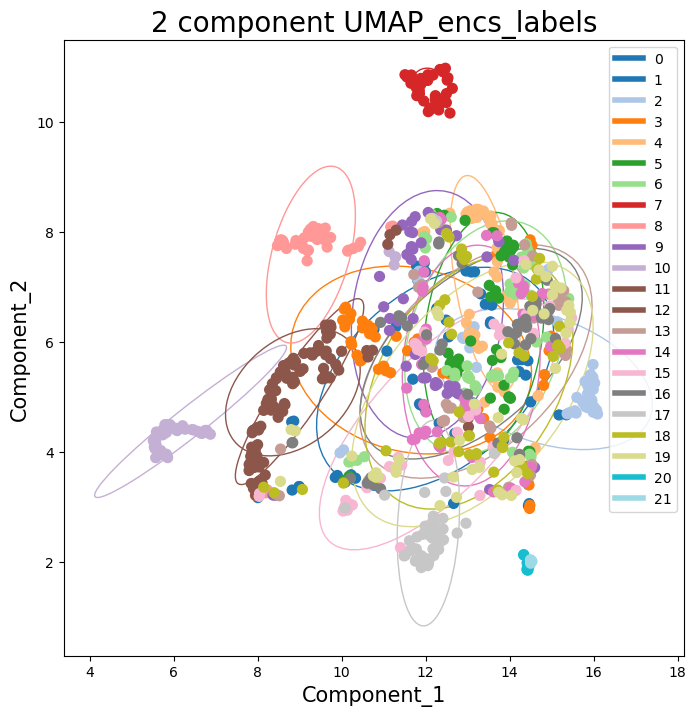

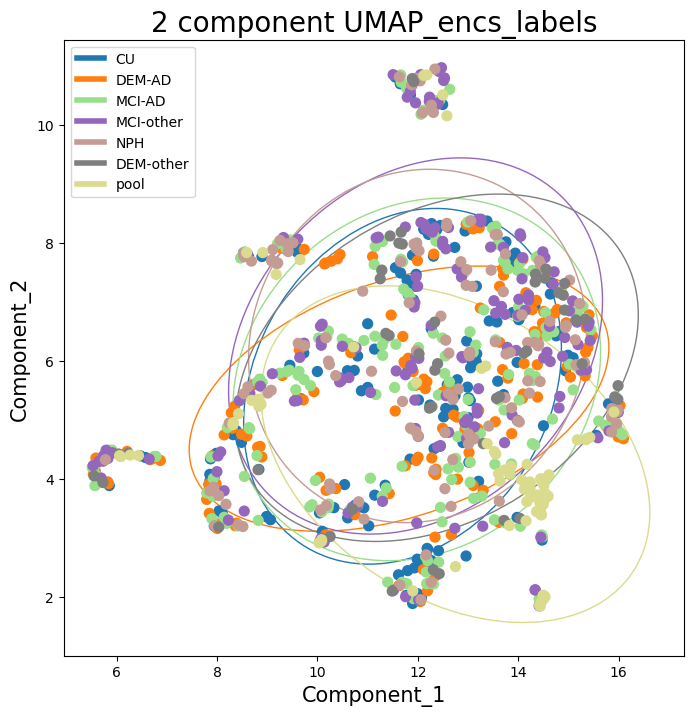

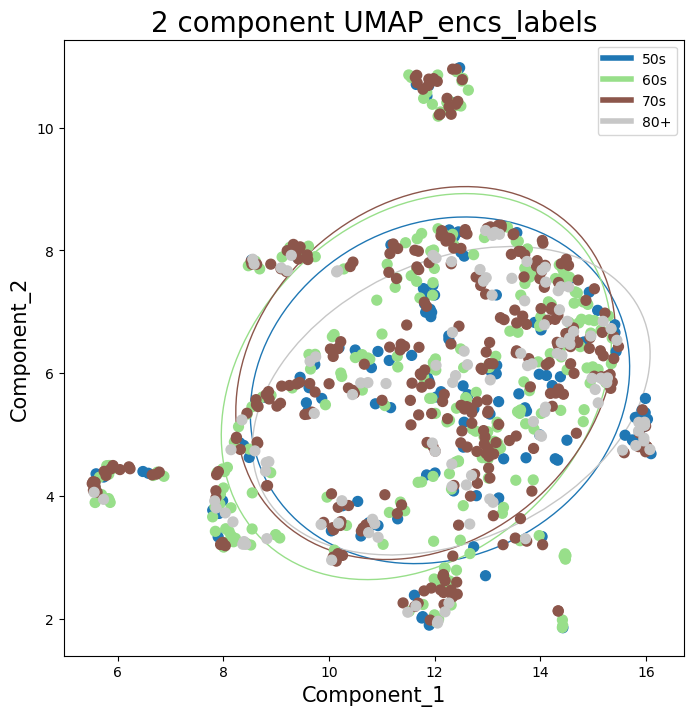

In [291]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [292]:
if log_stuff:
    metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vaedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vaedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [293]:
if train_models:
    train_rfc(enc_data, 'vaedann-enc', n_meta)
    train_linsvc(enc_data, 'vaedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

## Reconstruction

In [294]:
path = 'data'
data, unique_labels = get_harvard(path, 'unique_genes.csv', 'CU_DEM-AD')
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

In [295]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']])
rec_data = data.copy()
_, rec_data['inputs']['all'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
_, rec_data['inputs']['all_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
_, rec_data['inputs']['train'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
_, rec_data['inputs']['train_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
_, rec_data['inputs']['valid'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
_, rec_data['inputs']['valid_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
_, rec_data['inputs']['test'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
_, rec_data['inputs']['test_pool'], _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in rec_data['inputs']:
    rec_data['inputs'][group] = rec_data['inputs'][group]['mean'][-1].detach().cpu().numpy()
    if n_meta == 2:
        rec_data['inputs'][group] = np.concatenate((rec_data['inputs'][group], rec_data['meta'][group]), 1)
for group in rec_data['inputs']:
    rec_data['inputs'][group] = pd.DataFrame(rec_data['inputs'][group])


In [296]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                rec_data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-------------------  -----------  ---
CU_DEM-AD            3.86341e-09    1
CU_MCI-AD            3.34849e-11    1
CU_MCI-other         0.0017311      2
CU_NPH               2.23092e-20    1
CU_DEM-other         0.00613296     1
DEM-AD_MCI-AD        1              0
DEM-AD_MCI-other     0.0291153    148
DEM-AD_NPH           0.896395       0
DEM-AD_DEM-other     0.00697297   175
MCI-AD_MCI-other     0.0667632      0
MCI-AD_NPH           0.000512278    1
MCI-AD_DEM-other     0.0320849     10
MCI-other_NPH        1.42179e-09    1
MCI-other_DEM-other  0.892262       0
NPH_DEM-other        0.0487925     32
-------------------  -----------  ---
ttests
-------------------  -----------  ---
CU_DEM-AD            1.75904e-10    1
CU_MCI-AD            8.08004e-12    1
CU_MCI-other         0.00383981     2
CU_NPH               1.00088e-24    1
CU_DEM-other         0.000969294    1
DEM-AD_MCI-AD        0.999909       0
DEM-AD_MCI-other     0.0175704    179
DEM-AD

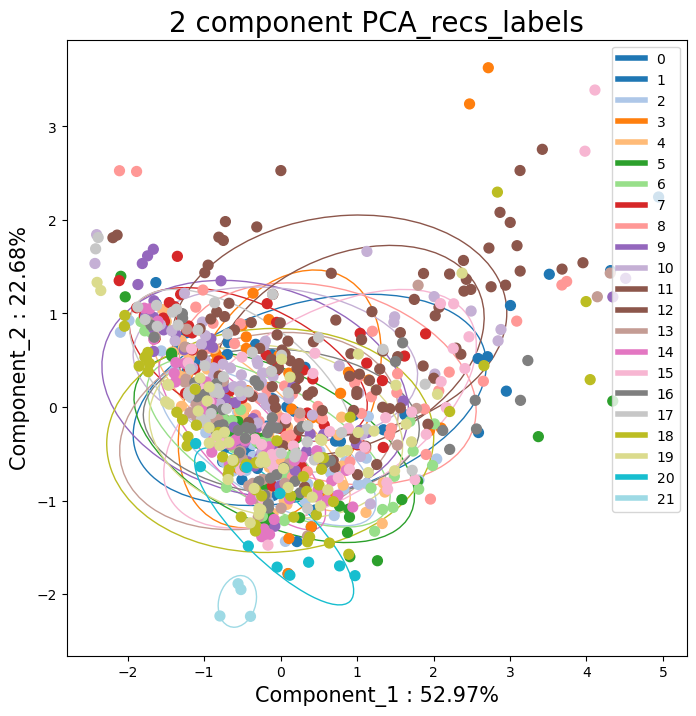

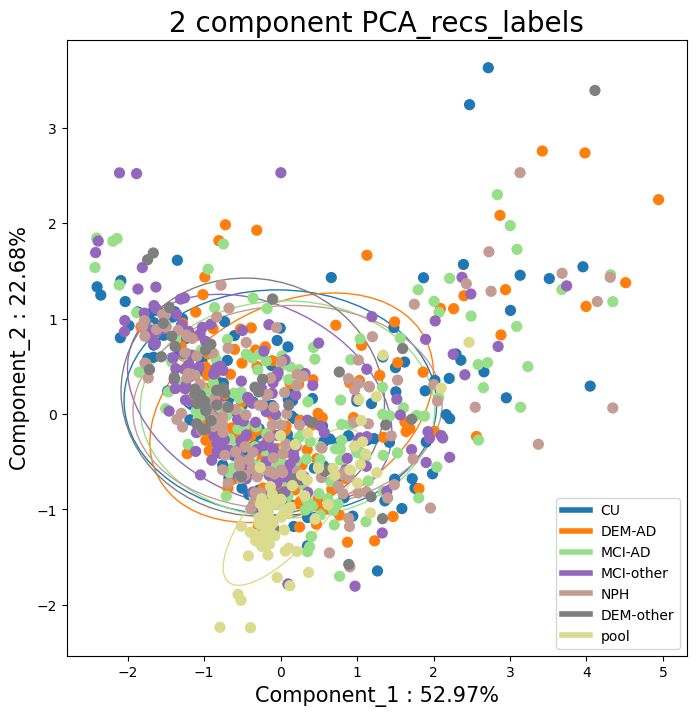

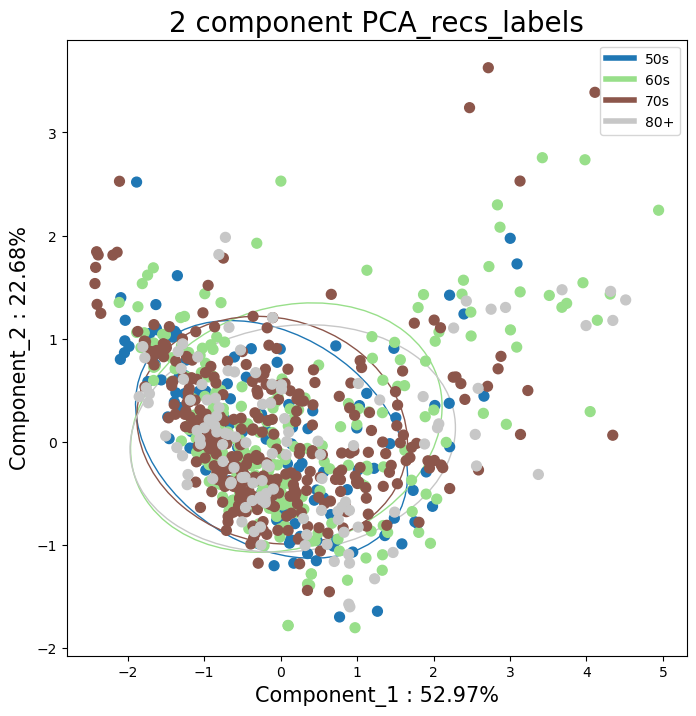

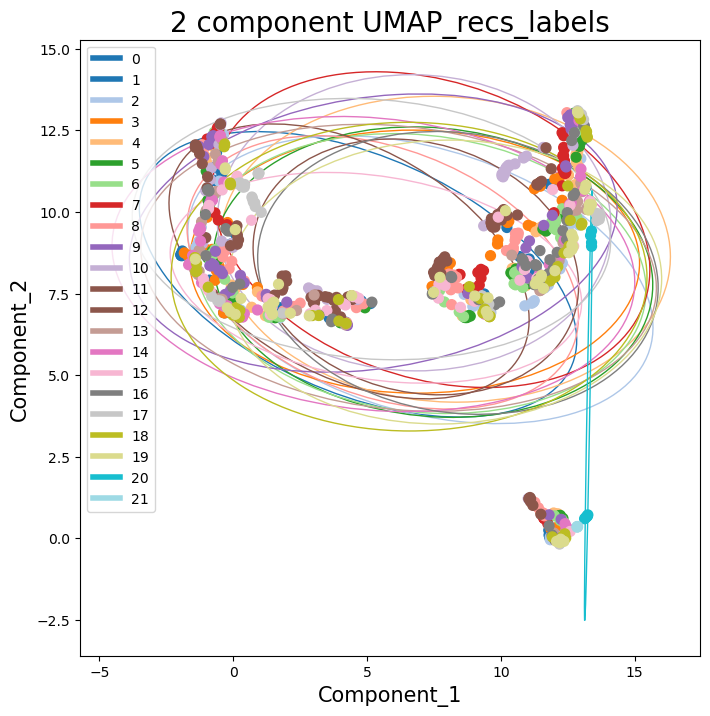

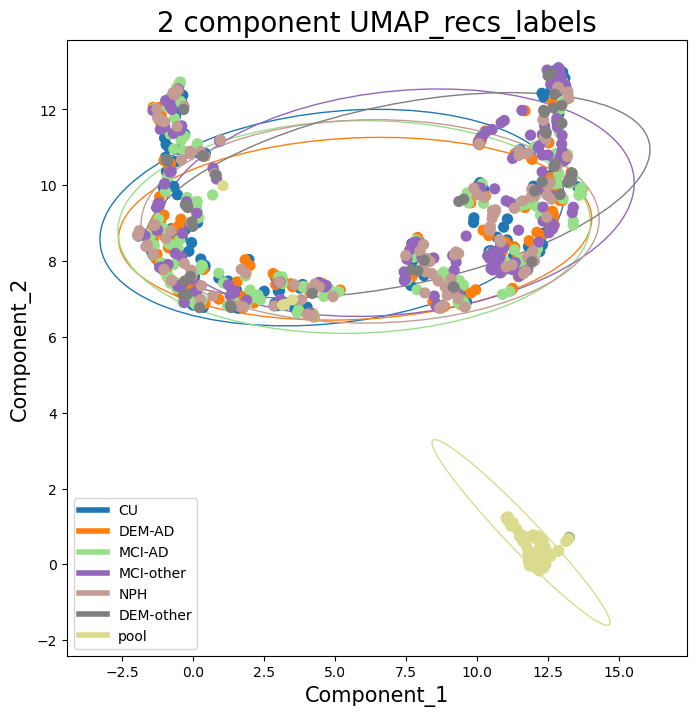

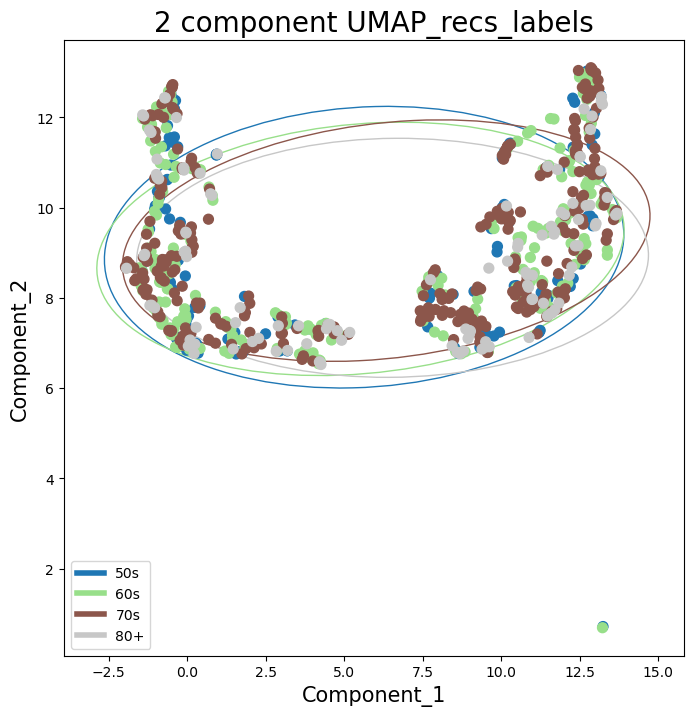

In [297]:
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_recs_labels'}, rec_data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages}, 0)


In [298]:
if log_stuff:
    metrics = log_pool_metrics(rec_data['inputs'], rec_data['batches'], metrics, 'vaedann-rec')
    metrics = log_metrics(rec_data, unique_labels, rec_data['batches'], metrics, 'vaedann-rec', device='cuda')
    # metrics['aedann-rec']['all']['LDA_score'] = log_LDA(LDA, rec_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-rec')


In [299]:
if train_models:
    train_rfc(rec_data, 'vaedann-rec', n_meta)
    train_linsvc(rec_data, 'vaedann-rec', n_meta)
    # train_logreg(rec_data, 'aedann-rec', n_meta)
    

# Table

In [92]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['qc_aPCC', 'qc_dist', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols + cols_pool, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,qc_dist,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score,pool lisi,pool silhouette,pool kbet,pool shannon,pool adjusted_rand_score,pool adjusted_mutual_info_score
raw,0.815415,93.766194,0.838954,1.825332,0.232852,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
minmax,0.480164,17.478582,0.902304,2.131924,0.244783,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
minmax_per_batch,0.325926,23.105922,0.967037,2.384002,0.16348,0.000831,0.000349,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
standard,0.18279,103.20065,0.913505,1.904793,0.202406,0.0,-0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
standard_per_batch,0.239696,105.406473,0.961342,2.190061,-0.000819,0.0,0.404963,0.942709,0.913184,NaN,NaN,NaN,NaN,NaN,NaN
robust,0.310263,96.056239,0.881791,2.12807,0.152401,0.0,0.011446,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
robust_per_batch,0.360971,129.532757,1.035938,2.223215,0.005672,0.005882,0.541351,0.737838,0.703037,NaN,NaN,NaN,NaN,NaN,NaN
combat,0.007842,224.930419,1.124378,1.019799,-0.012343,0.0,0.85594,0.008774,0.02677,NaN,NaN,NaN,NaN,NaN,NaN
pycombat,0.946891,47.232986,0.781819,1.807862,-0.024452,0.0,0.400091,0.127534,0.295676,NaN,NaN,NaN,NaN,NaN,NaN


In [301]:
row

'vaedann-rec'